# 9.7 Mini-Project: SQLite DB Creation 

Derek Banks (dmb3ey)

Camille Leonard (cvl7qu)

Gary Mitchell (gm3gq)

For this project, we sourced the [Kepler Exoplanet Search Results](https://www.kaggle.com/nasa/kepler-exoplanet-search-results) collected by the Kepler Space Observatory from Kaggle. We created three tables: Exoplanet_info, Transit_Properties, and Stellar_Parameters in our database. The ER diagram and corresponding schema can be found below. 

## ER Diagram
![ER Diagram](9.7_Mini_Project_ER_Diagram_3.png)

## DB Schema 

Exoplanet_info(<ins>kepoi_name</ins>, koi_score, kepid, kepler_name, koi_disposition)

Transit_Properties(<ins>kepoi_name</ins>, koi_impact, kepid, koi_insol, koi_duration, koi_period, koi_time0bk, koi_depth, koi_prad, koi_teq)

Stellar_Parameters(<ins>kepoi_name</ins>, kepid, koi_steff, koi_slogg, koi_srad)

has(<ins>Exoplanet.kepoi_name</ins>, Transit_properties.kepoi_name, Stellar_Parameters.kepoi_name) 

## Database Creation 

In [5]:
import sqlite3
import csv
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import os.path

In [6]:
#Remove Kepler Datbase if it exists.
if os.path.exists("Kepler.db"):
    print("Database Exists... Deleting Kepler.db")
    os.remove("Kepler.db")
    

Database Exists... Deleting Kepler.db


In [7]:
conn = sqlite3.connect('Kepler.db')

cursor = conn.cursor()

sql = '''
    
    CREATE TABLE "Exoplanet_info" (
	"kepid"	NUMERIC,
	"kepoi_name"	TEXT,
	"kepler_name"	TEXT,
	"koi_disposition"	TEXT,
    "koi_score"   REAL,
	PRIMARY KEY("kepoi_name")
);
    
    '''
    
# Use the cursor to execute the statement
cursor.execute(sql)

# Use the cursor to close the connection to the database, now that we're done.
cursor.close()

In [8]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()

# Output to screen so user knows what is going on
print("Inputting the following information into the database: ")

# Open a file for reading using csv.reader [See above for file contents]
with open('cumulative.csv', 'r') as dataFile:
    reader = csv.reader(dataFile)
    for kepData in reader: # for each row in reader...
        # Find the length (i.e. how many elements in the list) (should be 3)
        numElements = len(kepData)
        print(kepData)
        kepid = kepData[1]
        kepoi_name = kepData[2]
        kepler_name = kepData[3]
        koi_disposition = kepData[4]
        koi_score = kepData[6]
        sql = '''insert into Exoplanet_info
             (kepid, kepoi_name, kepler_name, koi_disposition, koi_score)
             values
             (:kepid_ph, :kep_name_ph, :kepler_name_ph, :koi_disposition_ph, :koi_score_ph)'''
             # These values are "named parameters" (like place holders)
             # Tells the SQLite library that something will be substitued here
    
        # Use the cursor to execute the statement
        # Here, a dictionary has been added of the named parameters and the items
        # to be inserted.
        cursor.execute(sql, {'kepid_ph':kepid, 
                             'kep_name_ph':kepoi_name, 
                             'kepler_name_ph':kepler_name, 
                             'koi_disposition_ph':koi_disposition,
                             'koi_score_ph':koi_score})
    
        # Commit. Telling SQLite to save the new data. The data would be lost otherwise.
        conn.commit()
    

# Use the cursor to close the connection to the database, now that we're done.
cursor.close()

Inputting the following information into the database: 
['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_disposition', 'koi_pdisposition', 'koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss', 'koi_fpflag_co', 'koi_fpflag_ec', 'koi_period', 'koi_period_err1', 'koi_period_err2', 'koi_time0bk', 'koi_time0bk_err1', 'koi_time0bk_err2', 'koi_impact', 'koi_impact_err1', 'koi_impact_err2', 'koi_duration', 'koi_duration_err1', 'koi_duration_err2', 'koi_depth', 'koi_depth_err1', 'koi_depth_err2', 'koi_prad', 'koi_prad_err1', 'koi_prad_err2', 'koi_teq', 'koi_teq_err1', 'koi_teq_err2', 'koi_insol', 'koi_insol_err1', 'koi_insol_err2', 'koi_model_snr', 'koi_tce_plnt_num', 'koi_tce_delivname', 'koi_steff', 'koi_steff_err1', 'koi_steff_err2', 'koi_slogg', 'koi_slogg_err1', 'koi_slogg_err2', 'koi_srad', 'koi_srad_err1', 'koi_srad_err2', 'ra', 'dec', 'koi_kepmag']
['1', '10797460', 'K00752.01', 'Kepler-227 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '9.488035570', '2.7750000e-05', '-2.7750

['229', '5812701', 'K00012.01', 'Kepler-448 b', 'CONFIRMED', 'CANDIDATE', '0.6350', '0', '0', '0', '0', '17.855221681', '3.6760000e-06', '-3.6760000e-06', '146.5964660', '1.630000e-04', '-1.630000e-04', '0.0750', '0.1060', '-0.0430', '7.41287', '0.00581', '-0.00581', '9.0652e+03', '1.120e+01', '-1.120e+01', '13.16', '2.570e+00', '-6.500e-01', '911.0', '', '', '163.04', '78.35', '-23.38', '915.70', '1', 'q1_q17_dr25_tce', '6823.00', '61.00', '-92.00', '4.308', '0.024', '-0.128', '1.3670', '0.2670', '-0.0670', '297.453740', '41.010990', '11.353']
['230', '8013419', 'K00901.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '12.732624065', '4.3970000e-06', '-4.3970000e-06', '176.9390540', '2.730000e-04', '-2.730000e-04', '0.8110', '0.0200', '-0.0330', '2.20830', '0.04320', '-0.04320', '6.4657e+03', '4.100e+01', '-4.100e+01', '4.87', '9.700e-01', '-9.600e-01', '432.0', '', '', '8.22', '11.81', '-4.37', '210.50', '1', 'q1_q17_dr25_tce', '3950.00', '560.00', '-301.00', '4.721',

['471', '8330548', 'K01132.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '1.914158508', '1.5140000e-06', '-1.5140000e-06', '134.6449190', '6.650000e-04', '-6.650000e-04', '0.9420', '0.4870', '-0.0350', '3.29170', '0.04610', '-0.04610', '7.8292e+03', '8.350e+01', '-8.350e+01', '13.63', '4.730e+00', '-1.570e+00', '1646.0', '', '', '1730.47', '1771.72', '-553.75', '124.60', '1', 'q1_q17_dr25_tce', '6289.00', '174.00', '-217.00', '4.407', '0.070', '-0.224', '1.1180', '0.3880', '-0.1290', '301.016720', '44.233841', '14.446']
['472', '3348082', 'K01196.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '3.982166980', '1.4550000e-05', '-1.4550000e-05', '135.5274900', '3.260000e-03', '-3.260000e-03', '0.7750', '0.0520', '-0.5400', '2.39600', '0.10900', '-0.10900', '3.8130e+02', '1.630e+01', '-1.630e+01', '3.32', '5.200e-01', '-8.400e-01', '1374.0', '', '', '842.48', '351.33', '-395.71', '27.10', '1', 'q1_q17_dr25_tce', '5570.00', '83.00', '-

['492', '8397446', 'K01135.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '0', '0.986620248', '1.4970000e-06', '-1.4970000e-06', '448.5959000', '1.140000e-03', '-1.140000e-03', '1.2520', '0.4590', '-0.1590', '3.97220', '0.05020', '-0.05020', '1.3458e+03', '1.400e+01', '-1.400e+01', '43.98', '1.200e+01', '-1.201e+01', '2308.0', '', '', '6719.67', '5609.21', '-3684.95', '117.70', '1', 'q1_q17_dr25_tce', '6243.00', '197.00', '-241.00', '4.176', '0.246', '-0.164', '1.3850', '0.3780', '-0.3780', '301.400670', '44.318039', '15.022']
['493', '8386035', 'K01136.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '1', '1.634846310', '', '', '134.5121150', '', '', '', '', '', '6.11000', '', '', '', '', '', '', '', '', '', '', '', '17098.40', '21733.27', '-11862.97', '', '1', 'q1_q17_dr25_tce', '', '', '', '', '', '', '', '', '', '298.211880', '44.324638', '12.647']
['494', '3962243', 'K01203.02', 'Kepler-276 b', 'CONFIRMED', 'CANDIDATE', '0.9850', '0', '0

['753', '11193263', 'K01438.01', 'Kepler-848 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '6.911342230', '2.4770000e-05', '-2.4770000e-05', '136.6487800', '2.720000e-03', '-2.720000e-03', '0.2590', '0.1750', '-0.2590', '5.67430', '0.07880', '-0.07880', '2.0170e+02', '5.200e+00', '-5.200e+00', '1.90', '3.500e-01', '-3.700e-01', '1086.0', '', '', '328.65', '166.16', '-131.70', '44.00', '1', 'q1_q17_dr25_tce', '5685.00', '114.00', '-103.00', '4.194', '0.162', '-0.108', '1.3500', '0.2420', '-0.2660', '293.288270', '48.811619', '14.056']
['754', '11027624', 'K01439.01', 'Kepler-849 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '394.624951400', '8.1710000e-04', '-8.1710000e-04', '177.8453400', '1.540000e-03', '-1.540000e-03', '0.3360', '0.0920', '-0.2290', '24.10800', '0.10700', '-0.10700', '2.0133e+03', '1.010e+01', '-1.010e+01', '7.79', '1.270e+00', '-1.900e+00', '325.0', '', '', '2.65', '1.20', '-1.26', '234.60', '1', 'q1_q17_dr25_tce', '5910.00', '107.00', '-

['774', '7532973', 'K01450.01', 'Kepler-854 b', 'CONFIRMED', 'FALSE POSITIVE', '0.0410', '0', '1', '0', '0', '2.144632238', '1.2660000e-06', '-1.2660000e-06', '133.9841280', '4.820000e-04', '-4.820000e-04', '1.2280', '0.0590', '-0.0480', '6.27010', '0.03620', '-0.03620', '1.9837e+04', '7.690e+01', '-7.690e+01', '59.19', '1.796e+01', '-1.197e+01', '1736.0', '', '', '2146.82', '1923.32', '-961.12', '334.80', '1', 'q1_q17_dr25_tce', '6296.00', '175.00', '-219.00', '4.240', '0.180', '-0.180', '1.3050', '0.3960', '-0.2640', '293.351290', '43.134640', '13.480']
['775', '9632895', 'K01451.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '27.322044880', '1.1640000e-06', '-1.1640000e-06', '159.7472774', '3.350000e-05', '-3.350000e-05', '0.2570', '0.0030', '-0.0040', '5.67160', '0.00279', '-0.00279', '7.7474e+04', '2.570e+01', '-2.570e+01', '21.58', '4.720e+00', '-1.910e+00', '531.0', '', '', '18.81', '12.28', '-4.79', '3622.70', '1', 'q1_q17_dr25_tce', '5620.00', '152.

['1066', '9015738', 'K01616.01', 'Kepler-909 b', 'CONFIRMED', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '13.932915480', '4.4590000e-05', '-4.4590000e-05', '139.4105800', '2.580000e-03', '-2.580000e-03', '0.9080', '0.0310', '-0.6180', '2.62390', '0.07140', '-0.07140', '1.3160e+02', '5.100e+00', '-5.100e+00', '1.66', '2.900e-01', '-1.900e-01', '852.0', '', '', '124.53', '61.30', '-35.53', '28.90', '1', 'q1_q17_dr25_tce', '6026.00', '121.00', '-133.00', '4.321', '0.088', '-0.121', '1.2070', '0.2100', '-0.1400', '289.506350', '45.370998', '11.538']
['1067', '7215603', 'K01618.01', 'Kepler-910 b', 'CONFIRMED', 'CANDIDATE', '0.9120', '0', '0', '0', '0', '2.364367620', '1.8970000e-05', '-1.8970000e-05', '132.2500700', '6.630000e-03', '-6.630000e-03', '0.1460', '0.3170', '-0.1460', '3.37200', '0.20200', '-0.20200', '2.8400e+01', '2.700e+00', '-2.700e+00', '0.82', '2.000e-02', '-2.000e-02', '1752.0', '', '', '2228.09', '203.74', '-233.46', '12.40', '1', 'q1_q17_dr25_tce', '6250.00', '75.00', '

['1082', '5564247', 'K01566.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0010', '0', '0', '1', '0', '1.727177258', '8.8260000e-06', '-8.8260000e-06', '355.3703300', '3.590000e-03', '-3.590000e-03', '0.6760', '0.2880', '-0.4770', '2.08100', '0.12000', '-0.12000', '3.4740e+02', '2.370e+01', '-2.370e+01', '1.42', '2.500e-01', '-1.100e-01', '1250.0', '', '', '576.55', '329.25', '-152.02', '17.10', '1', 'q1_q17_dr25_tce', '5394.00', '187.00', '-187.00', '4.622', '0.035', '-0.105', '0.7200', '0.1230', '-0.0570', '299.141420', '40.725899', '15.935']
['1083', '5438099', 'K01567.01', 'Kepler-306 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '7.240224180', '1.6740000e-05', '-1.6740000e-05', '355.0124300', '1.750000e-03', '-1.750000e-03', '0.5070', '0.3890', '-0.3140', '2.91530', '0.05060', '-0.05060', '8.6490e+02', '1.970e+01', '-1.970e+01', '2.14', '1.400e-01', '-8.000e-02', '716.0', '', '', '62.10', '14.23', '-9.37', '48.20', '1', 'q1_q17_dr25_tce', '4955.00', '100.00', '-100.

['1360', '11601584', 'K01831.02', 'Kepler-324 b', 'CONFIRMED', 'CANDIDATE', '0.9500', '0', '0', '0', '0', '4.385364280', '1.3660000e-05', '-1.3660000e-05', '139.2254800', '2.580000e-03', '-2.580000e-03', '0.3350', '0.1170', '-0.3350', '2.51260', '0.07770', '-0.07770', '1.9850e+02', '8.500e+00', '-8.500e+00', '1.15', '9.000e-02', '-7.000e-02', '935.0', '', '', '180.22', '44.60', '-33.41', '25.90', '2', 'q1_q17_dr25_tce', '5191.00', '103.00', '-103.00', '4.530', '0.044', '-0.055', '0.8260', '0.0610', '-0.0500', '286.471470', '49.649021', '14.122']
['1361', '11601584', 'K01831.03', '', 'CANDIDATE', 'CANDIDATE', '0.8500', '0', '0', '0', '0', '34.205785079', '', '', '148.8050925', '', '', '0.3190', '', '', '5.16910', '', '', '1.8320e+02', '', '', '1.10', '9.000e-02', '-6.000e-02', '471.0', '', '', '11.67', '2.89', '-2.16', '11.60', '4', 'q1_q17_dr25_tce', '5191.00', '103.00', '-103.00', '4.530', '0.044', '-0.055', '0.8260', '0.0610', '-0.0500', '286.471470', '49.649021', '14.122']
['1362', 

['1645', '2989404', 'K01824.02', 'Kepler-323 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '1.678326300', '1.9240000e-06', '-1.9240000e-06', '136.0525900', '9.050000e-04', '-9.050000e-04', '0.9100', '0.0770', '-0.6810', '2.51230', '0.02210', '-0.02210', '1.4630e+02', '2.200e+00', '-2.200e+00', '1.57', '2.600e-01', '-1.800e-01', '1659.0', '', '', '1797.15', '828.74', '-497.48', '76.10', '2', 'q1_q17_dr25_tce', '6015.00', '108.00', '-132.00', '4.370', '0.095', '-0.116', '1.0810', '0.1800', '-0.1200', '291.382230', '38.127468', '12.722']
['1646', '11413812', 'K01885.01', 'Kepler-998 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '5.653781630', '1.1050000e-05', '-1.1050000e-05', '131.7115400', '1.640000e-03', '-1.640000e-03', '0.4390', '0.4510', '-0.2470', '1.94830', '0.04890', '-0.04890', '3.6680e+02', '1.140e+01', '-1.140e+01', '1.82', '5.800e-01', '-1.500e-01', '1020.0', '', '', '256.14', '236.21', '-65.59', '37.80', '1', 'q1_q17_dr25_tce', '5988.00', '161.00'

['1661', '6383785', 'K00239.02', '', 'CANDIDATE', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '3.622755060', '1.4990000e-05', '-1.4990000e-05', '132.9926700', '3.510000e-03', '-3.510000e-03', '0.0070', '0.4560', '-0.0070', '2.78680', '0.09800', '-0.09800', '1.8060e+02', '9.200e+00', '-9.200e+00', '1.62', '2.700e-01', '-2.400e-01', '1304.0', '', '', '683.84', '295.78', '-216.38', '22.30', '2', 'q1_q17_dr25_tce', '5794.00', '78.00', '-78.00', '4.282', '0.137', '-0.112', '1.2160', '0.2010', '-0.1830', '297.201540', '41.730209', '14.762']
['1662', '9411412', 'K02101.01', 'Kepler-1096 b', 'CONFIRMED', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '2.892216772', '7.0090000e-06', '-7.0090000e-06', '132.8772600', '1.920000e-03', '-1.920000e-03', '0.8060', '0.1310', '-0.5800', '1.35960', '0.06860', '-0.06860', '3.6050e+02', '1.830e+01', '-1.830e+01', '1.31', '6.000e-02', '-6.000e-02', '794.0', '', '', '93.66', '16.07', '-15.72', '23.90', '1', 'q1_q17_dr25_tce', '4229.00', '84.00', '-84.00', '4.655'

['1944', '8505920', 'K02094.01', '', 'CANDIDATE', 'CANDIDATE', '0.9740', '0', '0', '0', '0', '42.426964700', '3.3130000e-04', '-3.3130000e-04', '156.1719400', '6.630000e-03', '-6.630000e-03', '0.9620', '0.0510', '-0.0570', '5.90700', '0.63400', '-0.63400', '6.3240e+02', '3.770e+01', '-3.770e+01', '3.44', '5.500e-01', '-4.500e-01', '496.0', '', '', '14.33', '6.12', '-4.14', '26.00', '1', 'q1_q17_dr25_tce', '5330.00', '79.00', '-79.00', '4.366', '0.137', '-0.125', '1.0130', '0.1620', '-0.1330', '295.662870', '44.525841', '15.001']
['1945', '7918992', 'K02095.01', 'Kepler-1091 b', 'CONFIRMED', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '1.434745129', '3.3710000e-06', '-3.3710000e-06', '132.6280200', '2.080000e-03', '-2.080000e-03', '0.1080', '0.3360', '-0.1080', '1.86200', '0.05930', '-0.05930', '2.0070e+02', '8.300e+00', '-8.300e+00', '1.50', '2.300e-01', '-1.300e-01', '1664.0', '', '', '1813.00', '731.22', '-382.77', '28.40', '1', 'q1_q17_dr25_tce', '5806.00', '69.00', '-87.00', '4.400'

['2247', '8676148', 'K02544.01', 'Kepler-1273 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '28.625350200', '2.5540000e-04', '-2.5540000e-04', '158.1182700', '6.980000e-03', '-6.980000e-03', '0.0210', '0.4290', '-0.0210', '4.55100', '0.18400', '-0.18400', '6.5270e+02', '4.070e+01', '-4.070e+01', '2.38', '7.100e-01', '-2.200e-01', '573.0', '', '', '25.54', '22.32', '-7.15', '18.30', '1', 'q1_q17_dr25_tce', '5774.00', '154.00', '-188.00', '4.508', '0.036', '-0.204', '0.9410', '0.2810', '-0.0880', '285.803220', '44.873428', '15.826']
['2248', '9696358', 'K02545.01', 'Kepler-1274 b', 'CONFIRMED', 'CANDIDATE', '0.7390', '0', '0', '0', '0', '6.981413270', '7.6030000e-05', '-7.6030000e-05', '132.7883000', '1.010000e-02', '-1.010000e-02', '0.6990', '0.2740', '-0.5000', '6.52700', '0.30500', '-0.30500', '3.8000e+01', '2.200e+00', '-2.200e+00', '1.42', '9.000e-02', '-1.300e-01', '1384.0', '', '', '865.81', '163.01', '-181.18', '20.90', '1', 'q1_q17_dr25_tce', '6054.00', '81.00', '-

['2553', '9369366', 'K02905.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0010', '0', '0', '1', '0', '36.005441400', '3.1750000e-04', '-3.1750000e-04', '144.3433100', '6.940000e-03', '-6.940000e-03', '0.7450', '0.0560', '-0.5220', '3.26200', '0.29600', '-0.29600', '1.1750e+02', '1.040e+01', '-1.040e+01', '3.33', '5.400e-01', '-1.100e+00', '1024.0', '', '', '259.71', '128.63', '-158.73', '14.60', '1', 'q1_q17_dr25_tce', '7048.00', '172.00', '-246.00', '3.797', '0.252', '-0.108', '2.8380', '0.4690', '-0.9380', '300.660250', '45.853519', '12.477']
['2554', '4552729', 'K02691.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '97.446319400', '2.8600000e-04', '-2.8600000e-04', '204.8300900', '2.290000e-03', '-2.290000e-03', '0.0630', '0.3450', '-0.0630', '6.76500', '0.08680', '-0.08680', '2.1411e+03', '3.970e+01', '-3.970e+01', '3.05', '2.800e-01', '-2.500e-01', '283.0', '', '', '1.52', '0.57', '-0.41', '62.80', '1', 'q1_q17_dr25_tce', '4735.00', '170.00', '-170.00', '4.627'

['2848', '7534267', 'K03147.01', 'Kepler-1441 b', 'CONFIRMED', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '39.442078100', '7.0630000e-04', '-7.0630000e-04', '169.1411000', '1.360000e-02', '-1.360000e-02', '0.4200', '0.0280', '-0.4200', '7.02900', '0.42200', '-0.42200', '1.7240e+02', '1.340e+01', '-1.340e+01', '2.51', '4.000e-01', '-6.200e-01', '682.0', '', '', '51.14', '22.18', '-23.45', '15.20', '1', 'q1_q17_dr25_tce', '5430.00', '81.00', '-73.00', '3.923', '0.188', '-0.101', '1.9020', '0.3090', '-0.4640', '293.719120', '43.124592', '14.268']
['2849', '9592705', 'K00288.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '10.275325130', '1.4420000e-05', '-1.4420000e-05', '177.2722700', '1.140000e-03', '-1.140000e-03', '0.3150', '0.1230', '-0.3150', '6.30930', '0.03960', '-0.03960', '2.0970e+02', '2.400e+00', '-2.400e+00', '3.04', '1.500e-01', '-2.100e-01', '1211.0', '', '', '508.21', '75.80', '-92.88', '99.50', '1', 'q1_q17_dr25_tce', '6150.00', '73.00', '-85.00', '3.960'

['3141', '6042214', 'K00450.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '27.046278860', '4.6360000e-05', '-4.6360000e-05', '171.9552500', '1.300000e-03', '-1.300000e-03', '0.9620', '0.0330', '-0.0250', '2.66600', '0.16400', '-0.16400', '9.0080e+02', '3.510e+01', '-3.510e+01', '3.54', '1.090e+00', '-3.400e-01', '636.0', '', '', '38.62', '35.17', '-10.98', '48.80', '1', 'q1_q17_dr25_tce', '6332.00', '174.00', '-206.00', '4.516', '0.039', '-0.221', '0.9150', '0.2830', '-0.0880', '291.752230', '41.311241', '14.173']
['3142', '6200715', 'K00451.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '3.723560726', '6.5040000e-06', '-6.5040000e-06', '172.1797700', '1.430000e-03', '-1.430000e-03', '0.9540', '0.0060', '-0.5900', '3.43500', '0.17700', '-0.17700', '5.4000e+02', '1.060e+01', '-1.060e+01', '3.46', '1.000e+00', '-4.200e-01', '1401.0', '', '', '910.65', '745.12', '-296.49', '58.90', '1', 'q1_q17_dr25_tce', '6535.00', '154.00', '-212.

['3429', '5966660', 'K00656.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0010', '0', '0', '1', '0', '1.906633332', '2.2960000e-06', '-2.2960000e-06', '170.0641020', '9.110000e-04', '-9.110000e-04', '0.9800', '0.0060', '-0.0030', '3.08250', '0.08040', '-0.08040', '2.6800e+02', '5.800e+00', '-5.800e+00', '2.72', '4.500e-01', '-1.800e-01', '1847.0', '', '', '2745.66', '1143.01', '-494.66', '83.30', '1', 'q1_q17_dr25_tce', '6736.00', '70.00', '-101.00', '4.335', '0.038', '-0.113', '1.2430', '0.2060', '-0.0830', '293.775600', '41.228489', '13.429']
['3430', '6020753', 'K00657.01', 'Kepler-202 b', 'CONFIRMED', 'CANDIDATE', '0.9920', '0', '0', '0', '0', '4.069425638', '4.3360000e-06', '-4.3360000e-06', '171.0177430', '8.570000e-04', '-8.570000e-04', '0.1020', '0.3350', '-0.1020', '2.03960', '0.03140', '-0.03140', '5.4910e+02', '9.300e+00', '-9.300e+00', '1.53', '1.100e-01', '-4.000e-02', '802.0', '', '', '97.72', '22.80', '-13.04', '68.00', '1', 'q1_q17_dr25_tce', '4671.00', '93.00', '-93.

['3740', '4673628', 'K04056.01', '', 'CANDIDATE', 'CANDIDATE', '0.8380', '0', '0', '0', '0', '3.951383138', '6.2510000e-06', '-6.2510000e-06', '132.0646200', '1.180000e-03', '-1.180000e-03', '1.2170', '6.7180', '-0.1300', '1.05820', '0.07870', '-0.07870', '4.0570e+02', '2.060e+01', '-2.060e+01', '23.51', '5.670e+00', '-3.060e+00', '1083.0', '', '', '324.78', '238.09', '-104.30', '23.90', '1', 'q1_q17_dr25_tce', '5570.00', '166.00', '-149.00', '4.458', '0.104', '-0.169', '0.8990', '0.2170', '-0.1170', '296.403750', '39.722649', '14.368']
['3741', '11401767', 'K02195.03', 'Kepler-372 b', 'CONFIRMED', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '6.849787280', '5.2430000e-05', '-5.2430000e-05', '134.6616700', '7.550000e-03', '-7.550000e-03', '0.9540', '0.0030', '-0.6960', '4.91900', '0.16200', '-0.16200', '1.3920e+02', '9.000e+00', '-9.000e+00', '1.83', '3.000e-01', '-2.100e-01', '1081.0', '', '', '322.19', '140.61', '-82.27', '17.00', '3', 'q1_q17_dr25_tce', '6056.00', '81.00', '-90.00', '

['4018', '3124598', 'K04187.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '7.071623080', '4.6430000e-05', '-4.6430000e-05', '136.4625300', '5.780000e-03', '-5.780000e-03', '0.3310', '0.1510', '-0.3310', '2.58700', '0.17900', '-0.17900', '1.2300e+02', '8.700e+00', '-8.700e+00', '1.42', '3.900e-01', '-3.200e-01', '1162.0', '', '', '431.05', '355.80', '-208.11', '16.90', '1', 'q1_q17_dr25_tce', '6313.00', '176.00', '-220.00', '4.240', '0.190', '-0.171', '1.2590', '0.3510', '-0.2870', '293.292270', '38.211800', '13.722']
['4019', '6879171', 'K04188.01', '', 'CANDIDATE', 'CANDIDATE', '0.9920', '0', '0', '0', '0', '6.963526990', '3.8460000e-05', '-3.8460000e-05', '133.0171700', '4.350000e-03', '-4.350000e-03', '0.0900', '0.3650', '-0.0900', '3.19200', '0.13100', '-0.13100', '6.8100e+01', '4.500e+00', '-4.500e+00', '1.40', '3.400e-01', '-5.900e-01', '1298.0', '', '', '669.78', '513.56', '-473.35', '17.40', '1', 'q1_q17_dr25_tce', '6040.00', '201.00', '-201.00', '3

['4327', '8652577', 'K04458.01', '', 'CANDIDATE', 'CANDIDATE', '0.1560', '0', '0', '0', '0', '358.818895000', '2.7460000e-03', '-2.7460000e-03', '416.5775000', '5.340000e-03', '-5.340000e-03', '0.8250', '0.1470', '-0.6060', '2.50300', '0.22700', '-0.22700', '6.6610e+02', '6.860e+01', '-6.860e+01', '2.66', '7.000e-01', '-3.100e-01', '262.0', '', '', '1.11', '0.87', '-0.34', '11.50', '1', 'q1_q17_dr25_tce', '6056.00', '163.00', '-181.00', '4.470', '0.081', '-0.189', '0.9180', '0.2450', '-0.1050', '300.292110', '44.731041', '13.919']
['4328', '8804937', 'K04459.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '181.353700000', '2.9150000e-02', '-2.9150000e-02', '190.4847000', '8.420000e-02', '-8.420000e-02', '0.5983', '0.0135', '-0.5151', '16.19000', '4.20000', '-4.20000', '4.5500e+02', '1.240e+02', '-1.240e+02', '2.11', '8.800e-01', '-1.800e-01', '317.0', '', '', '2.39', '3.00', '-0.66', '11.70', '', '', '5900.00', '170.00', '-206.00', '4.509', '0.035', '-0.304', '0.95

['4641', '9935642', 'K04885.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '9.339555960', '6.3510000e-05', '-6.3510000e-05', '138.1101600', '5.870000e-03', '-5.870000e-03', '0.9850', '0.0200', '-0.7050', '2.05800', '0.22000', '-0.22000', '2.4510e+02', '2.930e+01', '-2.930e+01', '2.67', '7.800e-01', '-5.800e-01', '882.0', '', '', '143.02', '124.84', '-64.51', '10.10', '1', 'q1_q17_dr25_tce', '5516.00', '166.00', '-150.00', '4.308', '0.214', '-0.195', '1.1010', '0.3190', '-0.2390', '283.457640', '46.819538', '15.030']
['4642', '6612327', 'K03270.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '21.993112000', '1.5340000e-04', '-1.5340000e-04', '131.6860800', '4.850000e-03', '-4.850000e-03', '1.2490', '52.1100', '-0.0730', '8.61600', '0.25600', '-0.25600', '1.0157e+03', '3.180e+01', '-3.180e+01', '23.21', '3.040e+00', '-2.050e+00', '523.0', '', '', '17.75', '7.77', '-4.67', '37.30', '1', 'q1_q17_dr25_tce', '5205.00', '154.00', '-154.00', '4.604'

['4945', '8905246', 'K03473.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '27.637147080', '6.7610000e-05', '-6.7610000e-05', '143.9334200', '1.930000e-03', '-1.930000e-03', '0.6690', '0.0010', '-0.5190', '1.72770', '0.07160', '-0.07160', '7.3550e+02', '3.250e+01', '-3.250e+01', '6.96', '2.440e+00', '-4.530e+00', '816.0', '', '', '104.60', '112.69', '-93.30', '27.40', '1', 'q1_q17_dr25_tce', '5214.00', '173.00', '-157.00', '3.766', '0.750', '-0.250', '2.4270', '0.8500', '-1.5790', '298.075900', '45.189030', '13.851']
['4946', '5213230', 'K03474.01', '', 'CANDIDATE', 'CANDIDATE', '0.9780', '0', '0', '0', '0', '52.609510300', '7.3210000e-04', '-7.3210000e-04', '158.6253000', '1.080000e-02', '-1.080000e-02', '0.1020', '0.3470', '-0.1020', '8.20200', '0.35800', '-0.35800', '2.0370e+02', '1.520e+01', '-1.520e+01', '1.83', '3.000e-01', '-3.200e-01', '553.0', '', '', '22.13', '9.28', '-7.90', '15.30', '1', 'q1_q17_dr25_tce', '5881.00', '79.00', '-79.00', '4.259', '0.137', '-

['5245', '11466960', 'K03917.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '0.695954898', '6.1600000e-06', '-6.1600000e-06', '131.8990500', '7.470000e-03', '-7.470000e-03', '0.1030', '0.3500', '-0.1030', '1.46900', '0.27900', '-0.27900', '3.1810e+02', '4.760e+01', '-4.760e+01', '2.58', '8.200e-01', '-4.500e-01', '2740.0', '', '', '13264.33', '12169.09', '-5378.02', '8.50', '1', 'q1_q17_dr25_tce', '6737.00', '165.00', '-236.00', '4.243', '0.105', '-0.195', '1.4250', '0.4550', '-0.2450', '297.139890', '49.381618', '13.496']
['5246', '3124420', 'K03918.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '0.948951607', '6.2400000e-07', '-6.2400000e-07', '132.4685160', '7.620000e-04', '-7.620000e-04', '0.9590', '0.0940', '-0.1090', '4.38090', '0.04060', '-0.04060', '4.5846e+05', '1.667e+03', '-1.667e+03', '115.31', '0.000e+00', '0.000e+00', '1853.0', '', '', '2796.38', '0.00', '0.00', '437.10', '1', 'q1_q17_dr25_tce', '5780.00', '', '', '4

['5536', '10092312', 'K01823.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '4.468456599', '5.5700000e-06', '-5.5700000e-06', '138.7415840', '9.830000e-04', '-9.830000e-04', '1.2070', '64.5300', '-0.0010', '1.41950', '0.05800', '-0.05800', '9.0670e+02', '2.920e+01', '-2.920e+01', '24.81', '7.200e+00', '-2.390e+00', '1081.0', '', '', '321.94', '267.38', '-93.71', '39.10', '1', 'q1_q17_dr25_tce', '5869.00', '142.00', '-203.00', '4.513', '0.036', '-0.204', '0.9420', '0.2730', '-0.0910', '297.787750', '47.098331', '13.954']
['5537', '10407054', 'K02500.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '0.933754669', '3.7700000e-06', '-3.7700000e-06', '132.4430600', '4.340000e-03', '-4.340000e-03', '0.7280', '0.3080', '-0.7280', '4.04800', '0.97200', '-0.97200', '8.9300e+01', '7.400e+00', '-7.400e+00', '1.48', '4.100e-01', '-4.100e-01', '2475.0', '', '', '8881.31', '7271.40', '-4906.52', '43.20', '1', 'q1_q17_dr25_tce', '6443.00', '181.00

['5848', '8672910', 'K00918.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '5.714894880', '1.3770000e-05', '-1.3770000e-05', '134.8743200', '1.990000e-03', '-1.990000e-03', '0.0125', '0.4255', '-0.0124', '2.07050', '0.05470', '-0.05470', '2.9250e+02', '1.530e+01', '-1.530e+01', '1.41', '5.900e-01', '-1.100e-01', '908.0', '', '', '160.68', '205.76', '-37.50', '21.20', '', '', '5552.00', '166.00', '-145.00', '4.555', '0.029', '-0.282', '0.8330', '0.3530', '-0.0640', '283.977510', '44.811562', '15.011']
['5849', '3233043', 'K00966.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '7.769670070', '', '', '133.0900444', '', '', '', '', '', '4.74000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '290.911190', '38.335579', '13.787']
['5850', '7269493', 'K01961.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '76.642481000', '2.4060000e-03', '-2.4060000e-03', '143.2240000', '3

['6156', '6023571', 'K05223.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '354.211540000', '1.0800000e-02', '-1.0800000e-02', '218.2990000', '2.160000e-02', '-2.160000e-02', '0.2007', '0.2508', '-0.2007', '18.59400', '0.65000', '-0.65000', '8.2130e+02', '4.330e+01', '-4.330e+01', '8.41', '4.560e+00', '-1.970e+00', '363.0', '', '', '4.12', '6.59', '-1.90', '22.00', '1', 'q1_q16_tce', '4842.00', '111.00', '-103.00', '3.562', '0.184', '-0.346', '3.0350', '1.6440', '-0.7110', '284.348600', '41.319389', '13.682']
['6157', '6025174', 'K05224.01', '', 'CANDIDATE', 'CANDIDATE', '0.8310', '0', '0', '0', '0', '171.028691000', '4.4280000e-03', '-4.4280000e-03', '301.7487000', '2.240000e-02', '-2.240000e-02', '0.2600', '0.2030', '-0.2600', '11.78400', '0.64100', '-0.64100', '3.9420e+02', '3.490e+01', '-3.490e+01', '2.49', '4.200e-01', '-2.100e-01', '376.0', '', '', '4.72', '2.03', '-0.97', '13.10', '1', 'q1_q17_dr25_tce', '6123.00', '73.00', '-85.00', '4.332', '0.051', '-0.119', '1.25

['6469', '7888863', 'K05440.01', '', 'CANDIDATE', 'CANDIDATE', '0.7160', '0', '0', '0', '0', '74.624063000', '1.8950000e-03', '-1.8950000e-03', '194.3704000', '2.730000e-02', '-2.730000e-02', '0.0190', '0.4300', '-0.0190', '8.88100', '0.86500', '-0.86500', '3.4690e+02', '3.860e+01', '-3.860e+01', '1.75', '5.500e-01', '-1.800e-01', '448.0', '', '', '9.49', '8.99', '-2.98', '11.00', '1', 'q1_q17_dr25_tce', '6187.00', '197.00', '-241.00', '4.499', '0.052', '-0.208', '0.9370', '0.2910', '-0.0970', '291.076660', '43.612080', '15.335']
['6470', '7900450', 'K05441.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '25.480521100', '4.7600000e-04', '-4.7600000e-04', '145.4404000', '1.290000e-02', '-1.290000e-02', '0.1860', '0.2770', '-0.1860', '10.70100', '0.37600', '-0.37600', '1.5900e+02', '1.050e+01', '-1.050e+01', '1.25', '3.900e-01', '-1.300e-01', '659.0', '', '', '44.67', '39.53', '-13.27', '17.70', '1', 'q1_q17_dr25_tce', '6250.00', '150.00', '-206.00', '4.472', '0.052', '-

['6786', '11599800', 'K05914.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '1', '0', '422.255426000', '7.5890000e-03', '-7.5890000e-03', '160.6562000', '1.690000e-02', '-1.690000e-02', '0.3769', '0.0697', '-0.3769', '4.97400', '0.39000', '-0.39000', '1.9350e+03', '1.920e+02', '-1.920e+02', '5.09', '2.740e+00', '-6.100e-01', '277.0', '', '', '1.39', '2.29', '-0.47', '17.40', '1', 'q1_q16_tce', '6273.00', '180.00', '-238.00', '4.364', '0.084', '-0.305', '1.1390', '0.6110', '-0.1380', '285.363890', '49.629608', '15.170']
['6787', '11599937', 'K05915.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0240', '1', '0', '0', '0', '37.625903900', '4.2190000e-04', '-4.2190000e-04', '167.2207200', '7.150000e-03', '-7.150000e-03', '0.4900', '0.4440', '-0.2850', '3.91000', '0.25600', '-0.25600', '4.1100e+02', '4.170e+01', '-4.170e+01', '1.81', '4.800e-01', '-1.700e-01', '519.0', '', '', '17.13', '13.14', '-4.56', '11.70', '1', 'q1_q17_dr25_tce', '5874.00', '141.00', '-177.00', '4.542', '

['7103', '7257373', 'K06034.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '5.233450136', '2.8600000e-07', '-2.8600000e-07', '133.1261573', '4.370000e-05', '-4.370000e-05', '0.4570', '0.0030', '-0.0020', '8.57374', '0.00258', '-0.00258', '4.3042e+05', '1.180e+02', '-1.180e+02', '70.33', '2.095e+01', '-7.490e+00', '1050.0', '', '', '287.60', '253.58', '-88.55', '3921.80', '1', 'q1_q17_dr25_tce', '5841.00', '164.00', '-205.00', '4.454', '0.067', '-0.202', '0.9770', '0.2910', '-0.1040', '282.053280', '42.864952', '13.424']
['7104', '7295570', 'K06035.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '3.603701100', '1.3930000e-04', '-1.3930000e-04', '131.6711000', '4.990000e-02', '-4.990000e-02', '1.2250', '6.8300', '-0.4820', '2.99400', '0.11100', '-0.11100', '1.6112e+04', '5.680e+02', '-5.680e+02', '66.94', '1.995e+01', '-2.990e+01', '1464.0', '', '', '1089.00', '1024.86', '-793.83', '33.40', '1', 'q1_q17_dr25_tce', '5633.00', '203.00'

['7415', '6781047', 'K06768.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '7.043576200', '', '', '136.2789000', '', '', '', '', '', '15.76000', '', '', '', '', '', '', '', '', '', '', '', '567.89', '895.12', '-321.58', '', '1', 'q1_q17_dr25_tce', '', '', '', '', '', '', '', '', '', '292.939640', '42.244156', '12.484']
['7416', '8440062', 'K07886.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.3150', '1', '0', '0', '0', '366.719230000', '2.0950000e-02', '-2.0950000e-02', '185.6459000', '3.550000e-02', '-3.550000e-02', '0.5920', '0.3870', '-0.3810', '9.80000', '1.10000', '-1.10000', '2.4640e+02', '2.940e+01', '-2.940e+01', '3.35', '7.400e-01', '-1.100e+00', '383.0', '', '', '5.09', '3.34', '-3.04', '9.80', '1', 'q1_q17_dr25_tce', '6295.00', '173.00', '-173.00', '3.907', '0.285', '-0.114', '2.0490', '0.4490', '-0.6730', '295.198390', '44.419601', '13.302']
['7417', '7622072', 'K06894.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '6

['7724', '2708614', 'K06289.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '52.884577000', '1.7440000e-03', '-1.7440000e-03', '147.0105800', '3.730000e-03', '-3.730000e-03', '1.2720', '6.6570', '-0.0900', '7.89200', '0.12600', '-0.12600', '1.1969e+04', '1.880e+02', '-1.880e+02', '48.13', '1.487e+01', '-5.940e+00', '555.0', '', '', '22.44', '19.82', '-7.54', '72.60', '1', 'q1_q17_dr25_tce', '6483.00', '155.00', '-233.00', '4.420', '0.067', '-0.202', '1.0780', '0.3330', '-0.1330', '290.401580', '37.942009', '15.694']
['7725', '2711114', 'K06290.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '1.429439352', '3.7200000e-07', '-3.7200000e-07', '132.7465900', '2.190000e-04', '-2.190000e-04', '1.2980', '0.3940', '-0.1690', '2.42400', '0.01120', '-0.01120', '3.3671e+03', '1.340e+01', '-1.340e+01', '54.36', '1.515e+01', '-1.102e+01', '2079.0', '', '', '4417.56', '3476.71', '-1930.79', '292.00', '1', 'q1_q17_dr25_tce', '6491.00', '146.00', '

['8024', '4914709', 'K06470.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '1', '8.653039960', '2.9290000e-05', '-2.9290000e-05', '136.6679800', '3.080000e-03', '-3.080000e-03', '0.3690', '0.0850', '-0.3690', '1.09100', '0.13000', '-0.13000', '4.9700e+02', '4.660e+01', '-4.660e+01', '1.88', '3.100e-01', '-1.800e-01', '764.0', '', '', '80.51', '43.77', '-22.16', '14.70', '1', 'q1_q17_dr25_tce', '5301.00', '175.00', '-159.00', '4.528', '0.051', '-0.110', '0.8400', '0.1380', '-0.0800', '289.080630', '40.026791', '15.639']
['8025', '5471141', 'K06584.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '1', '1', '1', '12.425381200', '2.6920000e-04', '-2.6920000e-04', '141.5493000', '2.080000e-02', '-2.080000e-02', '0.1583', '0.3006', '-0.1583', '19.78100', '0.69400', '-0.69400', '1.1530e+02', '5.100e+00', '-5.100e+00', '1.14', '5.300e-01', '-1.300e-01', '823.0', '', '', '108.46', '150.44', '-33.69', '26.80', '1', 'q1_q17_dr24_tce', '5925.00', '161.00', '-197.00', '4

['8309', '5602588', 'K02369.03', '', 'CANDIDATE', 'CANDIDATE', '0.9680', '0', '0', '0', '0', '7.227432100', '1.4780000e-04', '-1.4780000e-04', '134.4726000', '1.770000e-02', '-1.770000e-02', '0.0030', '0.4390', '-0.0030', '4.96700', '0.41000', '-0.41000', '1.7330e+02', '2.080e+01', '-2.080e+01', '1.28', '3.900e-01', '-1.400e-01', '967.0', '', '', '206.77', '188.74', '-62.30', '9.20', '2', 'q1_q17_dr25_tce', '6075.00', '168.00', '-210.00', '4.486', '0.052', '-0.208', '0.9690', '0.3000', '-0.1000', '285.720790', '40.856960', '15.832']
['8310', '6628740', 'K07571.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '0.532854237', '2.9030000e-06', '-2.9030000e-06', '131.9375400', '4.950000e-03', '-4.950000e-03', '0.6180', '0.0050', '-0.5250', '3.23100', '0.18300', '-0.18300', '5.0900e+01', '2.500e+00', '-2.500e+00', '1.21', '3.200e-01', '-4.000e-01', '3042.0', '', '', '20292.47', '16267.15', '-12401.84', '27.90', '1', 'q1_q17_dr25_tce', '6266.00', '175.00', '-219.00',

['8606', '8098300', 'K06964.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '4.305917719', '1.0900000e-07', '-1.0900000e-07', '132.3501939', '2.060000e-05', '-2.060000e-05', '0.5490', '0.0020', '-0.0030', '5.61993', '0.00043', '-0.00043', '3.6139e+05', '0.000e+00', '0.000e+00', '71.49', '2.186e+01', '-7.300e+00', '1266.0', '', '', '607.76', '524.60', '-169.38', '6104.80', '1', 'q1_q17_dr25_tce', '6502.00', '146.00', '-178.00', '4.440', '0.052', '-0.208', '1.0370', '0.3170', '-0.1060', '292.058720', '43.925228', '12.817']
['8607', '12302391', 'K07519.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '25.321698729', '5.0090000e-06', '-5.0090000e-06', '139.6875250', '1.590000e-04', '-1.590000e-04', '0.9540', '0.0230', '-0.0220', '4.45367', '0.00841', '-0.00841', '1.1959e+05', '1.970e+02', '-1.970e+02', '56.62', '1.876e+01', '-6.280e+00', '655.0', '', '', '43.39', '43.72', '-14.08', '673.30', '1', 'q1_q17_dr25_tce', '6109.00', '193.00', '

['8905', '8231877', 'K06996.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '1.307761491', '1.6700000e-07', '-1.6700000e-07', '131.7777690', '1.060000e-04', '-1.060000e-04', '1.2370', '0.1110', '-0.0610', '2.22271', '0.00418', '-0.00418', '1.3941e+04', '1.820e+01', '-1.820e+01', '29.17', '2.910e+00', '-2.600e+00', '1298.0', '', '', '671.75', '242.79', '-178.62', '531.50', '1', 'q1_q17_dr25_tce', '5112.00', '154.00', '-154.00', '4.596', '0.072', '-0.048', '0.6730', '0.0670', '-0.0600', '291.266970', '44.197269', '14.932']
['8906', '4483235', 'K07550.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '1.760927600', '1.5970000e-05', '-1.5970000e-05', '132.3026300', '9.010000e-03', '-9.010000e-03', '0.2900', '0.1940', '-0.2900', '5.18900', '0.21100', '-0.21100', '5.7300e+01', '2.600e+00', '-2.600e+00', '1.53', '5.300e-01', '-2.700e-01', '2860.0', '', '', '15818.72', '16464.82', '-6996.05', '26.10', '1', 'q1_q17_dr25_tce', '8784.00', '246.0

['9164', '5887316', 'K07747.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.3620', '0', '0', '1', '0', '0.603086711', '1.3900000e-07', '-1.3900000e-07', '131.6640750', '1.820000e-04', '-1.820000e-04', '1.2510', '2.6020', '-0.1170', '1.08690', '0.01370', '-0.01370', '1.2428e+03', '9.900e+00', '-9.900e+00', '36.00', '4.800e+00', '-2.220e+00', '2459.0', '', '', '8675.90', '2956.27', '-1452.52', '170.00', '1', 'q1_q17_dr25_tce', '6353.00', '69.00', '-88.00', '4.397', '0.032', '-0.097', '1.1340', '0.1510', '-0.0700', '295.045590', '41.104210', '13.989']
['9165', '5894182', 'K07750.01', '', 'CANDIDATE', 'CANDIDATE', '0.3220', '0', '0', '0', '0', '494.485085000', '4.8860000e-03', '-4.8860000e-03', '527.7094100', '5.450000e-03', '-5.450000e-03', '0.0170', '0.4150', '-0.0160', '3.90500', '0.23800', '-0.23800', '3.8530e+02', '3.220e+01', '-3.220e+01', '5.03', '9.500e-01', '-1.760e+00', '379.0', '', '', '4.88', '2.79', '-3.06', '13.90', '1', 'q1_q17_dr25_tce', '6303.00', '172.00', '-191.00', '3.7

['9466', '12016243', 'K07506.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '11.843611900', '3.1440000e-04', '-3.1440000e-04', '138.0037000', '2.110000e-02', '-2.110000e-02', '0.0670', '0.3930', '-0.0670', '6.04400', '0.49000', '-0.49000', '1.9930e+02', '2.200e+01', '-2.200e+01', '1.41', '4.700e-01', '-1.600e-01', '830.0', '', '', '111.98', '111.89', '-35.48', '10.40', '1', 'q1_q17_dr25_tce', '6077.00', '181.00', '-217.00', '4.471', '0.056', '-0.224', '0.9990', '0.3330', '-0.1110', '293.495640', '50.480640', '15.193']
['9467', '12470530', 'K07536.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '8.207257515', '5.5200000e-07', '-5.5200000e-07', '135.8249178', '5.530000e-05', '-5.530000e-05', '0.5960', '0.0100', '-0.0420', '4.23835', '0.00508', '-0.00508', '3.9130e+05', '1.790e+02', '-1.790e+02', '46.82', '4.070e+00', '-4.070e+00', '650.0', '', '', '42.10', '13.80', '-10.98', '1748.30', '1', 'q1_q17_dr25_tce', '4859.00', '144.00', '-144.00', '4

In [9]:
conn = sqlite3.connect('Kepler.db')

cursor = conn.cursor()

sql = '''
    
    CREATE TABLE "Transit_Properties" (
	"kepid"	NUMERIC,
	"kepoi_name"	TEXT,
	"koi_period"	REAL,
	"koi_time0bk"	REAL,
    "koi_impact"	REAL,
    "koi_duration"  REAL,
    "koi_depth"  REAL,
    "koi_prad"  REAL,
    "koi_teq"  REAL,
    "koi_insol"  REAL,
    
	PRIMARY KEY("kepoi_name")
);
    
    '''
    
# Use the cursor to execute the statement
cursor.execute(sql)

# Use the cursor to close the connection to the database, now that we're done.
cursor.close()

In [10]:
sqlite3.paramstyle = 'named'

# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()

# Output to screen so user knows what is going on
print("Inputting the following information into the database: ")

# Open a file for reading using csv.reader [See above for file contents]
with open('cumulative.csv', 'r') as dataFile:
    reader = csv.reader(dataFile)
    for kepData in reader: # for each row in reader...
        # Find the length (i.e. how many elements in the list) (should be 3)
        numElements = len(kepData)
        print(kepData)
        kepid = kepData[1]
        kepoi_name = kepData[2]
        koi_period = kepData[11]
        koi_time0bk = kepData[14]
        koi_impact = kepData[17]
        koi_duration = kepData[20]
        koi_depth = kepData[23]
        koi_prad = kepData[26]
        koi_teq = kepData[29]
        koi_insol = kepData[32]
        sql = '''insert into Transit_Properties
             (kepid, 
             kepoi_name, 
             koi_period, 
             koi_time0bk,
             koi_impact,
             koi_duration,
             koi_depth,
             koi_prad,
             koi_teq,
             koi_insol)
             values
             (:kepid_ph, 
             :kep_name_ph, 
             :koi_period_ph, 
             :koi_time0bk_ph, 
             :koi_impact_ph, 
             :koi_duration_ph,
             :koi_depth_ph, 
             :koi_prad_ph, 
             :koi_teq_ph, 
             :koi_insol_ph)'''
             # These values are "named parameters" (like place holders)
             # Tells the SQLite library that something will be substitued here
    
        # Use the cursor to execute the statement
        # Here, a dictionary has been added of the named parameters and the items
        # to be inserted.
        cursor.execute(sql, {'kepid_ph':kepid, 
                             'kep_name_ph':kepoi_name, 
                             'koi_period_ph':koi_period,
                             'koi_time0bk_ph':koi_time0bk, 
                             'koi_impact_ph':koi_impact, 
                             'koi_duration_ph':koi_duration,
                             'koi_depth_ph':koi_depth,
                             'koi_prad_ph':koi_prad, 
                             'koi_teq_ph':koi_teq,
                             'koi_insol_ph':koi_insol})
    
        # Commit. Telling SQLite to save the new data. The data would be lost otherwise.
        conn.commit()
    

# Use the cursor to close the connection to the database, now that we're done.
cursor.close()

Inputting the following information into the database: 
['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_disposition', 'koi_pdisposition', 'koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss', 'koi_fpflag_co', 'koi_fpflag_ec', 'koi_period', 'koi_period_err1', 'koi_period_err2', 'koi_time0bk', 'koi_time0bk_err1', 'koi_time0bk_err2', 'koi_impact', 'koi_impact_err1', 'koi_impact_err2', 'koi_duration', 'koi_duration_err1', 'koi_duration_err2', 'koi_depth', 'koi_depth_err1', 'koi_depth_err2', 'koi_prad', 'koi_prad_err1', 'koi_prad_err2', 'koi_teq', 'koi_teq_err1', 'koi_teq_err2', 'koi_insol', 'koi_insol_err1', 'koi_insol_err2', 'koi_model_snr', 'koi_tce_plnt_num', 'koi_tce_delivname', 'koi_steff', 'koi_steff_err1', 'koi_steff_err2', 'koi_slogg', 'koi_slogg_err1', 'koi_slogg_err2', 'koi_srad', 'koi_srad_err1', 'koi_srad_err2', 'ra', 'dec', 'koi_kepmag']
['1', '10797460', 'K00752.01', 'Kepler-227 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '9.488035570', '2.7750000e-05', '-2.7750

['176', '6599919', 'K00858.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '13.610148190', '5.9690000e-06', '-5.9690000e-06', '173.9873190', '3.460000e-04', '-3.460000e-04', '1.0810', '0.3470', '-0.1190', '2.59400', '0.01940', '-0.01940', '5.7329e+03', '3.810e+01', '-3.810e+01', '19.02', '4.920e+00', '-2.280e+00', '733.0', '', '', '68.29', '52.16', '-20.86', '184.10', '1', 'q1_q17_dr25_tce', '5697.00', '154.00', '-154.00', '4.460', '0.098', '-0.182', '0.9030', '0.2340', '-0.1080', '289.897770', '42.009151', '15.060']
['177', '6675056', 'K00859.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '10.443319910', '2.2870000e-05', '-2.2870000e-05', '175.4046000', '1.850000e-03', '-1.850000e-03', '0.2300', '0.7990', '-0.2300', '2.74300', '0.50500', '-0.50500', '1.1598e+03', '6.420e+01', '-6.420e+01', '2.66', '2.000e-01', '-2.700e-01', '667.0', '', '', '46.94', '13.93', '-12.92', '51.70', '1', 'q1_q17_dr25_tce', '4947.00', '148.00', '-133.00'

['289', '9077124', 'K00926.01', 'Kepler-729 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '3.166353562', '2.5320000e-06', '-2.5320000e-06', '170.9661450', '6.310000e-04', '-6.310000e-04', '0.0320', '0.3210', '-0.0320', '3.31290', '0.02330', '-0.02330', '1.4734e+03', '1.340e+01', '-1.340e+01', '3.82', '1.220e+00', '-4.100e-01', '1273.0', '', '', '621.92', '586.40', '-191.31', '128.30', '1', 'q1_q17_dr25_tce', '6007.00', '169.00', '-211.00', '4.470', '0.052', '-0.208', '0.9980', '0.3180', '-0.1060', '286.360110', '45.414291', '15.603']
['290', '9097120', 'K00927.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '23.899634407', '4.7910000e-06', '-4.7910000e-06', '188.9827970', '1.600000e-04', '-1.600000e-04', '1.2450', '0.1040', '-0.0880', '3.81881', '0.00835', '-0.00835', '2.0953e+04', '4.380e+01', '-4.380e+01', '44.04', '1.388e+01', '-4.620e+00', '652.0', '', '', '42.80', '39.62', '-13.23', '547.80', '1', 'q1_q17_dr25_tce', '6192.00', '169.00', '-2

['449', '3848972', 'K01187.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '0.741057213', '1.1600000e-07', '-1.1600000e-07', '131.9472730', '1.270000e-04', '-1.270000e-04', '1.2600', '0.8800', '-0.1520', '1.05299', '0.00904', '-0.00904', '1.9963e+03', '1.070e+01', '-1.070e+01', '26.67', '5.230e+00', '-2.230e+00', '1730.0', '', '', '2128.29', '1300.15', '-527.62', '251.90', '1', 'q1_q17_dr25_tce', '5496.00', '166.00', '-149.00', '4.592', '0.038', '-0.120', '0.7760', '0.1520', '-0.0650', '291.071260', '38.999039', '14.489']
['450', '3860441', 'K01188.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '2.988085455', '6.2060000e-06', '-6.2060000e-06', '133.2725200', '1.720000e-03', '-1.720000e-03', '1.2160', '6.8050', '-0.0170', '3.68000', '0.11400', '-0.11400', '8.0280e+02', '2.010e+01', '-2.010e+01', '21.81', '5.070e+00', '-2.020e+00', '1101.0', '', '', '348.05', '246.51', '-94.24', '48.20', '1', 'q1_q17_dr25_tce', '5497.00', '164.00', '

['545', '8127639', 'K01012.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '1.023471798', '1.5290000e-06', '-1.5290000e-06', '354.8182000', '1.040000e-03', '-1.040000e-03', '0.9740', '0.0580', '-0.0170', '2.34990', '0.06080', '-0.06080', '8.6140e+02', '1.790e+01', '-1.790e+01', '3.78', '1.040e+00', '-4.400e-01', '1727.0', '', '', '2103.09', '1777.92', '-670.72', '63.00', '1', 'q1_q17_dr25_tce', '5741.00', '189.00', '-189.00', '4.491', '0.075', '-0.188', '0.8930', '0.2440', '-0.1050', '300.455750', '43.934349', '15.381']
['546', '6047498', 'K01013.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '0.518727110', '2.4600000e-07', '-2.4600000e-07', '133.6763120', '4.000000e-04', '-4.000000e-04', '1.1990', '0.8800', '-0.1390', '1.25200', '0.02490', '-0.02490', '7.1410e+02', '9.900e+00', '-9.900e+00', '19.07', '3.680e+00', '-1.570e+00', '1965.0', '', '', '3537.27', '2068.56', '-905.74', '93.30', '1', 'q1_q17_dr25_tce', '5572.00', '152.00', 

['730', '11037335', 'K01435.02', 'Kepler-300 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '10.446359440', '2.4340000e-05', '-2.4340000e-05', '133.2782100', '1.800000e-03', '-1.800000e-03', '0.9670', '0.0300', '-0.6910', '2.74900', '0.12200', '-0.12200', '3.5420e+02', '1.110e+01', '-1.110e+01', '2.18', '6.400e-01', '-2.000e-01', '812.0', '', '', '102.77', '88.97', '-27.75', '34.40', '2', 'q1_q17_dr25_tce', '5968.00', '161.00', '-179.00', '4.534', '0.036', '-0.204', '0.8810', '0.2600', '-0.0810', '295.288700', '48.599720', '14.201']
['731', '11389771', 'K01436.01', 'Kepler-301 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '2.508553286', '7.6680000e-06', '-7.6680000e-06', '135.0112000', '2.360000e-03', '-2.360000e-03', '0.0090', '0.4480', '-0.0090', '2.26640', '0.07360', '-0.07360', '2.1160e+02', '9.000e+00', '-9.000e+00', '1.28', '3.600e-01', '-1.300e-01', '1278.0', '', '', '629.80', '515.07', '-167.50', '26.80', '1', 'q1_q17_dr25_tce', '5814.00', '139.00', '

['849', '4155328', 'K01335.01', 'Kepler-820 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '127.833499700', '4.0400000e-04', '-4.0400000e-04', '293.4184500', '2.490000e-03', '-2.490000e-03', '0.4160', '0.0350', '-0.3800', '10.91400', '0.11300', '-0.11300', '1.8299e+03', '2.740e+01', '-2.740e+01', '9.46', '1.560e+00', '-2.140e+00', '554.0', '', '', '22.21', '9.24', '-9.60', '76.90', '1', 'q1_q17_dr25_tce', '6505.00', '71.00', '-84.00', '3.973', '0.180', '-0.105', '2.1700', '0.3570', '-0.4920', '291.020140', '39.220680', '13.968']
['850', '4077526', 'K01336.01', 'Kepler-58 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '10.218645320', '4.5180000e-05', '-4.5180000e-05', '136.8622000', '3.770000e-03', '-3.770000e-03', '0.4160', '0.0340', '-0.4160', '3.80200', '0.11300', '-0.11300', '4.4530e+02', '1.800e+01', '-1.800e+01', '2.33', '7.500e-01', '-3.300e-01', '920.0', '', '', '169.13', '166.28', '-60.31', '26.60', '1', 'q1_q17_dr25_tce', '6100.00', '193.00', '-214.00

['1032', '10080248', 'K01722.01', 'Kepler-939 b', 'CONFIRMED', 'CANDIDATE', '0.8200', '0', '0', '0', '0', '14.878394500', '1.3470000e-04', '-1.3470000e-04', '142.9684100', '6.420000e-03', '-6.420000e-03', '0.7490', '0.1940', '-0.5340', '7.49100', '0.20200', '-0.20200', '3.2280e+02', '1.610e+01', '-1.610e+01', '1.63', '4.900e-01', '-1.600e-01', '692.0', '', '', '54.19', '47.65', '-15.35', '22.90', '1', 'q1_q17_dr25_tce', '5822.00', '157.00', '-174.00', '4.557', '0.036', '-0.204', '0.8370', '0.2510', '-0.0840', '293.865600', '47.026829', '15.534']
['1033', '10213902', 'K01723.01', 'Kepler-940 b', 'CONFIRMED', 'CANDIDATE', '0.9920', '0', '0', '0', '0', '59.622262700', '3.0770000e-04', '-3.0770000e-04', '138.1380500', '4.220000e-03', '-4.220000e-03', '0.8730', '0.0170', '-0.5990', '6.88800', '0.15900', '-0.15900', '9.9340e+02', '3.550e+01', '-3.550e+01', '3.63', '9.700e-01', '-4.100e-01', '486.0', '', '', '13.23', '10.44', '-4.21', '31.90', '1', 'q1_q17_dr25_tce', '6108.00', '168.00', '-21

['1149', '11337141', 'K01649.01', '', 'CANDIDATE', 'CANDIDATE', '0.9920', '0', '0', '0', '0', '4.043552450', '1.2550000e-05', '-1.2550000e-05', '131.6299500', '2.650000e-03', '-2.650000e-03', '0.9840', '0.0490', '-0.7050', '1.96500', '0.16000', '-0.16000', '4.1620e+02', '2.200e+01', '-2.200e+01', '1.75', '1.400e-01', '-9.000e-02', '613.0', '', '', '33.34', '8.66', '-5.82', '21.20', '1', 'q1_q17_dr25_tce', '3871.00', '77.00', '-84.00', '4.744', '0.021', '-0.053', '0.5320', '0.0420', '-0.0270', '284.132870', '49.142609', '14.963']
['1150', '6705142', 'K01758.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '5.597282490', '1.4120000e-05', '-1.4120000e-05', '131.8670800', '2.310000e-03', '-2.310000e-03', '0.4730', '0.4160', '-0.2690', '1.79500', '0.06210', '-0.06210', '1.4073e+03', '5.420e+01', '-5.420e+01', '3.28', '6.900e-01', '-3.000e-01', '930.0', '', '', '176.53', '116.59', '-50.07', '30.80', '1', 'q1_q17_dr25_tce', '5610.00', '177.00', '-197.00', '4.551', '0.038', '-0

['1332', '2985767', 'K02032.01', 'Kepler-1063 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '14.079692360', '3.1030000e-05', '-3.1030000e-05', '139.9605300', '1.840000e-03', '-1.840000e-03', '0.5440', '0.3960', '-0.3340', '1.37500', '0.06360', '-0.06360', '1.6950e+02', '7.800e+00', '-7.800e+00', '2.08', '3.600e-01', '-5.500e-01', '931.0', '', '', '177.81', '80.90', '-86.16', '26.20', '1', 'q1_q17_dr25_tce', '5821.00', '78.00', '-78.00', '4.097', '0.221', '-0.102', '1.5470', '0.2700', '-0.4060', '290.526760', '38.142979', '12.261']
['1333', '2304320', 'K02033.01', 'Kepler-1064 b', 'CONFIRMED', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '16.540813860', '4.0430000e-05', '-4.0430000e-05', '133.9527400', '2.000000e-03', '-2.000000e-03', '0.6880', '0.0110', '-0.5090', '2.59960', '0.06400', '-0.06400', '3.7000e+02', '1.280e+01', '-1.280e+01', '1.57', '1.000e-01', '-8.000e-02', '570.0', '', '', '24.87', '5.58', '-4.14', '32.80', '1', 'q1_q17_dr25_tce', '5064.00', '101.00', '-101.

['1450', '12508335', 'K00215.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '42.943862580', '1.7750000e-05', '-1.7750000e-05', '155.2065150', '3.320000e-04', '-3.320000e-04', '1.2850', '11.9000', '-0.1770', '3.75910', '0.02080', '-0.02080', '9.2079e+03', '4.030e+01', '-4.030e+01', '41.62', '1.107e+01', '-7.390e+00', '520.0', '', '', '17.26', '13.88', '-6.80', '273.00', '1', 'q1_q17_dr25_tce', '5750.00', '173.00', '-155.00', '4.400', '0.158', '-0.193', '0.9400', '0.2500', '-0.1670', '290.165130', '51.467258', '14.708']
['1451', '10094670', 'K01984.01', '', 'CANDIDATE', 'CANDIDATE', '0.9910', '0', '0', '0', '0', '22.064020000', '8.0640000e-05', '-8.0640000e-05', '148.9199000', '2.840000e-03', '-2.840000e-03', '0.9410', '0.0310', '-0.6720', '4.10000', '0.12800', '-0.12800', '3.8870e+02', '1.410e+01', '-1.410e+01', '2.67', '9.100e-01', '-2.800e-01', '712.0', '', '', '60.81', '60.93', '-18.67', '31.50', '1', 'q1_q17_dr25_tce', '6232.00', '173.00', '-217.00', '4.4

['1630', '4851530', 'K01884.02', '', 'CANDIDATE', 'CANDIDATE', '0.9890', '0', '0', '0', '0', '4.775021170', '1.7840000e-05', '-1.7840000e-05', '355.4564400', '2.580000e-03', '-2.580000e-03', '0.5180', '0.0090', '-0.4780', '1.70870', '0.08820', '-0.08820', '4.5140e+02', '3.190e+01', '-3.190e+01', '1.73', '2.400e-01', '-2.200e-01', '926.0', '', '', '174.23', '85.80', '-59.33', '16.70', '2', 'q1_q17_dr25_tce', '5275.00', '184.00', '-184.00', '4.505', '0.104', '-0.095', '0.7960', '0.1120', '-0.1020', '295.902400', '39.918362', '15.462']
['1631', '3118797', 'K01950.01', 'Kepler-1024 b', 'CONFIRMED', 'CANDIDATE', '0.8940', '0', '0', '0', '0', '66.415978900', '3.6260000e-04', '-3.6260000e-04', '188.1398800', '4.760000e-03', '-4.760000e-03', '0.3710', '0.0390', '-0.3710', '7.06100', '0.13300', '-0.13300', '2.0532e+03', '6.730e+01', '-6.730e+01', '3.44', '6.500e-01', '-2.800e-01', '376.0', '', '', '4.71', '3.00', '-1.25', '33.60', '1', 'q1_q17_dr25_tce', '5383.00', '204.00', '-185.00', '4.603',

['1741', '8495415', 'K02362.02', 'Kepler-1208 b', 'CONFIRMED', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '11.085076580', '5.1490000e-05', '-5.1490000e-05', '355.0362700', '3.400000e-03', '-3.400000e-03', '0.8190', '0.0050', '-0.5820', '1.75100', '0.10300', '-0.10300', '7.7180e+02', '5.110e+01', '-5.110e+01', '2.50', '2.900e-01', '-2.300e-01', '665.0', '', '', '46.17', '19.68', '-12.76', '17.70', '2', 'q1_q17_dr25_tce', '5080.00', '184.00', '-163.00', '4.538', '0.065', '-0.065', '0.7930', '0.0890', '-0.0730', '291.881260', '44.555729', '15.938']
['1742', '4055304', 'K02119.01', 'Kepler-1107 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '0.571038347', '6.8400000e-07', '-6.8400000e-07', '131.6537520', '9.220000e-04', '-9.220000e-04', '0.8760', '0.0250', '-0.6520', '1.12670', '0.03310', '-0.03310', '2.4210e+02', '7.500e+00', '-7.500e+00', '1.65', '8.000e-02', '-1.500e-01', '1897.0', '', '', '3069.59', '547.14', '-696.13', '38.20', '1', 'q1_q17_dr25_tce', '5132.00', '84.00', 

['1923', '6768394', 'K02086.03', 'Kepler-60 d', 'CONFIRMED', 'CANDIDATE', '0.9510', '0', '0', '0', '0', '11.898494800', '1.4170000e-04', '-1.4170000e-04', '133.3468500', '9.790000e-03', '-9.790000e-03', '0.8360', '0.0460', '-0.5700', '3.01500', '0.29500', '-0.29500', '1.3090e+02', '1.220e+01', '-1.220e+01', '1.69', '2.700e-01', '-3.300e-01', '929.0', '', '', '176.27', '78.34', '-71.12', '15.90', '3', 'q1_q17_dr25_tce', '5862.00', '105.00', '-117.00', '4.194', '0.182', '-0.098', '1.3070', '0.2090', '-0.2560', '288.961240', '42.265011', '13.959']
['1924', '6922710', 'K02087.01', 'Kepler-1088 b', 'CONFIRMED', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '23.127417100', '1.5670000e-04', '-1.5670000e-04', '145.6619400', '5.210000e-03', '-5.210000e-03', '0.7370', '0.2170', '-0.5060', '4.90100', '0.14900', '-0.14900', '1.5730e+02', '8.600e+00', '-8.600e+00', '1.44', '2.300e-01', '-1.300e-01', '667.0', '', '', '46.89', '20.35', '-11.15', '20.90', '1', 'q1_q17_dr25_tce', '5865.00', '105.00', '-11

['2046', '5544903', 'K02499.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '7.575714140', '6.5900000e-05', '-6.5900000e-05', '138.2166000', '1.010000e-02', '-1.010000e-02', '0.4130', '0.0530', '-0.4080', '2.35700', '0.33500', '-0.33500', '4.1850e+02', '4.930e+01', '-4.930e+01', '2.45', '8.200e-01', '-2.800e-01', '1075.0', '', '', '315.80', '315.48', '-106.18', '12.80', '1', 'q1_q17_dr25_tce', '6418.00', '179.00', '-268.00', '4.395', '0.056', '-0.210', '1.1710', '0.3960', '-0.1320', '295.017400', '40.728001', '15.614']
['2047', '5542983', 'K02501.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '4.768876710', '1.9340000e-05', '-1.9340000e-05', '132.0988800', '3.310000e-03', '-3.310000e-03', '0.6540', '0.0270', '-0.4930', '1.67200', '0.11500', '-0.11500', '1.1580e+02', '7.300e+00', '-7.300e+00', '2.11', '3.900e-01', '-6.700e-01', '1532.0', '', '', '1303.61', '733.42', '-759.98', '20.00', '1', 'q1_q17_dr25_tce', '6063.00', '163.00', '-

['2232', '12469800', 'K02543.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '1.302017467', '3.2980000e-06', '-3.2980000e-06', '131.9369600', '2.120000e-03', '-2.120000e-03', '0.2860', '0.1820', '-0.2860', '1.36920', '0.07770', '-0.07770', '2.9050e+02', '1.660e+01', '-1.660e+01', '1.37', '5.000e-02', '-9.000e-02', '1344.0', '', '', '772.73', '114.29', '-140.90', '21.40', '1', 'q1_q17_dr25_tce', '4948.00', '79.00', '-79.00', '4.508', '0.072', '-0.023', '0.8160', '0.0310', '-0.0540', '295.909210', '51.347939', '15.351']
['2233', '4915638', 'K02617.01', 'Kepler-1291 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '8.630500920', '6.5800000e-05', '-6.5800000e-05', '139.5743800', '6.230000e-03', '-6.230000e-03', '0.5950', '0.0510', '-0.4620', '3.14400', '0.16500', '-0.16500', '3.2580e+02', '2.540e+01', '-2.540e+01', '1.43', '2.400e-01', '-1.300e-01', '739.0', '', '', '70.63', '38.58', '-18.38', '14.90', '1', 'q1_q17_dr25_tce', '5352.00', '159.00', '-159.00', '4.5

['2352', '6545051', 'K02777.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '1.995662930', '2.9960000e-05', '-2.9960000e-05', '132.8585000', '1.500000e-02', '-1.500000e-02', '0.5640', '0.0130', '-0.4700', '4.51400', '0.27300', '-0.27300', '1.9700e+02', '1.060e+01', '-1.060e+01', '1.11', '1.600e-01', '-9.000e-02', '1182.0', '', '', '462.26', '220.64', '-114.50', '21.90', '1', 'q1_q17_dr25_tce', '5235.00', '158.00', '-158.00', '4.595', '0.032', '-0.097', '0.7710', '0.1120', '-0.0600', '297.820560', '41.966930', '15.734']
['2353', '5513866', 'K02854.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '1', '0.755111225', '1.2350000e-06', '-1.2350000e-06', '131.8068700', '1.550000e-03', '-1.550000e-03', '0.6940', '0.1590', '-0.6090', '3.16400', '0.55900', '-0.55900', '1.6800e+02', '8.900e+00', '-8.900e+00', '1.38', '0.000e+00', '0.000e+00', '1999.0', '', '', '3759.62', '0.00', '0.00', '76.40', '1', 'q1_q17_dr25_tce', '5780.00', '', '', '4.438', '

['2541', '6586746', 'K02747.01', 'Kepler-1335 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '6.264047740', '2.8100000e-05', '-2.8100000e-05', '132.8292800', '3.370000e-03', '-3.370000e-03', '0.2320', '0.2110', '-0.2320', '2.39000', '0.10600', '-0.10600', '3.7870e+02', '2.170e+01', '-2.170e+01', '1.55', '1.400e-01', '-1.600e-01', '809.0', '', '', '101.27', '33.38', '-29.31', '20.10', '1', 'q1_q17_dr25_tce', '5032.00', '151.00', '-151.00', '4.511', '0.077', '-0.056', '0.8170', '0.0710', '-0.0850', '284.838410', '42.070431', '15.329']
['2542', '9962455', 'K02748.01', 'Kepler-1336 b', 'CONFIRMED', 'CANDIDATE', '0.9330', '0', '0', '0', '0', '23.198585200', '2.2640000e-04', '-2.2640000e-04', '142.6280100', '8.030000e-03', '-8.030000e-03', '0.3050', '0.1590', '-0.3050', '9.82100', '0.23500', '-0.23500', '2.2470e+02', '8.500e+00', '-8.500e+00', '2.61', '5.100e-01', '-5.100e-01', '793.0', '', '', '93.34', '53.43', '-36.78', '28.20', '1', 'q1_q17_dr25_tce', '5416.00', '130.00', '-8

['2657', '7906671', 'K03018.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '45.117852600', '2.9490000e-04', '-2.9490000e-04', '156.9913300', '5.530000e-03', '-5.530000e-03', '0.9700', '0.0020', '-0.6790', '3.73700', '0.17400', '-0.17400', '3.8920e+02', '2.520e+01', '-2.520e+01', '2.78', '8.100e-01', '-5.400e-01', '517.0', '', '', '16.87', '14.70', '-7.15', '17.30', '1', 'q1_q17_dr25_tce', '5585.00', '166.00', '-166.00', '4.339', '0.190', '-0.190', '1.0380', '0.3010', '-0.2010', '296.784450', '43.619011', '14.720']
['2658', '8709688', 'K03019.01', '', 'CANDIDATE', 'CANDIDATE', '0.9630', '0', '0', '0', '0', '4.179390370', '2.8770000e-05', '-2.8770000e-05', '133.8481800', '4.900000e-03', '-4.900000e-03', '0.3170', '0.1440', '-0.3170', '2.64700', '0.13200', '-0.13200', '1.7280e+02', '1.220e+01', '-1.220e+01', '1.52', '2.400e-01', '-2.300e-01', '1194.0', '', '', '478.98', '194.07', '-154.33', '16.10', '1', 'q1_q17_dr25_tce', '5633.00', '76.00', '-76.00', '4.296',

['2846', '9899505', 'K03064.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '1', '1.332562787', '2.2710000e-06', '-2.2710000e-06', '132.0513800', '1.610000e-03', '-1.610000e-03', '1.2400', '0.3450', '-0.1640', '6.28000', '0.07360', '-0.07360', '1.1119e+03', '1.100e+01', '-1.100e+01', '29.10', '9.030e+00', '-3.010e+00', '1703.0', '', '', '1983.27', '1864.11', '-618.35', '125.20', '1', 'q1_q17_dr25_tce', '6091.00', '189.00', '-232.00', '4.487', '0.052', '-0.208', '0.9670', '0.3000', '-0.1000', '295.262270', '46.781380', '15.952']
['2847', '5040077', 'K03065.01', '', 'CANDIDATE', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '0.896382269', '3.9040000e-06', '-3.9040000e-06', '132.2965100', '3.620000e-03', '-3.620000e-03', '0.3320', '0.1150', '-0.3320', '1.11300', '0.12500', '-0.12500', '1.3640e+02', '1.560e+01', '-1.560e+01', '1.00', '2.600e-01', '-1.100e-01', '1810.0', '', '', '2524.81', '1956.87', '-775.66', '11.70', '1', 'q1_q17_dr25_tce', '5837.00', '177.00', '-195.0

['2963', '9119458', 'K00525.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '11.530293320', '1.3900000e-05', '-1.3900000e-05', '173.7264350', '9.070000e-04', '-9.070000e-04', '0.0270', '0.4110', '-0.0270', '1.83850', '0.03360', '-0.03360', '1.2093e+03', '2.500e+01', '-2.500e+01', '3.98', '1.100e+00', '-8.900e-01', '873.0', '', '', '137.08', '110.58', '-63.99', '57.60', '1', 'q1_q17_dr25_tce', '5770.00', '156.00', '-173.00', '4.289', '0.204', '-0.185', '1.1520', '0.3160', '-0.2580', '300.907780', '45.457870', '14.539']
['2964', '5866724', 'K00085.01', 'Kepler-65 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '5.859935955', '3.7820000e-06', '-3.7820000e-06', '132.0405280', '5.420000e-04', '-5.420000e-04', '0.0490', '0.2810', '-0.0490', '4.01850', '0.01680', '-0.01680', '3.2280e+02', '1.900e+00', '-1.900e+00', '2.56', '1.000e-01', '-1.500e-01', '1246.0', '', '', '569.50', '73.19', '-93.40', '186.70', '1', 'q1_q17_dr25_tce', '6181.00', '68.00', '-86.

['3151', '5689351', 'K00505.04', 'Kepler-169 d', 'CONFIRMED', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '8.348192090', '3.1290000e-05', '-3.1290000e-05', '136.8411100', '2.870000e-03', '-2.870000e-03', '0.7990', '0.1740', '-0.5610', '2.83500', '0.11000', '-0.11000', '2.8890e+02', '1.440e+01', '-1.440e+01', '1.45', '8.000e-02', '-7.000e-02', '702.0', '', '', '57.48', '12.45', '-9.06', '22.10', '4', 'q1_q17_dr25_tce', '5001.00', '99.00', '0.00', '4.582', '0.024', '-0.048', '0.7600', '0.0460', '-0.0340', '285.999880', '40.919319', '14.194']
['3152', '5303551', 'K00553.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '2.399069173', '8.7800000e-06', '-8.7800000e-06', '171.4541300', '2.890000e-03', '-2.890000e-03', '0.6490', '0.3020', '-0.4130', '3.25760', '0.09420', '-0.09420', '2.8660e+02', '8.900e+00', '-8.900e+00', '1.78', '5.000e-01', '-2.700e-01', '1354.0', '', '', '792.76', '667.85', '-286.48', '37.80', '1', 'q1_q17_dr25_tce', '5654.00', '169.00', '-169.00',

['3267', '10123064', 'K00472.01', 'Kepler-565 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '4.243748097', '3.0560000e-06', '-3.0560000e-06', '173.5630740', '5.800000e-04', '-5.800000e-04', '0.0320', '0.3190', '-0.0320', '3.36030', '0.02340', '-0.02340', '1.4097e+03', '1.180e+01', '-1.180e+01', '3.16', '9.300e-01', '-3.100e-01', '1063.0', '', '', '301.46', '260.03', '-81.76', '139.80', '1', 'q1_q17_dr25_tce', '5873.00', '158.00', '-158.00', '4.554', '0.036', '-0.204', '0.8430', '0.2480', '-0.0830', '283.617950', '47.196678', '15.000']
['3268', '5653126', 'K06612.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '0', '1', '2.404483552', '', '', '133.1709740', '', '', '1.0000', '', '', '0.29610', '', '', '8.0000e-01', '', '', '0.48', '1.000e-01', '-2.400e-01', '2078.0', '', '', '4402.44', '2914.30', '-3407.61', '0.00', '3', 'q1_q17_dr25_tce', '6050.00', '192.00', '-192.00', '3.823', '0.496', '-0.124', '2.3450', '0.4950', '-1.1560', '299.702000', '40.896271', 

['3459', '6365156', 'K00662.01', 'Kepler-639 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '10.214187920', '2.0140000e-05', '-2.0140000e-05', '170.7046600', '1.490000e-03', '-1.490000e-03', '0.0160', '0.3930', '-0.0160', '5.82010', '0.04950', '-0.04950', '3.0380e+02', '4.500e+00', '-4.500e+00', '2.29', '3.800e-01', '-3.700e-01', '957.0', '', '', '198.34', '90.06', '-70.39', '78.60', '1', 'q1_q17_dr25_tce', '5843.00', '105.00', '-117.00', '4.250', '0.137', '-0.112', '1.3320', '0.2180', '-0.2180', '292.186890', '41.727051', '13.336']
['3460', '6425957', 'K00663.01', 'Kepler-205 b', 'CONFIRMED', 'CANDIDATE', '0.0730', '0', '0', '0', '0', '2.755637216', '1.9090000e-06', '-1.9090000e-06', '170.8458540', '5.580000e-04', '-5.580000e-04', '0.7170', '0.1660', '-0.4790', '1.85590', '0.02810', '-0.02810', '5.3670e+02', '6.400e+00', '-6.400e+00', '1.37', '8.000e-02', '-7.000e-02', '757.0', '', '', '77.57', '15.00', '-14.12', '99.80', '1', 'q1_q17_dr25_tce', '4121.00', '74.00', '-91.0

['3572', '8686373', 'K04066.01', '', 'CANDIDATE', 'CANDIDATE', '0.9880', '0', '0', '0', '0', '126.557190000', '1.2170000e-03', '-1.2170000e-03', '145.6973600', '8.720000e-03', '-8.720000e-03', '0.9650', '0.0060', '-0.6750', '8.07900', '0.54800', '-0.54800', '3.6640e+02', '1.640e+01', '-1.640e+01', '4.59', '1.440e+00', '-1.430e+00', '524.0', '', '', '17.85', '16.39', '-10.61', '24.80', '1', 'q1_q17_dr25_tce', '6501.00', '179.00', '-247.00', '4.054', '0.231', '-0.189', '1.8540', '0.5780', '-0.5780', '290.730010', '44.836121', '13.666']
['3573', '5386264', 'K04135.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '0', '12.435190544', '', '', '140.8323906', '', '', '0.3210', '', '', '3.83050', '', '', '7.1900e+01', '', '', '0.52', '5.000e-02', '-4.000e-02', '545.0', '', '', '20.93', '8.04', '-4.69', '4.80', '2', 'q1_q17_dr25_tce', '4756.00', '141.00', '-141.00', '4.676', '0.032', '-0.054', '0.6200', '0.0680', '-0.0400', '297.772920', '40.589088', '14.844']
['3574', '386

['3763', '4863956', 'K04344.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '4.319781050', '5.8730000e-05', '-5.8730000e-05', '134.1491000', '1.050000e-02', '-1.050000e-02', '0.7702', '0.1489', '-0.5257', '7.20400', '0.39700', '-0.39700', '6.5800e+01', '3.900e+00', '-3.900e+00', '3.87', '1.720e+00', '-1.370e+00', '2111.0', '', '', '4693.13', '6327.52', '-3015.79', '23.50', '2', 'q1_q17_dr24_tce', '5519.00', '163.00', '-210.00', '3.303', '0.244', '-0.299', '4.3680', '1.9470', '-1.5460', '298.517940', '39.924438', '12.846']
['3764', '10534155', 'K04345.01', '', 'CANDIDATE', 'CANDIDATE', '0.9940', '0', '0', '0', '0', '4.327108950', '1.7610000e-05', '-1.7610000e-05', '133.4088600', '3.280000e-03', '-3.280000e-03', '1.1580', '6.8040', '-0.1260', '1.38700', '0.17500', '-0.17500', '1.0890e+02', '1.050e+01', '-1.050e+01', '26.60', '9.950e+00', '-1.216e+01', '1397.0', '', '', '900.23', '1013.19', '-662.54', '12.90', '1', 'q1_q17_dr25_tce', '5776.00', '174.00', '-157.00', '4

['3874', '8416523', 'K04441.01', 'Kepler-1604 b', 'CONFIRMED', 'CANDIDATE', '0.9960', '0', '0', '0', '0', '0.341842017', '2.2800000e-07', '-2.2800000e-07', '131.6603360', '5.450000e-04', '-5.450000e-04', '0.9570', '0.1150', '-0.7210', '1.15540', '0.04170', '-0.04170', '2.8560e+02', '5.300e+00', '-5.300e+00', '1.72', '2.000e-01', '-1.400e-01', '2023.0', '', '', '3991.16', '1597.04', '-949.26', '70.10', '1', 'q1_q17_dr25_tce', '5016.00', '151.00', '-136.00', '4.601', '0.030', '-0.070', '0.7470', '0.0860', '-0.0580', '285.410610', '44.412209', '14.915']
['3875', '11124436', 'K04442.01', '', 'CANDIDATE', 'CANDIDATE', '0.9700', '0', '0', '0', '0', '13.948219700', '2.3000000e-04', '-2.3000000e-04', '132.7505000', '1.210000e-02', '-1.210000e-02', '0.1970', '0.2470', '-0.1960', '7.68600', '0.33800', '-0.33800', '1.1940e+02', '9.500e+00', '-9.500e+00', '2.53', '4.200e-01', '-7.800e-01', '1063.0', '', '', '301.80', '136.06', '-164.87', '14.50', '1', 'q1_q17_dr25_tce', '5529.00', '91.00', '-75.00

['4058', '6681687', 'K04402.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '370.476780000', '4.5230000e-02', '-4.5230000e-02', '307.4992000', '4.080000e-02', '-4.080000e-02', '0.5386', '0.3842', '-0.3177', '15.69000', '2.20000', '-2.20000', '6.5620e+02', '8.120e+01', '-8.120e+01', '2.37', '9.400e-01', '-1.900e-01', '252.0', '', '', '0.96', '1.12', '-0.24', '11.80', '', '', '6050.00', '163.00', '-179.00', '4.525', '0.034', '-0.291', '0.8960', '0.3570', '-0.0720', '288.797030', '42.168900', '15.359']
['4059', '7703882', 'K04403.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '5.883502510', '6.5280000e-05', '-6.5280000e-05', '136.9451000', '1.100000e-02', '-1.100000e-02', '0.3620', '0.1010', '-0.3620', '2.55600', '0.22200', '-0.22200', '2.1770e+02', '2.220e+01', '-2.220e+01', '1.27', '3.700e-01', '-1.200e-01', '949.0', '', '', '192.09', '172.54', '-52.09', '11.90', '1', 'q1_q17_dr25_tce', '5840.00', '174.00', '-174.00', '4.553', '0.036', '-0.204', '0

['4174', '11650401', 'K04566.01', 'Kepler-1614 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '3.946607450', '3.1640000e-05', '-3.1640000e-05', '132.2489200', '5.240000e-03', '-5.240000e-03', '0.2780', '0.1860', '-0.2780', '2.70500', '0.19300', '-0.19300', '3.0940e+02', '2.810e+01', '-2.810e+01', '1.40', '2.600e-01', '-1.000e-01', '981.0', '', '', '218.91', '125.23', '-54.06', '12.70', '1', 'q1_q17_dr25_tce', '5376.00', '160.00', '-160.00', '4.576', '0.030', '-0.120', '0.8060', '0.1470', '-0.0630', '284.871340', '49.775909', '15.923']
['4175', '9873759', 'K04635.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '4.994737980', '5.7130000e-05', '-5.7130000e-05', '136.1785000', '1.190000e-02', '-1.190000e-02', '0.4600', '0.4710', '-0.2580', '3.05000', '0.21200', '-0.21200', '9.9500e+01', '6.700e+00', '-6.700e+00', '0.82', '1.700e-01', '-6.000e-02', '917.0', '', '', '167.06', '109.49', '-39.83', '17.50', '1', 'q1_q17_dr25_tce', '5406.00', '177.00', '-1

['4362', '4953173', 'K04676.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '31.183688000', '1.2290000e-03', '-1.2290000e-03', '155.9588000', '2.440000e-02', '-2.440000e-02', '0.8319', '0.0495', '-0.5764', '6.14000', '1.10000', '-1.10000', '1.3980e+02', '2.380e+01', '-2.380e+01', '3.21', '8.200e-01', '-1.450e+00', '876.0', '', '', '139.27', '111.49', '-102.75', '7.90', '', '', '5947.00', '196.00', '-207.00', '3.814', '0.389', '-0.160', '2.4070', '0.6200', '-1.0840', '298.743350', '40.072140', '13.931']
['4363', '9838608', 'K04677.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '1.332594940', '2.5200000e-05', '-2.5200000e-05', '132.0286000', '1.560000e-02', '-1.560000e-02', '0.1040', '0.3510', '-0.1040', '2.78300', '0.50900', '-0.50900', '9.2700e+01', '1.480e+01', '-1.480e+01', '0.89', '2.600e-01', '-9.000e-02', '1665.0', '', '', '1814.46', '1598.70', '-529.03', '7.80', '1', 'q1_q17_dr25_tce', '6063.00', '163.00', '-199.00', '4.510', '0.050', '-0.20

['4479', '12314973', 'K00279.03', 'Kepler-450 d', 'CONFIRMED', 'CANDIDATE', '0.9840', '0', '0', '0', '0', '7.514396700', '1.9520000e-04', '-1.9520000e-04', '136.1851000', '2.030000e-02', '-2.030000e-02', '0.3990', '0.0670', '-0.3990', '4.86500', '0.57900', '-0.57900', '3.6300e+01', '4.100e+00', '-4.100e+00', '0.96', '6.000e-02', '-7.000e-02', '1199.0', '', '', '488.52', '85.52', '-86.28', '9.80', '3', 'q1_q17_dr25_tce', '6206.00', '80.00', '-74.00', '4.159', '0.048', '-0.032', '1.5730', '0.0890', '-0.1110', '295.486510', '51.013500', '11.684']
['4480', '3348082', 'K01196.03', 'Kepler-274 c', 'CONFIRMED', 'CANDIDATE', '0.9120', '0', '0', '0', '0', '33.198176100', '3.7580000e-04', '-3.7580000e-04', '142.0987300', '9.390000e-03', '-9.390000e-03', '0.8260', '0.1330', '-0.5710', '4.70900', '0.29500', '-0.29500', '3.3670e+02', '2.970e+01', '-2.970e+01', '3.21', '5.000e-01', '-8.100e-01', '678.0', '', '', '49.90', '20.80', '-23.44', '11.80', '3', 'q1_q17_dr25_tce', '5570.00', '83.00', '-72.00

['4661', '6691169', 'K04890.01', '', 'CANDIDATE', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '63.095068000', '2.2580000e-03', '-2.2580000e-03', '158.1168000', '2.660000e-02', '-2.660000e-02', '1.0500', '6.9570', '-0.2030', '9.48500', '0.92000', '-0.92000', '4.9680e+02', '5.240e+01', '-5.240e+01', '11.67', '3.530e+00', '-1.520e+00', '573.0', '', '', '25.40', '22.02', '-9.17', '11.40', '1', 'q1_q17_dr25_tce', '6622.00', '160.00', '-275.00', '4.331', '0.065', '-0.195', '1.3250', '0.4010', '-0.1720', '291.721890', '42.117298', '15.765']
['4662', '5816811', 'K01042.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '1', '0', '0', '4.455409350', '', '', '134.4555812', '', '', '', '', '', '4.14000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '298.338930', '41.073479', '14.850']
['4663', '5303346', 'K03275.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '37.324839520', '4.9840000e-05', '-4.9840000e-05', 

['4778', '11657614', 'K03370.02', 'Kepler-1481 b', 'CONFIRMED', 'CANDIDATE', '0.9960', '0', '0', '0', '0', '5.942286030', '7.9140000e-05', '-7.9140000e-05', '133.8040000', '1.050000e-02', '-1.050000e-02', '0.0970', '0.3670', '-0.0970', '2.16900', '0.34000', '-0.34000', '2.5000e+02', '4.060e+01', '-4.060e+01', '1.23', '4.000e-02', '-8.000e-02', '797.0', '', '', '95.34', '13.42', '-17.94', '7.50', '1', 'q1_q17_dr25_tce', '4891.00', '78.00', '-78.00', '4.516', '0.068', '-0.020', '0.8050', '0.0280', '-0.0560', '289.438960', '49.731220', '14.779']
['4779', '5687986', 'K07735.01', '', 'CANDIDATE', 'CANDIDATE', '0.3180', '0', '0', '0', '0', '382.303060000', '3.0960000e-02', '-3.0960000e-02', '356.7308000', '3.240000e-02', '-3.240000e-02', '0.5970', '0.0000', '-0.4870', '8.83000', '5.50000', '-5.50000', '2.2560e+02', '2.090e+01', '-2.090e+01', '4.05', '6.900e-01', '-1.490e+00', '400.0', '', '', '6.04', '3.25', '-3.90', '9.60', '1', 'q1_q17_dr25_tce', '5993.00', '178.00', '-178.00', '3.733', '0

['4963', '11922778', 'K03408.01', '', 'CANDIDATE', 'CANDIDATE', '0.8640', '0', '0', '0', '0', '65.427645000', '1.0870000e-03', '-1.0870000e-03', '176.2733000', '1.400000e-02', '-1.400000e-02', '0.0040', '0.4380', '-0.0040', '9.40400', '0.32600', '-0.32600', '3.1900e+02', '2.350e+01', '-2.350e+01', '1.65', '5.200e-01', '-1.700e-01', '453.0', '', '', '9.94', '9.19', '-2.97', '15.60', '1', 'q1_q17_dr25_tce', '6014.00', '162.00', '-198.00', '4.504', '0.052', '-0.221', '0.9260', '0.2920', '-0.0970', '296.006900', '50.281811', '14.821']
['4964', '9468382', 'K03409.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '11.082605530', '3.7800000e-05', '-3.7800000e-05', '136.6562000', '3.050000e-03', '-3.050000e-03', '0.9660', '0.0080', '-0.0060', '6.23000', '0.20400', '-0.20400', '6.0120e+02', '1.920e+01', '-1.920e+01', '7.34', '4.320e+00', '-5.270e+00', '1108.0', '', '', '355.64', '639.52', '-330.57', '51.30', '1', 'q1_q17_dr25_tce', '5125.00', '136.00', '-151.00', '3.674

['5074', '6368230', 'K03356.01', 'Kepler-1478 b', 'CONFIRMED', 'CANDIDATE', '0.9960', '0', '0', '0', '0', '26.084121200', '5.0570000e-04', '-5.0570000e-04', '149.4437000', '1.560000e-02', '-1.560000e-02', '0.0920', '0.3730', '-0.0920', '6.14100', '0.35200', '-0.35200', '2.5970e+02', '2.180e+01', '-2.180e+01', '1.35', '4.100e-01', '-1.000e-01', '598.0', '', '', '30.24', '27.59', '-7.61', '13.80', '1', 'q1_q17_dr25_tce', '6083.00', '181.00', '-199.00', '4.563', '0.036', '-0.204', '0.8350', '0.2540', '-0.0630', '293.165100', '41.746231', '15.440']
['5075', '7115291', 'K03357.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '52.802767576', '7.1220000e-06', '-7.1220000e-06', '167.2702940', '1.050000e-04', '-1.050000e-04', '1.4730', '0.1660', '-0.1290', '5.61840', '0.01040', '-0.01040', '5.2110e+04', '5.480e+01', '-5.480e+01', '75.82', '2.213e+01', '-8.830e+00', '472.0', '', '', '11.73', '10.03', '-3.62', '1238.80', '1', 'q1_q17_dr25_tce', '5835.00', '157.00', '-174

['5259', '9291378', 'K03776.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '3.796488133', '7.9080000e-06', '-7.9080000e-06', '135.1507900', '1.910000e-03', '-1.910000e-03', '1.3060', '0.3800', '-0.2010', '11.06590', '0.07040', '-0.07040', '3.0076e+03', '1.820e+01', '-1.820e+01', '40.83', '1.299e+01', '-4.330e+00', '1233.0', '', '', '547.94', '529.85', '-178.96', '193.40', '1', 'q1_q17_dr25_tce', '6137.00', '193.00', '-257.00', '4.460', '0.054', '-0.216', '1.0180', '0.3240', '-0.1080', '295.830080', '45.789822', '15.534']
['5260', '4075067', 'K03777.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '17.747605900', '3.7510000e-04', '-3.7510000e-04', '139.3464000', '1.600000e-02', '-1.600000e-02', '1.2500', '6.7920', '-0.0610', '5.06600', '0.91600', '-0.91600', '8.7700e+02', '1.460e+02', '-1.460e+02', '146.63', '1.423e+01', '-8.539e+01', '1998.0', '', '', '3768.37', '1378.80', '-3229.10', '7.60', '1', 'q1_q17_dr25_tce', '8992.00', '289.

['5374', '8827930', 'K03801.01', '', 'CANDIDATE', 'CANDIDATE', '0.9900', '0', '0', '0', '0', '288.312866600', '5.0730000e-04', '-5.0730000e-04', '374.7995800', '1.250000e-03', '-1.250000e-03', '0.5250', '0.0620', '-0.3580', '5.41900', '0.10900', '-0.10900', '1.1181e+04', '1.310e+02', '-1.310e+02', '13.21', '2.070e+00', '-2.300e+00', '300.0', '', '', '1.93', '0.79', '-0.68', '96.80', '1', 'q1_q17_dr25_tce', '5672.00', '76.00', '-76.00', '4.252', '0.162', '-0.108', '1.2200', '0.1910', '-0.2120', '295.206940', '45.098190', '15.999']
['5375', '5020044', 'K03802.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '2.119100054', '2.7960000e-06', '-2.7960000e-06', '132.5911800', '1.130000e-03', '-1.130000e-03', '1.2470', '0.1980', '-0.0880', '8.21630', '0.08290', '-0.08290', '1.6511e+03', '1.130e+01', '-1.130e+01', '34.34', '1.067e+01', '-4.270e+00', '1571.0', '', '', '1435.29', '1309.88', '-469.33', '195.70', '1', 'q1_q17_dr25_tce', '6292.00', '171.00', '-202.00', '4.4

['5532', '10019399', 'K01796.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '11.805707539', '6.2670000e-06', '-6.2670000e-06', '133.0508110', '4.410000e-04', '-4.410000e-04', '1.0150', '0.5040', '-0.0510', '2.04940', '0.02590', '-0.02590', '2.0521e+03', '2.030e+01', '-2.030e+01', '18.48', '4.960e+00', '-9.200e+00', '1153.0', '', '', '417.85', '356.04', '-325.82', '124.90', '1', 'q1_q17_dr25_tce', '6065.00', '218.00', '-200.00', '3.888', '0.560', '-0.140', '1.8910', '0.5070', '-0.9420', '294.916110', '46.944977', '12.829']
['5533', '7841368', 'K07851.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '25.371055500', '5.7060000e-04', '-5.7060000e-04', '141.8015000', '1.700000e-02', '-1.700000e-02', '0.7420', '0.0050', '-0.5510', '3.73900', '0.43500', '-0.43500', '7.8600e+01', '1.170e+01', '-1.170e+01', '1.43', '4.100e-01', '-4.100e-01', '779.0', '', '', '87.17', '75.23', '-48.36', '8.30', '1', 'q1_q17_dr25_tce', '6029.00', '181.00', '-1

['5652', '6185496', 'K02858.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '0.474628890', '7.3600000e-07', '-7.3600000e-07', '131.5423700', '1.360000e-03', '-1.360000e-03', '0.3770', '0.0800', '-0.3770', '1.01940', '0.05540', '-0.05540', '3.3130e+02', '1.390e+01', '-1.390e+01', '1.43', '1.000e-01', '-1.400e-01', '1840.0', '', '', '2691.55', '779.02', '-749.28', '31.20', '1', 'q1_q17_dr25_tce', '4904.00', '145.00', '-145.00', '4.527', '0.072', '-0.048', '0.7860', '0.0560', '-0.0770', '284.362030', '41.577549', '15.692']
['5653', '9149789', 'K02874.01', '', 'CANDIDATE', 'CANDIDATE', '0.9890', '0', '0', '0', '0', '0.352515897', '4.2700000e-07', '-4.2700000e-07', '132.0165900', '1.020000e-03', '-1.020000e-03', '0.2600', '0.2110', '-0.2600', '1.05250', '0.03650', '-0.03650', '1.6820e+02', '5.900e+00', '-5.900e+00', '1.00', '1.900e-01', '-9.000e-02', '2194.0', '', '', '5534.14', '3302.38', '-1351.38', '38.00', '1', 'q1_q17_dr25_tce', '5465.00', '162.00', '-146.00'

['5839', '11442793', 'K00351.05', 'Kepler-90 c', 'CONFIRMED', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '8.719801350', '2.9880000e-05', '-2.9880000e-05', '139.5213400', '2.690000e-03', '-2.690000e-03', '0.3430', '0.0850', '-0.3430', '3.74540', '0.07400', '-0.07400', '1.6040e+02', '7.400e+00', '-7.400e+00', '1.53', '2.500e-01', '-2.000e-01', '987.0', '', '', '224.47', '101.21', '-70.19', '22.70', '7', 'q1_q17_dr25_tce', '5970.00', '107.00', '-131.00', '4.317', '0.110', '-0.121', '1.2000', '0.1950', '-0.1600', '284.433500', '49.305161', '13.804']
['5840', '11442793', 'K00351.06', 'Kepler-90 b', 'CONFIRMED', 'CANDIDATE', '0.9160', '0', '0', '0', '0', '7.008217870', '4.7010000e-05', '-4.7010000e-05', '137.6716400', '5.260000e-03', '-5.260000e-03', '0.1560', '0.3120', '-0.1560', '3.81200', '0.18100', '-0.18100', '1.1640e+02', '6.700e+00', '-6.700e+00', '1.29', '2.100e-01', '-1.700e-01', '1062.0', '', '', '300.58', '135.53', '-93.99', '19.20', '6', 'q1_q17_dr25_tce', '5970.00', '107.00', '-

['5954', '5440435', 'K05166.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '78.040649060', '', '', '137.0269121', '', '', '', '', '', '2.15000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '289.328340', '40.679100', '12.878']
['5955', '5440472', 'K05167.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '396.349253000', '7.3210000e-03', '-7.3210000e-03', '272.6416000', '1.420000e-02', '-1.420000e-02', '0.0384', '0.5094', '-0.0383', '2.68500', '0.60400', '-0.60400', '4.1310e+02', '9.960e+01', '-9.960e+01', '2.39', '1.300e+00', '-2.700e-01', '293.0', '', '', '1.73', '2.89', '-0.55', '5.70', '1', 'q1_q16_tce', '6495.00', '188.00', '-233.00', '4.379', '0.064', '-0.309', '1.1680', '0.6340', '-0.1330', '289.338350', '40.625340', '14.795']
['5956', '5443320', 'K05169.01', '', 'CANDIDATE', 'CANDIDATE', '0.9910', '0', '0', '0', '0', '21.368434100', '1.3350000e-04', '-1.3350000e-04', '1

['6145', '4856592', 'K05095.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '461.141700000', '8.5290000e-03', '-8.5290000e-03', '388.3471700', '8.720000e-03', '-8.720000e-03', '0.0046', '0.4402', '-0.0044', '3.87500', '0.38900', '-0.38900', '3.8200e+02', '4.910e+01', '-4.910e+01', '7.10', '1.440e+00', '-2.200e-01', '410.0', '', '', '6.70', '4.23', '-0.87', '9.40', '1', 'q1_q16_tce', '5071.00', '156.00', '-92.00', '3.222', '0.029', '-0.031', '3.6980', '0.7480', '-0.1180', '296.935360', '39.924927', '11.372']
['6146', '4863260', 'K05096.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '0.987069622', '', '', '131.9133173', '', '', '0.2000', '', '', '1.00920', '', '', '3.8480e+02', '', '', '2.43', '7.800e-01', '-2.700e-01', '2232.0', '', '', '5878.09', '5405.33', '-1744.55', '2.50', '1', 'q1_q17_dr25_tce', '6602.00', '150.00', '-201.00', '4.354', '0.065', '-0.195', '1.2230', '0.3970', '-0.1320', '298.348210', '39.976280', '13.114']
['6147', '4

['6263', '6290467', 'K05261.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '100.629443000', '1.8650000e-03', '-1.8650000e-03', '189.6247000', '1.160000e-02', '-1.160000e-02', '0.0726', '0.4210', '-0.0726', '1.70800', '0.39200', '-0.39200', '3.5570e+02', '8.990e+01', '-8.990e+01', '1.75', '5.700e-01', '-1.400e-01', '412.0', '', '', '6.84', '6.46', '-1.81', '4.70', '1', 'q1_q16_tce', '6351.00', '162.00', '-209.00', '4.513', '0.038', '-0.252', '0.9210', '0.3000', '-0.0770', '293.544220', '41.652641', '15.080']
['6264', '6309307', 'K05262.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '438.983960000', '2.0880000e-02', '-2.0880000e-02', '487.8174000', '3.050000e-02', '-3.050000e-02', '0.5460', '0.4179', '-0.3273', '9.62000', '1.30000', '-1.30000', '7.4520e+02', '8.040e+01', '-8.040e+01', '32.58', '1.070e+00', '-1.099e+01', '599.0', '', '', '30.43', '3.50', '-19.19', '14.00', '1', 'q1_q16_tce', '5053.00', '56.00', '-214.00', '2.770', '0.030', '-0.0

['6454', '8737343', 'K05565.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '406.296950000', '1.9670000e-02', '-1.9670000e-02', '404.6352000', '2.380000e-02', '-2.380000e-02', '0.4038', '0.0515', '-0.4037', '5.32000', '1.70000', '-1.70000', '1.3650e+02', '2.790e+01', '-2.790e+01', '1.85', '9.000e-01', '-5.300e-01', '315.0', '', '', '2.31', '3.32', '-1.27', '10.70', '1', 'q1_q16_tce', '6031.00', '150.00', '-175.00', '4.103', '0.250', '-0.243', '1.5660', '0.7590', '-0.4540', '284.030150', '44.908718', '12.011']
['6455', '8741367', 'K05566.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '0.988668400', '2.9130000e-04', '-2.9130000e-04', '131.9935400', '5.070000e-03', '-5.070000e-03', '0.3720', '0.0770', '-0.3720', '2.02300', '0.23800', '-0.23800', '1.2660e+02', '1.810e+01', '-1.810e+01', '3.18', '5.500e-01', '-1.650e+00', '3183.0', '', '', '24258.04', '13028.49', '-19374.23', '8.70', '1', 'q1_q17_dr25_tce', '6456.00', '182.00', '-228.00', '3.725', '0.5

['6569', '9008125', 'K05596.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '308.024953000', '2.4140000e-03', '-2.4140000e-03', '159.1862800', '6.450000e-03', '-6.450000e-03', '0.3366', '0.1109', '-0.3365', '2.66500', '0.21500', '-0.21500', '3.5260e+02', '4.030e+01', '-4.030e+01', '3.55', '2.520e+00', '-2.240e+00', '345.0', '', '', '3.35', '7.46', '-2.94', '10.20', '1', 'q1_q16_tce', '5220.00', '132.00', '-131.00', '3.808', '0.792', '-0.377', '1.8870', '1.3400', '-1.1930', '286.101620', '45.319191', '11.879']
['6570', '9011877', 'K05597.01', '', 'CANDIDATE', 'CANDIDATE', '0.9960', '0', '0', '0', '0', '7.777106390', '8.3860000e-05', '-8.3860000e-05', '133.8653900', '7.430000e-03', '-7.430000e-03', '0.1960', '0.2640', '-0.1960', '3.41800', '0.27800', '-0.27800', '7.7400e+01', '8.500e+00', '-8.500e+00', '0.73', '3.000e-02', '-6.000e-02', '773.0', '', '', '84.44', '13.94', '-17.01', '10.60', '1', 'q1_q17_dr25_tce', '5073.00', '75.00', '-83.00', '4.481', '0.077', '-0.03

['6761', '7538450', 'K05396.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '344.062480000', '2.8430000e-02', '-2.8430000e-02', '451.4323000', '2.310000e-02', '-2.310000e-02', '0.9350', '0.0260', '-0.6670', '15.60000', '1.30000', '-1.30000', '1.3630e+02', '9.500e+00', '-9.500e+00', '5.26', '8.800e-01', '-2.650e+00', '589.0', '', '', '28.42', '14.80', '-22.58', '17.70', '1', 'q1_q17_dr25_tce', '7664.00', '212.00', '-345.00', '3.611', '0.522', '-0.058', '3.6970', '0.6200', '-1.8600', '294.804570', '43.138699', '11.566']
['6762', '7539174', 'K05397.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '39.943447310', '', '', '170.5021796', '', '', '', '', '', '1.71000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '295.001530', '43.171341', '12.218']
['6763', '7539277', 'K05398.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '551.223960000', '1.8280000e-02', '-1.82800

['6874', '11145637', 'K05872.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '46.160515790', '', '', '137.0802908', '', '', '', '', '', '2.37000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '295.568120', '48.759811', '15.655']
['6875', '11147785', 'K05873.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '217.170081000', '3.5110000e-03', '-3.5110000e-03', '229.9068000', '1.110000e-02', '-1.110000e-02', '86.1724', '14.8000', '-24.3500', '4.29100', '0.64600', '-0.64600', '9.3700e+02', '1.120e+02', '-1.120e+02', '109061.00', '1.748e+04', '-3.265e+04', '802.0', '', '', '97.62', '40.97', '-56.81', '9.50', '1', 'q1_q16_tce', '5083.00', '68.00', '-200.00', '2.638', '0.029', '-0.030', '11.7230', '1.8790', '-3.5100', '296.324710', '48.783112', '12.446']
['6876', '11152511', 'K05874.01', '', 'CANDIDATE', 'CANDIDATE', '0.5340', '0', '0', '0', '0', '287.331140000', '1.1330000e-02', '-1.1

['7051', '5961350', 'K06017.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '5.262652179', '2.1300000e-07', '-2.1300000e-07', '135.6269856', '3.250000e-05', '-3.250000e-05', '0.9600', '0.0540', '-0.0120', '2.85554', '0.00154', '-0.00154', '2.2651e+04', '7.400e+00', '-7.400e+00', '35.99', '6.490e+00', '-2.990e+00', '1499.0', '', '', '1191.71', '538.75', '-243.14', '2246.90', '1', 'q1_q17_dr25_tce', '7049.00', '74.00', '-95.00', '4.212', '0.054', '-0.126', '1.5490', '0.2790', '-0.1290', '292.174500', '41.290661', '13.537']
['7052', '10340423', 'K00736.03', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '345.982072830', '', '', '392.1763832', '', '', '', '', '', '2.97000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '3', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '292.193970', '47.457088', '15.962']
['7053', '5979863', 'K06018.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '16.621853404', '9.240

['7145', '11252617', 'K06236.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0010', '0', '0', '1', '0', '1.276208990', '1.3180000e-05', '-1.3180000e-05', '131.6866000', '1.020000e-02', '-1.020000e-02', '0.2760', '0.1850', '-0.2760', '2.16900', '0.24600', '-0.24600', '1.8620e+02', '1.850e+01', '-1.850e+01', '1.46', '4.400e-01', '-1.800e-01', '1851.0', '', '', '2769.80', '2453.35', '-919.23', '11.40', '3', 'q1_q17_dr25_tce', '6304.00', '169.00', '-225.00', '4.435', '0.065', '-0.195', '1.0580', '0.3200', '-0.1280', '295.691380', '48.903770', '15.534']
['7146', '11296437', 'K06237.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '528.503440000', '1.2650000e-02', '-1.2650000e-02', '209.8264000', '1.330000e-02', '-1.330000e-02', '0.0094', '0.4485', '-0.0091', '6.39400', '0.62600', '-0.62600', '1.3380e+02', '1.400e+01', '-1.400e+01', '2.20', '1.250e+00', '-4.900e-01', '354.0', '', '', '3.73', '6.46', '-1.78', '11.70', '2', 'q1_q16_tce', '7102.00', '187.00', '-253.00', '4.0

['7329', '4150611', 'K03156.04', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '94.212787000', '1.5470000e-03', '-1.5470000e-03', '196.3636000', '1.710000e-02', '-1.710000e-02', '0.0010', '64.0000', '-0.8620', '14.48000', '2.70000', '-2.70000', '5.5654e+04', '1.033e+03', '-1.033e+03', '35.89', '8.870e+00', '-1.442e+01', '597.0', '', '', '30.09', '22.19', '-20.75', '112.30', '3', 'q1_q17_dr25_tce', '6911.00', '194.00', '-242.00', '4.038', '0.406', '-0.145', '1.5010', '0.3710', '-0.6030', '289.742490', '39.267059', '7.899']
['7330', '3646449', 'K04999.01', '', 'CANDIDATE', 'CANDIDATE', '0.9790', '0', '0', '0', '0', '65.752109000', '1.9340000e-03', '-1.9340000e-03', '183.3112000', '2.490000e-02', '-2.490000e-02', '0.1090', '0.3470', '-0.1090', '6.85400', '0.61400', '-0.61400', '3.8250e+02', '4.340e+01', '-4.340e+01', '2.00', '2.900e-01', '-1.400e-01', '458.0', '', '', '10.36', '4.07', '-1.86', '9.90', '1', 'q1_q17_dr25_tce', '5816.00', '78.00', '-78.00', '4.432', '

['7437', '10257903', 'K07298.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '0.855747310', '', '', '131.8240876', '', '', '', '', '', '2.01000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q17_dr24_tce', '', '', '', '', '', '', '', '', '', '284.084200', '47.373589', '15.482']
['7438', '10258558', 'K07299.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '20.867855659', '1.1740000e-06', '-1.1740000e-06', '136.4038679', '4.620000e-05', '-4.620000e-05', '1.0450', '0.0240', '-0.0370', '5.73122', '0.00230', '-0.00230', '8.2601e+04', '2.110e+01', '-2.110e+01', '53.53', '1.480e+01', '-9.120e+00', '716.0', '', '', '62.09', '50.50', '-24.28', '2768.60', '1', 'q1_q17_dr25_tce', '6095.00', '165.00', '-184.00', '4.378', '0.144', '-0.192', '1.0160', '0.2810', '-0.1730', '284.454530', '47.311951', '14.492']
['7439', '11240948', 'K07425.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.1360', '0', '1', '0', '0', '3.401949837', '5.4

['7607', '11495989', 'K07449.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '1.322475635', '5.5080000e-06', '-5.5080000e-06', '132.6677700', '3.220000e-03', '-3.220000e-03', '1.1980', '0.4449', '-0.1320', '5.30700', '0.16000', '-0.16000', '9.9730e+02', '2.720e+01', '-2.720e+01', '14.03', '9.200e-01', '-1.000e+00', '1097.0', '', '', '342.59', '92.77', '-79.07', '53.90', '1', 'q1_q17_dr24_tce', '4668.00', '133.00', '-132.00', '4.700', '0.053', '-0.053', '0.5480', '0.0360', '-0.0390', '285.376710', '49.461712', '14.335']
['7608', '11499757', 'K07450.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '12.314402323', '7.9700000e-07', '-7.9700000e-07', '134.2520931', '5.120000e-05', '-5.120000e-05', '0.5060', '0.0050', '-0.0040', '5.89030', '0.00249', '-0.00249', '3.9390e+05', '1.160e+02', '-1.160e+02', '75.21', '2.209e+01', '-7.900e+00', '864.0', '', '', '131.33', '113.96', '-40.02', '2540.60', '1', 'q1_q17_dr25_tce', '6247.00', '174.00', '-217.00', '4.43

['7710', '9635529', 'K07206.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '2.351955250', '2.1200000e-07', '-2.1200000e-07', '131.9168815', '7.410000e-05', '-7.410000e-05', '0.5110', '0.0030', '-0.0010', '5.98883', '0.00419', '-0.00419', '2.1283e+05', '2.110e+02', '-2.110e+02', '59.62', '1.863e+01', '-7.990e+00', '1678.0', '', '', '1876.00', '1658.66', '-617.91', '1819.10', '1', 'q1_q17_dr25_tce', '6550.00', '148.00', '-181.00', '4.324', '0.084', '-0.196', '1.2250', '0.3830', '-0.1640', '284.704530', '46.378799', '12.230']
['7711', '9639106', 'K07208.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '3.579443670', '4.3370000e-05', '-4.3370000e-05', '133.4619800', '7.560000e-03', '-7.560000e-03', '0.3976', '0.0398', '-0.3976', '1.86900', '0.33500', '-0.33500', '1.1720e+02', '1.960e+01', '-1.960e+01', '0.87', '2.900e-01', '-7.000e-02', '1018.0', '', '', '253.89', '265.12', '-63.15', '8.50', '1', 'q1_q17_dr24_tce', '5341.00', '182.00', '-143.00', '4.54

['7904', '4769824', 'K06452.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '21.926779000', '6.5720000e-04', '-6.5720000e-04', '135.5453000', '3.340000e-02', '-3.340000e-02', '0.5420', '0.4310', '-0.3250', '10.05000', '1.30000', '-1.30000', '1.9860e+02', '4.110e+01', '-4.110e+01', '1.26', '3.700e-01', '-1.200e-01', '618.0', '', '', '34.52', '30.45', '-10.06', '10.50', '1', 'q1_q17_dr25_tce', '5853.00', '182.00', '-203.00', '4.544', '0.036', '-0.192', '0.8680', '0.2520', '-0.0840', '297.322390', '39.872990', '15.407']
['7905', '4830859', 'K06454.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '27.217385500', '5.8900000e-04', '-5.8900000e-04', '144.6728000', '1.640000e-02', '-1.640000e-02', '0.6516', '0.2954', '-0.4299', '3.26800', '0.52400', '-0.52400', '1.5590e+02', '3.030e+01', '-3.030e+01', '1.34', '5.000e-01', '-1.600e-01', '667.0', '', '', '46.80', '51.79', '-15.41', '6.70', '1', 'q1_q17_dr24_tce', '6263.00', '179.00', '-205.00', '4.404', '0.08

['8018', '3441340', 'K06335.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '0.806277023', '4.9470000e-06', '-4.9470000e-06', '131.7856700', '6.720000e-03', '-6.720000e-03', '0.6970', '0.2600', '-0.4510', '7.27500', '0.31200', '-0.31200', '7.0800e+01', '3.800e+00', '-3.800e+00', '0.89', '2.900e-01', '-9.000e-02', '2046.0', '', '', '4119.09', '3927.86', '-1221.11', '37.90', '1', 'q1_q17_dr25_tce', '6122.00', '165.00', '-184.00', '4.471', '0.054', '-0.229', '0.9960', '0.3240', '-0.1080', '290.817230', '38.539120', '13.614']
['8019', '3448323', 'K06336.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '1', '0.513482156', '4.9860000e-06', '-4.9860000e-06', '131.7547700', '9.100000e-03', '-9.100000e-03', '0.0040', '0.4870', '-0.0040', '2.73200', '0.26800', '-0.26800', '9.1600e+01', '9.500e+00', '-9.500e+00', '0.83', '2.000e-01', '-1.000e-01', '2072.0', '', '', '4335.56', '3139.96', '-1354.89', '12.60', '1', 'q1_q17_dr25_tce', '5495.00', '164.00

['8210', '5024268', 'K06494.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '1', '0', '1', '2.150452950', '1.9510000e-05', '-1.9510000e-05', '132.3249900', '7.430000e-03', '-7.430000e-03', '0.3604', '0.0946', '-0.3604', '4.45300', '0.25100', '-0.25100', '1.6910e+02', '9.600e+00', '-9.600e+00', '24.27', '1.790e+00', '-1.580e+00', '4340.0', '', '', '83894.63', '18855.74', '-14885.42', '25.80', '1', 'q1_q17_dr24_tce', '4899.00', '74.00', '-74.00', '2.356', '0.011', '-0.011', '18.9200', '1.4000', '-1.2300', '295.295960', '40.186569', '11.359']
['8211', '5633259', 'K06610.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '315.077171920', '', '', '286.7429498', '', '', '', '', '', '10.31000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q17_dr24_tce', '', '', '', '', '', '', '', '', '', '295.552980', '40.877991', '15.341']
['8212', '5647638', 'K06611.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '1.216078730', '3.8920000e-05

['8319', '7362450', 'K07585.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '1', '0.566807422', '3.4070000e-06', '-3.4070000e-06', '131.8154700', '6.510000e-03', '-6.510000e-03', '0.9850', '0.0300', '-0.6920', '5.14800', '0.22500', '-0.22500', '2.6100e+01', '1.500e+00', '-1.500e+00', '1.13', '2.900e-01', '-4.900e-01', '2680.0', '', '', '12227.82', '9524.89', '-8613.03', '28.80', '1', 'q1_q17_dr25_tce', '5616.00', '155.00', '-141.00', '4.040', '0.435', '-0.145', '1.5470', '0.4070', '-0.6620', '291.682830', '42.932812', '12.900']
['8320', '8007262', 'K07586.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '1.345078434', '9.9390000e-06', '-9.9390000e-06', '132.0421800', '6.450000e-03', '-6.450000e-03', '0.9526', '0.0430', '-0.0227', '10.19000', '2.20000', '-2.20000', '3.0250e+03', '3.610e+02', '-3.610e+02', '12.16', '7.450e+00', '-2.870e+00', '2324.0', '', '', '6894.58', '13061.78', '-3533.21', '27.70', '1', 'q1_q17_dr24_tce', '6664.00', '181.00',

['8509', '6962018', 'K06799.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '0.634946497', '8.2000000e-08', '-8.2000000e-08', '132.0745760', '1.060000e-04', '-1.060000e-04', '0.4420', '0.0300', '-0.0160', '2.40541', '0.00561', '-0.00561', '4.2655e+05', '4.600e+02', '-4.600e+02', '52.75', '1.710e+00', '-4.510e+00', '1475.0', '', '', '1123.92', '249.24', '-307.56', '541.40', '1', 'q1_q17_dr25_tce', '4446.00', '154.00', '-154.00', '4.567', '0.060', '-0.016', '0.7370', '0.0240', '-0.0630', '295.543730', '42.428429', '14.791']
['8510', '7031948', 'K06807.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '1', '0.566800113', '5.5650000e-06', '-5.5650000e-06', '131.8173100', '9.780000e-03', '-9.780000e-03', '0.7510', '0.2170', '-0.5050', '3.31500', '0.29800', '-0.29800', '1.0400e+02', '7.900e+00', '-7.900e+00', '0.58', '3.000e-02', '-4.000e-02', '1180.0', '', '', '455.05', '85.51', '-90.60', '18.10', '1', 'q1_q17_dr25_tce', '3844.00', '77.00', '-8

['8622', '11444974', 'K05898.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '76.379240000', '1.0230000e-03', '-1.0230000e-03', '205.0612000', '1.130000e-02', '-1.130000e-02', '0.7333', '0.0854', '-0.6096', '0.64500', '0.37800', '-0.37800', '2.7630e+02', '6.580e+01', '-6.580e+01', '1.73', '9.800e-01', '-2.500e-01', '406.0', '', '', '6.41', '11.45', '-2.18', '5.70', '1', 'q1_q16_tce', '5451.00', '170.00', '-141.00', '4.404', '0.131', '-0.354', '0.9360', '0.5330', '-0.1350', '285.829830', '49.394310', '13.717']
['8623', '11456256', 'K05901.01', '', 'CANDIDATE', 'CANDIDATE', '0.9250', '0', '0', '0', '0', '61.611129000', '1.3720000e-03', '-1.3720000e-03', '133.8909000', '1.860000e-02', '-1.860000e-02', '0.3640', '0.0780', '-0.3640', '14.96000', '0.58000', '-0.58000', '8.2900e+01', '4.500e+00', '-4.500e+00', '1.29', '2.600e-01', '-2.200e-01', '597.0', '', '', '30.02', '17.90', '-11.53', '22.00', '1', 'q1_q17_dr25_tce', '6533.00', '149.00', '-182.00', '4.227', '0.135', '

['8818', '9418994', 'K07172.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '32.003815635', '5.7980000e-06', '-5.7980000e-06', '136.4948200', '1.410000e-04', '-1.410000e-04', '1.2260', '0.0480', '-0.0470', '4.31197', '0.00748', '-0.00748', '1.7120e+04', '2.630e+01', '-2.630e+01', '180.25', '5.005e+01', '-1.252e+02', '960.0', '', '', '201.25', '175.18', '-185.16', '711.40', '1', 'q1_q17_dr25_tce', '5260.00', '182.00', '-200.00', '3.459', '0.808', '-0.202', '4.0620', '1.1280', '-2.8210', '297.283870', '45.953110', '13.396']
['8819', '9509207', 'K07181.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '14.199840087', '1.7900000e-06', '-1.7900000e-06', '135.7480910', '1.020000e-04', '-1.020000e-04', '0.7720', '0.0080', '-0.0080', '5.98531', '0.00551', '-0.00551', '2.1460e+05', '1.660e+02', '-1.660e+02', '85.76', '2.220e+01', '-2.711e+01', '907.0', '', '', '159.99', '125.37', '-94.54', '1408.60', '1', 'q1_q17_dr25_tce', '5864.00', '176.00'

['8929', '11672354', 'K07471.01', '', 'CANDIDATE', 'CANDIDATE', '0.9530', '0', '0', '0', '0', '5.296555910', '8.5200000e-05', '-8.5200000e-05', '131.8704000', '1.410000e-02', '-1.410000e-02', '0.3700', '0.0800', '-0.3700', '3.93000', '0.31500', '-0.31500', '1.3540e+02', '1.720e+01', '-1.720e+01', '1.30', '4.300e-01', '-1.500e-01', '1156.0', '', '', '421.14', '411.80', '-140.13', '9.30', '1', 'q1_q17_dr25_tce', '6268.00', '173.00', '-260.00', '4.429', '0.054', '-0.216', '1.1000', '0.3650', '-0.1220', '296.820370', '49.750450', '15.591']
['8930', '9644411', 'K07213.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0160', '0', '0', '1', '0', '0.379412331', '3.0030000e-06', '-3.0030000e-06', '131.6115900', '8.550000e-03', '-8.550000e-03', '0.2430', '0.2160', '-0.2430', '1.56100', '0.10800', '-0.10800', '5.9400e+02', '3.840e+01', '-3.840e+01', '1.59', '9.000e-02', '-1.400e-01', '1643.0', '', '', '1724.34', '504.35', '-483.07', '20.20', '1', 'q1_q17_dr25_tce', '4331.00', '151.00', '-166.00', '

['9121', '5201593', 'K07721.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '1', '0.507276750', '1.5690000e-06', '-1.5690000e-06', '131.7768100', '2.560000e-03', '-2.560000e-03', '0.4290', '0.2060', '-0.4290', '2.32000', '0.54700', '-0.54700', '2.1470e+02', '1.160e+01', '-1.160e+01', '1.70', '2.000e-01', '-8.000e-02', '2449.0', '', '', '8524.12', '2693.00', '-1180.92', '33.50', '1', 'q1_q17_dr25_tce', '5970.00', '77.00', '-83.00', '4.399', '0.030', '-0.090', '1.1430', '0.1350', '-0.0520', '295.665250', '40.363739', '13.639']
['9122', '5301093', 'K07724.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '488.673530000', '5.8790000e-02', '-5.8790000e-02', '519.7805000', '6.740000e-02', '-6.740000e-02', '0.4320', '0.0270', '-0.4320', '12.35000', '2.50000', '-2.50000', '6.9100e+02', '1.010e+02', '-1.010e+02', '2.03', '3.200e-01', '-1.400e-01', '188.0', '', '', '0.30', '0.16', '-0.08', '8.20', '1', 'q1_q17_dr25_tce', '5218.00', '184.00', '-166.0

['9229', '11135119', 'K08042.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0660', '1', '0', '0', '0', '383.937324000', '3.6470000e-03', '-3.6470000e-03', '299.2888400', '6.660000e-03', '-6.660000e-03', '0.0110', '0.4360', '-0.0110', '2.88400', '0.22700', '-0.22700', '6.2770e+02', '6.830e+01', '-6.830e+01', '7.90', '2.710e+00', '-5.040e+00', '389.0', '', '', '5.43', '5.46', '-4.80', '10.80', '1', 'q1_q17_dr25_tce', '5216.00', '141.00', '-157.00', '3.530', '0.878', '-0.234', '3.2070', '1.1010', '-2.0450', '290.575590', '48.785881', '13.588']
['9230', '11139682', 'K08043.01', '', 'CANDIDATE', 'CANDIDATE', '0.9780', '0', '0', '0', '0', '10.778155800', '1.8590000e-04', '-1.8590000e-04', '134.7939000', '1.290000e-02', '-1.290000e-02', '0.0090', '0.4330', '-0.0090', '3.00500', '0.41300', '-0.41300', '1.2130e+02', '1.900e+01', '-1.900e+01', '1.24', '4.300e-01', '-1.400e-01', '942.0', '', '', '186.22', '189.44', '-58.93', '7.90', '1', 'q1_q17_dr25_tce', '6386.00', '173.00', '-211.00', '4.402'

['9425', '11358392', 'K07440.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '0.984971822', '1.8500000e-07', '-1.8500000e-07', '132.4028870', '1.580000e-04', '-1.580000e-04', '1.2740', '0.8160', '-0.1970', '1.64247', '0.00743', '-0.00743', '6.6835e+03', '1.760e+01', '-1.760e+01', '56.10', '1.709e+01', '-1.139e+01', '2321.0', '', '', '6852.37', '6029.40', '-3001.82', '279.10', '1', 'q1_q17_dr25_tce', '6437.00', '162.00', '-194.00', '4.237', '0.149', '-0.182', '1.3690', '0.4170', '-0.2780', '295.627720', '49.178242', '13.548']
['9426', '11959569', 'K07497.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '46.148691060', '2.2600000e-05', '-2.2600000e-05', '173.2380910', '3.850000e-04', '-3.850000e-04', '0.0020', '0.0040', '-0.0020', '19.09200', '0.02030', '-0.02030', '3.4963e+05', '4.050e+02', '-4.050e+02', '114.20', '2.591e+01', '-3.883e+01', '647.0', '', '', '41.46', '29.62', '-25.07', '1021.30', '1', 'q1_q17_dr25_tce', '5383.00', '178

['9524', '9938836', 'K07978.01', '', 'CANDIDATE', 'CANDIDATE', '0.8430', '0', '0', '0', '0', '7.268181700', '1.6350000e-04', '-1.6350000e-04', '135.9348000', '2.350000e-02', '-2.350000e-02', '0.7800', '0.2000', '-0.5550', '4.98500', '0.50300', '-0.50300', '4.6700e+01', '5.400e+00', '-5.400e+00', '1.66', '4.000e-01', '-7.400e-01', '1444.0', '', '', '1027.95', '765.47', '-761.00', '9.70', '1', 'q1_q17_dr25_tce', '6297.00', '198.00', '-242.00', '3.890', '0.405', '-0.135', '2.2190', '0.5360', '-0.9960', '285.307680', '46.829803', '13.729']
['9525', '9941425', 'K07979.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '1.075158342', '8.6190000e-06', '-8.6190000e-06', '131.7092000', '6.550000e-03', '-6.550000e-03', '0.1570', '0.3030', '-0.1570', '1.29500', '0.42900', '-0.42900', '3.0200e+01', '5.800e+00', '-5.800e+00', '20.09', '2.650e+00', '-4.160e+00', '6988.0', '', '', '565413.02', '225128.97', '-245918.84', '8.00', '1', 'q1_q17_dr25_tce', '4067.00', '90.00', '-107

In [11]:
conn = sqlite3.connect('Kepler.db')

cursor = conn.cursor()

sql = '''
    
    CREATE TABLE "Stellar_Parameters" (
	"kepid"	NUMERIC,
	"kepoi_name"	TEXT,
	"koi_steff"	REAL,
	"koi_slogg"	REAL,
    "koi_srad"	REAL,
    
	PRIMARY KEY("kepoi_name")
);
    
    '''
    
# Use the cursor to execute the statement
cursor.execute(sql)

# Use the cursor to close the connection to the database, now that we're done.
cursor.close()

In [12]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()

# Output to screen so user knows what is going on
print("Inputting the following information into the database: ")

# Open a file for reading using csv.reader [See above for file contents]
with open('cumulative.csv', 'r') as dataFile:
    reader = csv.reader(dataFile)
    for kepData in reader: # for each row in reader...
        # Find the length (i.e. how many elements in the list) (should be 3)
        numElements = len(kepData)
        print(kepData)
        kepid = kepData[1]
        kepoi_name = kepData[2]
        koi_steff = kepData[38]
        koi_slogg = kepData[41]
        koi_srad = kepData[44]

        sql = '''insert into Stellar_Parameters
             (kepid, 
             kepoi_name, 
             koi_steff, 
             koi_slogg,
             koi_srad)
             values
             (:kepid_ph, 
             :kep_name_ph, 
             :koi_steff_ph, 
             :koi_slogg_ph, 
             :koi_srad_ph)'''
             # These values are "named parameters" (like place holders)
             # Tells the SQLite library that something will be substitued here
    
        # Use the cursor to execute the statement
        # Here, a dictionary has been added of the named parameters and the items
        # to be inserted.
        cursor.execute(sql, {'kepid_ph':kepid, 
                             'kep_name_ph':kepoi_name, 
                             'koi_steff_ph':koi_steff,
                             'koi_slogg_ph':koi_slogg, 
                             'koi_srad_ph':koi_srad})
    
        # Commit. Telling SQLite to save the new data. The data would be lost otherwise.
        conn.commit()
    

# Use the cursor to close the connection to the database, now that we're done.
cursor.close()

Inputting the following information into the database: 
['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_disposition', 'koi_pdisposition', 'koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss', 'koi_fpflag_co', 'koi_fpflag_ec', 'koi_period', 'koi_period_err1', 'koi_period_err2', 'koi_time0bk', 'koi_time0bk_err1', 'koi_time0bk_err2', 'koi_impact', 'koi_impact_err1', 'koi_impact_err2', 'koi_duration', 'koi_duration_err1', 'koi_duration_err2', 'koi_depth', 'koi_depth_err1', 'koi_depth_err2', 'koi_prad', 'koi_prad_err1', 'koi_prad_err2', 'koi_teq', 'koi_teq_err1', 'koi_teq_err2', 'koi_insol', 'koi_insol_err1', 'koi_insol_err2', 'koi_model_snr', 'koi_tce_plnt_num', 'koi_tce_delivname', 'koi_steff', 'koi_steff_err1', 'koi_steff_err2', 'koi_slogg', 'koi_slogg_err1', 'koi_slogg_err2', 'koi_srad', 'koi_srad_err1', 'koi_srad_err2', 'ra', 'dec', 'koi_kepmag']
['1', '10797460', 'K00752.01', 'Kepler-227 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '9.488035570', '2.7750000e-05', '-2.7750

['133', '5792202', 'K00841.02', 'Kepler-27 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '31.330461350', '3.9770000e-05', '-3.9770000e-05', '153.4303100', '1.030000e-03', '-1.030000e-03', '0.7980', '0.0210', '-0.0430', '5.17600', '0.10200', '-0.10200', '5.0738e+03', '4.840e+01', '-4.840e+01', '6.50', '6.400e-01', '-2.300e-01', '481.0', '', '', '12.61', '3.84', '-1.79', '117.20', '1', 'q1_q17_dr25_tce', '5251.00', '105.00', '-105.00', '4.581', '0.010', '-0.085', '0.8170', '0.0800', '-0.0290', '292.236760', '41.085880', '15.855']
['134', '5370302', 'K00831.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0060', '0', '1', '0', '0', '3.904342500', '1.3390000e-06', '-1.3390000e-06', '173.3937340', '2.660000e-04', '-2.660000e-04', '0.7090', '0.0110', '-0.0150', '3.83100', '0.02710', '-0.02710', '1.6228e+04', '6.210e+01', '-6.210e+01', '12.28', '3.560e+00', '-1.190e+00', '1104.0', '', '', '351.05', '298.42', '-97.69', '323.40', '1', 'q1_q17_dr25_tce', '5810.00', '157.00', '-175.0

['246', '7907423', 'K00899.03', 'Kepler-249 d', 'CONFIRMED', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '15.368457370', '4.0670000e-05', '-4.0670000e-05', '147.3896500', '2.290000e-03', '-2.290000e-03', '0.1150', '0.3200', '-0.1150', '2.47140', '0.06900', '-0.06900', '7.5610e+02', '2.640e+01', '-2.640e+01', '1.11', '1.200e-01', '-1.600e-01', '332.0', '', '', '2.86', '0.95', '-0.98', '30.90', '3', 'q1_q17_dr25_tce', '3561.00', '71.00', '-89.00', '4.855', '0.055', '-0.055', '0.4110', '0.0450', '-0.0600', '296.985050', '43.658520', '15.234']
['247', '7938496', 'K00900.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '13.810203180', '2.9680000e-05', '-2.9680000e-05', '172.3353300', '1.750000e-03', '-1.750000e-03', '0.7910', '0.0330', '-0.5430', '3.04800', '0.06350', '-0.06350', '1.3097e+03', '3.150e+01', '-3.150e+01', '4.56', '1.330e+00', '-8.800e-01', '833.0', '', '', '113.75', '99.51', '-49.06', '46.20', '1', 'q1_q17_dr25_tce', '5942.00', '176.00', '-193.00', '4.327', '0.

['310', '9415172', 'K00938.02', 'Kepler-255 d', 'CONFIRMED', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '1.045621950', '2.7170000e-06', '-2.7170000e-06', '133.9191200', '2.250000e-03', '-2.250000e-03', '0.0370', '0.4250', '-0.0370', '1.89550', '0.07250', '-0.07250', '2.1300e+02', '9.700e+00', '-9.700e+00', '1.45', '2.000e-01', '-2.000e-01', '1710.0', '', '', '2031.84', '766.47', '-614.41', '25.30', '2', 'q1_q17_dr25_tce', '5344.00', '80.00', '-80.00', '4.365', '0.132', '-0.096', '1.0130', '0.1410', '-0.1410', '296.064240', '45.976841', '15.596']
['311', '9415172', 'K00938.03', 'Kepler-255 b', 'CONFIRMED', 'CANDIDATE', '0.9490', '0', '0', '0', '0', '5.714623960', '3.2500000e-05', '-3.2500000e-05', '132.6386600', '4.320000e-03', '-4.320000e-03', '0.5030', '0.4480', '-0.2940', '2.33600', '0.12400', '-0.12400', '2.9780e+02', '1.980e+01', '-1.980e+01', '1.78', '2.400e-01', '-2.500e-01', '971.0', '', '', '210.16', '79.27', '-63.55', '16.70', '3', 'q1_q17_dr25_tce', '5344.00', '80.00', '-80.0

['412', '2302548', 'K00988.02', 'Kepler-261 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '24.570902300', '1.0090000e-04', '-1.0090000e-04', '135.8720900', '3.300000e-03', '-3.300000e-03', '0.9450', '0.0090', '-0.6740', '3.58700', '0.18100', '-0.18100', '7.6420e+02', '3.170e+01', '-3.170e+01', '2.82', '2.000e-01', '-1.200e-01', '505.0', '', '', '15.33', '3.68', '-2.42', '26.30', '2', 'q1_q17_dr25_tce', '5095.00', '101.00', '-101.00', '4.566', '0.032', '-0.052', '0.7800', '0.0550', '-0.0350', '291.364780', '37.609169', '13.562']
['413', '10743597', 'K00989.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '81.221876000', '1.9150000e-04', '-1.9150000e-04', '184.2616400', '1.280000e-03', '-1.280000e-03', '1.0100', '1.5220', '-0.1118', '4.11350', '0.07420', '-0.07420', '9.8830e+03', '1.740e+02', '-1.740e+02', '16.59', '6.950e+00', '-1.270e+00', '385.0', '', '', '5.20', '6.62', '-1.24', '63.00', '', '', '5619.00', '173.00', '-156.00', '4.536', '0.030', '-0.2

['517', '9480189', 'K00941.01', 'Kepler-257 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '6.581477136', '5.4850000e-06', '-5.4850000e-06', '174.7878140', '6.300000e-04', '-6.300000e-04', '0.1370', '0.3140', '-0.1370', '3.08960', '0.03680', '-0.03680', '2.3189e+03', '2.210e+01', '-2.210e+01', '4.56', '1.560e+00', '-7.200e-01', '881.0', '', '', '142.63', '149.93', '-53.12', '116.20', '1', 'q1_q17_dr25_tce', '5188.00', '171.00', '-155.00', '4.400', '0.140', '-0.260', '0.9730', '0.3330', '-0.1540', '297.315980', '46.023258', '15.471']
['518', '11974540', 'K00129.01', 'Kepler-470 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '24.669192732', '7.5690000e-06', '-7.5690000e-06', '132.8642360', '2.580000e-04', '-2.580000e-04', '0.0730', '0.0960', '-0.0500', '7.03515', '0.00754', '-0.00754', '7.3823e+03', '1.370e+01', '-1.370e+01', '77.76', '2.127e+01', '-3.190e+01', '1485.0', '', '', '1150.61', '1220.73', '-925.51', '603.00', '1', 'q1_q17_dr25_tce', '5313.00', '328.0

['576', '10122255', 'K01086.01', 'Kepler-765 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '27.665284700', '1.3000000e-04', '-1.3000000e-04', '144.8714000', '3.460000e-03', '-3.460000e-03', '0.0040', '0.4250', '-0.0040', '6.63300', '0.10800', '-0.10800', '4.6920e+02', '1.510e+01', '-1.510e+01', '2.21', '6.400e-01', '-3.500e-01', '641.0', '', '', '39.94', '34.34', '-14.89', '36.10', '1', 'q1_q17_dr25_tce', '6036.00', '163.00', '-181.00', '4.396', '0.105', '-0.195', '1.0170', '0.2980', '-0.1610', '283.184600', '47.155670', '14.609']
['577', '3124412', 'K01087.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '0.948950734', '4.4800000e-07', '-4.4800000e-07', '134.3681520', '3.950000e-04', '-3.950000e-04', '1.2460', '0.2430', '-0.0790', '4.02450', '0.02390', '-0.02390', '2.1330e+03', '1.030e+01', '-1.030e+01', '36.87', '1.263e+01', '-5.040e+00', '2103.0', '', '', '4636.91', '4680.69', '-1719.30', '238.60', '1', 'q1_q17_dr25_tce', '6307.00', '174.00', 

['703', '6962977', 'K01364.04', 'Kepler-292 c', 'CONFIRMED', 'CANDIDATE', '0.8570', '0', '0', '0', '0', '3.715455930', '1.9330000e-05', '-1.9330000e-05', '169.7831800', '4.400000e-03', '-4.400000e-03', '0.3270', '0.1240', '-0.3270', '2.55800', '0.11700', '-0.11700', '3.3170e+02', '1.900e+01', '-1.900e+01', '1.46', '1.100e-01', '-9.000e-02', '1001.0', '', '', '237.42', '59.17', '-44.20', '19.60', '4', 'q1_q17_dr25_tce', '5296.00', '106.00', '-106.00', '4.538', '0.044', '-0.061', '0.8080', '0.0600', '-0.0490', '295.766140', '42.424278', '15.956']
['704', '6962977', 'K01364.05', 'Kepler-292 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '2.580832640', '1.2230000e-05', '-1.2230000e-05', '171.5604800', '3.900000e-03', '-3.900000e-03', '0.1600', '0.2990', '-0.1600', '2.17290', '0.09700', '-0.09700', '2.7020e+02', '1.720e+01', '-1.720e+01', '1.31', '9.000e-02', '-8.000e-02', '1130.0', '', '', '386.18', '96.24', '-71.90', '17.50', '5', 'q1_q17_dr25_tce', '5296.00', '106.00', '-106

['809', '8953257', 'K01383.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.3830', '0', '1', '0', '0', '3.221785738', '9.6300000e-07', '-9.6300000e-07', '136.1415170', '2.490000e-04', '-2.490000e-04', '0.7770', '0.0120', '-0.0030', '3.34110', '0.01650', '-0.01650', '4.6379e+04', '2.410e+02', '-2.410e+02', '25.03', '7.840e+00', '-3.360e+00', '1357.0', '', '', '800.37', '735.23', '-276.02', '336.40', '1', 'q1_q17_dr25_tce', '6250.00', '169.00', '-206.00', '4.411', '0.087', '-0.203', '1.0410', '0.3260', '-0.1400', '291.920650', '45.247028', '14.601']
['810', '8971432', 'K01384.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '0.624387500', '6.0000000e-08', '-6.0000000e-08', '133.0436541', '7.910000e-05', '-7.910000e-05', '1.1570', '0.0650', '-0.0500', '1.92102', '0.00260', '-0.00260', '3.6855e+04', '6.240e+01', '-6.240e+01', '29.45', '2.050e+00', '-2.050e+00', '1639.0', '', '', '1693.36', '486.44', '-411.62', '628.30', '2', 'q1_q17_dr25_tce', '5211.00', '156.00', 

['872', '5177104', 'K01603.01', 'Kepler-904 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '3.021680070', '8.5110000e-06', '-8.5110000e-06', '133.4724300', '2.470000e-03', '-2.470000e-03', '0.3490', '0.1100', '-0.3490', '2.82640', '0.07460', '-0.07460', '1.7190e+02', '6.000e+00', '-6.000e+00', '1.31', '3.900e-01', '-1.200e-01', '1332.0', '', '', '744.35', '644.05', '-215.39', '32.90', '1', 'q1_q17_dr25_tce', '6201.00', '169.00', '-206.00', '4.472', '0.050', '-0.200', '0.9890', '0.2910', '-0.0970', '288.822910', '40.389050', '14.429']
['873', '4466677', 'K01338.01', 'Kepler-822 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '3.222975318', '9.2850000e-06', '-9.2850000e-06', '178.0701000', '2.300000e-03', '-2.300000e-03', '0.3300', '0.1360', '-0.3300', '2.92470', '0.07900', '-0.07900', '2.3270e+02', '8.400e+00', '-8.400e+00', '1.47', '4.000e-01', '-2.100e-01', '1239.0', '', '', '558.65', '446.54', '-197.63', '31.30', '1', 'q1_q17_dr25_tce', '5823.00', '157.00', '

['1010', '9836959', 'K01715.01', '', 'CANDIDATE', 'CANDIDATE', '0.8550', '0', '0', '0', '0', '105.014577400', '4.8520000e-04', '-4.8520000e-04', '228.9445500', '3.700000e-03', '-3.700000e-03', '0.9540', '0.0460', '-0.6750', '7.42600', '0.31700', '-0.31700', '2.9600e+02', '9.800e+00', '-9.800e+00', '2.29', '3.200e-01', '-2.800e-01', '406.0', '', '', '6.44', '2.52', '-1.88', '33.90', '1', 'q1_q17_dr25_tce', '5868.00', '105.00', '-117.00', '4.363', '0.115', '-0.103', '1.0420', '0.1440', '-0.1290', '294.277280', '46.675282', '12.900']
['1011', '9838949', 'K01716.01', 'Kepler-935 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '4.880844560', '1.4570000e-05', '-1.4570000e-05', '136.1958500', '2.530000e-03', '-2.530000e-03', '0.2270', '0.2130', '-0.2270', '2.55740', '0.07470', '-0.07470', '3.4300e+02', '1.240e+01', '-1.240e+01', '1.55', '2.400e-01', '-1.800e-01', '879.0', '', '', '141.00', '71.39', '-42.98', '32.60', '1', 'q1_q17_dr25_tce', '4929.00', '148.00', '-148.00', '4.481',

['1120', '9784222', 'K01513.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '0.798200403', '2.7500000e-07', '-2.7500000e-07', '133.9620790', '3.920000e-04', '-3.920000e-04', '1.1930', '1.1410', '-0.1130', '1.82610', '0.01570', '-0.01570', '3.9680e+02', '6.200e+00', '-6.200e+00', '24.03', '6.970e+00', '-2.500e+00', '2128.0', '', '', '4875.01', '4150.09', '-1450.05', '65.90', '1', 'q1_q17_dr25_tce', '6258.00', '169.00', '-206.00', '4.449', '0.050', '-0.200', '1.0310', '0.2990', '-0.1070', '296.988530', '46.596882', '14.613']
['1121', '5376836', 'K00182.01', '', 'CANDIDATE', 'CANDIDATE', '0.8760', '0', '1', '0', '0', '3.479425638', '2.8480000e-06', '-2.8480000e-06', '136.7971720', '6.700000e-04', '-6.700000e-04', '0.6120', '0.0660', '-0.1350', '3.44790', '0.08840', '-0.08840', '1.9550e+04', '2.060e+02', '-2.060e+02', '12.86', '3.630e+00', '-1.220e+00', '1166.0', '', '', '435.85', '360.82', '-119.01', '123.30', '1', 'q1_q17_dr25_tce', '5907.00', '158.00', '-175.0

['1179', '7869917', 'K01525.01', 'Kepler-880 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '7.714676860', '2.9070000e-05', '-2.9070000e-05', '133.5563500', '3.310000e-03', '-3.310000e-03', '0.8990', '0.0290', '-0.6620', '4.58710', '0.07260', '-0.07260', '2.3390e+02', '7.600e+00', '-7.600e+00', '4.65', '9.300e-01', '-1.520e+00', '1622.0', '', '', '1636.72', '987.17', '-979.35', '33.30', '1', 'q1_q17_dr25_tce', '6900.00', '184.00', '-204.00', '3.843', '0.259', '-0.111', '2.5990', '0.5230', '-0.8500', '281.971250', '43.672771', '12.082']
['1180', '9824805', 'K01526.01', 'Kepler-881 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '4.444482600', '2.4270000e-05', '-2.4270000e-05', '133.4630800', '4.900000e-03', '-4.900000e-03', '0.9410', '0.0050', '-0.7150', '3.68600', '0.13100', '-0.13100', '1.6300e+02', '1.070e+01', '-1.070e+01', '1.71', '5.000e-01', '-2.000e-01', '1217.0', '', '', '518.45', '451.70', '-168.14', '18.00', '1', 'q1_q17_dr25_tce', '6240.00', '174.00'

['1310', '5438757', 'K01601.02', 'Kepler-903 c', 'CONFIRMED', 'CANDIDATE', '0.8380', '0', '0', '0', '0', '62.922493600', '7.8590000e-04', '-7.8590000e-04', '151.6882000', '1.070000e-02', '-1.070000e-02', '0.9280', '0.0140', '-0.6550', '11.64000', '0.31700', '-0.31700', '4.1780e+02', '1.620e+01', '-1.620e+01', '2.75', '4.200e-01', '-3.800e-01', '462.0', '', '', '10.73', '4.40', '-3.19', '28.70', '2', 'q1_q17_dr25_tce', '5534.00', '82.00', '-74.00', '4.338', '0.138', '-0.103', '1.0800', '0.1650', '-0.1500', '288.771030', '40.664181', '14.659']
['1311', '7750419', 'K01708.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '32.773763100', '1.7880000e-04', '-1.7880000e-04', '151.4435200', '4.630000e-03', '-4.630000e-03', '0.9710', '0.0080', '-0.6870', '3.41600', '0.24100', '-0.24100', '5.6450e+02', '2.880e+01', '-2.880e+01', '5.00', '7.800e-01', '-1.170e+00', '686.0', '', '', '52.22', '21.88', '-23.25', '21.70', '1', 'q1_q17_dr25_tce', '5640.00', '84.00', '-76.00', '4.076', '0

['1420', '5856571', 'K01839.01', 'Kepler-971 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '9.590685860', '2.4950000e-05', '-2.4950000e-05', '132.6826400', '2.050000e-03', '-2.050000e-03', '0.3590', '0.0750', '-0.3590', '3.45200', '0.07100', '-0.07100', '5.4460e+02', '1.570e+01', '-1.570e+01', '3.93', '2.280e+00', '-2.280e+00', '1087.0', '', '', '329.34', '606.17', '-277.29', '40.00', '1', 'q1_q17_dr25_tce', '5476.00', '179.00', '-146.00', '3.904', '0.693', '-0.297', '1.6730', '0.9710', '-0.9710', '284.094570', '41.182819', '13.237']
['1421', '7765528', 'K01840.01', 'Kepler-972 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '7.039329130', '1.7470000e-05', '-1.7470000e-05', '133.8543300', '2.000000e-03', '-2.000000e-03', '0.9560', '0.0170', '-0.0430', '3.51400', '0.22600', '-0.22600', '8.3670e+02', '2.700e+01', '-2.700e+01', '4.67', '8.000e-01', '-7.300e-01', '1060.0', '', '', '298.33', '133.89', '-97.29', '48.60', '1', 'q1_q17_dr25_tce', '5846.00', '79.00', '

['1480', '6849046', 'K00201.01', 'Kepler-491 b', 'CONFIRMED', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '4.225384543', '2.6900000e-07', '-2.6900000e-07', '137.5606891', '5.220000e-05', '-5.220000e-05', '0.0740', '0.0800', '-0.0510', '2.82038', '0.00192', '-0.00192', '7.5630e+03', '6.000e+00', '-6.000e+00', '9.00', '1.420e+00', '-7.700e-01', '1111.0', '', '', '360.46', '158.93', '-82.24', '1457.80', '1', 'q1_q17_dr25_tce', '5574.00', '100.00', '-111.00', '4.403', '0.080', '-0.120', '1.0540', '0.1670', '-0.0900', '287.130580', '42.350151', '14.014']
['1481', '8804397', 'K01853.01', 'Kepler-983 b', 'CONFIRMED', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '60.085384800', '2.2390000e-04', '-2.2390000e-04', '153.2570700', '2.690000e-03', '-2.690000e-03', '0.7900', '0.1310', '-0.5350', '7.00700', '0.11600', '-0.11600', '4.3220e+02', '9.600e+00', '-9.600e+00', '2.40', '4.300e-01', '-1.200e-01', '485.0', '', '', '13.07', '6.51', '-2.24', '51.70', '1', 'q1_q17_dr25_tce', '6028.00', '107.00', '-1

['1613', '10844890', 'K01946.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '8.294828110', '2.1790000e-05', '-2.1790000e-05', '133.5020100', '2.400000e-03', '-2.400000e-03', '0.9320', '0.0420', '-0.6840', '2.74370', '0.07780', '-0.07780', '5.5950e+02', '1.630e+01', '-1.630e+01', '2.76', '7.900e-01', '-3.400e-01', '876.0', '', '', '139.38', '119.78', '-46.70', '38.10', '1', 'q1_q17_dr25_tce', '5773.00', '173.00', '-208.00', '4.478', '0.067', '-0.202', '0.9390', '0.2680', '-0.1150', '283.344270', '48.223911', '14.469']
['1614', '9536692', 'K01948.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '26.635216000', '1.5950000e-04', '-1.5950000e-04', '155.5577000', '4.840000e-03', '-4.840000e-03', '1.2420', '7.0460', '-0.0780', '5.94900', '0.22900', '-0.22900', '1.4928e+03', '5.690e+01', '-5.690e+01', '27.64', '4.800e+00', '-3.570e+00', '536.0', '', '', '19.45', '10.67', '-6.38', '30.60', '1', 'q1_q17_dr25_tce', '5215.00', '155.00', '-155.00', '4.455

['1726', '4140813', 'K02117.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '13.360198640', '5.9560000e-05', '-5.9560000e-05', '131.8148100', '3.560000e-03', '-3.560000e-03', '0.5340', '0.3290', '-0.3540', '2.78800', '0.11300', '-0.11300', '6.9990e+02', '3.750e+01', '-3.750e+01', '1.84', '1.300e-01', '-1.100e-01', '520.0', '', '', '17.30', '4.76', '-3.74', '21.30', '1', 'q1_q17_dr25_tce', '4500.00', '123.00', '-137.00', '4.638', '0.018', '-0.049', '0.6880', '0.0480', '-0.0400', '286.479340', '39.269958', '15.637']
['1727', '8611781', 'K02185.01', 'Kepler-1135 b', 'CONFIRMED', 'CANDIDATE', '0.9780', '0', '0', '0', '0', '76.957056000', '6.2560000e-04', '-6.2560000e-04', '192.3368200', '6.840000e-03', '-6.840000e-03', '0.6380', '0.0600', '-0.4600', '9.55100', '0.18900', '-0.18900', '3.6710e+02', '1.580e+01', '-1.580e+01', '2.09', '5.700e-01', '-3.700e-01', '451.0', '', '', '9.81', '7.76', '-3.89', '26.50', '1', 'q1_q17_dr25_tce', '5878.00', '157.00', '-157.00', '4.363', '

['1785', '9661979', 'K02132.01', '', 'CANDIDATE', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '69.895678900', '5.2430000e-04', '-5.2430000e-04', '160.6680500', '6.130000e-03', '-6.130000e-03', '0.8720', '0.0640', '-0.5840', '5.27600', '0.18200', '-0.18200', '5.4840e+02', '2.870e+01', '-2.870e+01', '3.04', '6.200e-01', '-5.100e-01', '442.0', '', '', '8.99', '4.87', '-3.09', '21.90', '1', 'q1_q17_dr25_tce', '5390.00', '80.00', '-72.00', '4.303', '0.170', '-0.155', '1.1040', '0.2270', '-0.1850', '296.697270', '46.371712', '14.552']
['1786', '8219268', 'K02133.01', 'Kepler-91 b', 'CONFIRMED', 'FALSE POSITIVE', '0.0590', '1', '0', '0', '0', '6.246675470', '2.7870000e-05', '-2.7870000e-05', '136.3868800', '3.640000e-03', '-3.640000e-03', '0.8770', '0.0230', '-0.5870', '11.26100', '0.19200', '-0.19200', '3.9680e+02', '7.100e+00', '-7.100e+00', '14.93', '1.340e+00', '-1.220e+00', '1902.0', '', '', '3095.83', '823.53', '-606.19', '63.60', '1', 'q1_q17_dr25_tce', '4604.00', '74.00', '-54.00', '2.

['1919', '9003401', 'K02319.01', '', 'CANDIDATE', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '21.103301400', '7.2890000e-05', '-7.2890000e-05', '144.6603500', '2.830000e-03', '-2.830000e-03', '0.1250', '0.3390', '-0.1250', '2.05900', '0.09190', '-0.09190', '1.9250e+02', '1.090e+01', '-1.090e+01', '1.56', '2.700e-01', '-1.400e-01', '718.0', '', '', '62.99', '30.11', '-15.64', '21.30', '1', 'q1_q17_dr25_tce', '6000.00', '108.00', '-133.00', '4.363', '0.080', '-0.120', '1.1260', '0.1950', '-0.1050', '283.754820', '45.335178', '13.355']
['1920', '5978559', 'K02321.01', '', 'CANDIDATE', 'CANDIDATE', '0.9900', '0', '0', '0', '0', '95.611461700', '8.6300000e-04', '-8.6300000e-04', '138.3566400', '6.440000e-03', '-6.440000e-03', '0.0460', '0.4070', '-0.0460', '7.48900', '0.24400', '-0.24400', '4.8740e+02', '2.400e+01', '-2.400e+01', '2.37', '3.800e-01', '-1.300e-01', '421.0', '', '', '7.45', '3.03', '-1.20', '21.60', '1', 'q1_q17_dr25_tce', '6002.00', '71.00', '-89.00', '4.424', '0.032', '-0.1

['2028', '7047207', 'K02494.01', 'Kepler-1260 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '19.118742500', '1.7210000e-04', '-1.7210000e-04', '138.4282400', '7.330000e-03', '-7.330000e-03', '0.7400', '0.2120', '-0.5320', '6.80500', '0.21700', '-0.21700', '2.1750e+02', '1.210e+01', '-1.210e+01', '2.33', '3.700e-01', '-4.500e-01', '823.0', '', '', '108.48', '45.32', '-41.75', '20.50', '1', 'q1_q17_dr25_tce', '5862.00', '79.00', '-79.00', '4.148', '0.176', '-0.095', '1.4630', '0.2330', '-0.2840', '295.591250', '42.555241', '14.838']
['2029', '5212220', 'K02495.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '1.087491010', '1.7290000e-06', '-1.7290000e-06', '131.7703400', '1.370000e-03', '-1.370000e-03', '0.9790', '0.0670', '-0.7270', '1.61920', '0.09090', '-0.09090', '1.2640e+02', '4.600e+00', '-4.600e+00', '4.91', '9.100e-01', '-1.970e+00', '3081.0', '', '', '21388.70', '13064.35', '-14644.54', '33.50', '1', 'q1_q17_dr25_tce', '5988.00', '208.00'

['2090', '9827149', 'K02586.01', 'Kepler-1282 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '2.131945045', '6.4490000e-06', '-6.4490000e-06', '133.6554700', '2.680000e-03', '-2.680000e-03', '0.2090', '0.2370', '-0.2090', '1.80610', '0.06990', '-0.06990', '2.6940e+02', '1.340e+01', '-1.340e+01', '1.66', '5.000e-01', '-1.700e-01', '1418.0', '', '', '955.16', '848.60', '-293.98', '22.90', '1', 'q1_q17_dr25_tce', '5845.00', '162.00', '-223.00', '4.469', '0.050', '-0.200', '1.0130', '0.3050', '-0.1020', '290.176180', '46.698341', '15.545']
['2091', '5546691', 'K02587.01', 'Kepler-1283 b', 'CONFIRMED', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '12.946256700', '2.9300000e-04', '-2.9300000e-04', '139.4165000', '1.830000e-02', '-1.830000e-02', '0.1090', '0.3360', '-0.1090', '9.56800', '0.60600', '-0.60600', '1.6870e+02', '1.270e+01', '-1.270e+01', '1.13', '2.900e-01', '-1.000e-01', '764.0', '', '', '80.34', '59.91', '-22.05', '15.70', '1', 'q1_q17_dr25_tce', '6058.00', '161.00', 

['2222', '7382313', 'K02392.01', 'Kepler-1220 b', 'CONFIRMED', 'CANDIDATE', '0.9750', '0', '0', '0', '0', '7.426973780', '5.3160000e-05', '-5.3160000e-05', '133.0990000', '6.340000e-03', '-6.340000e-03', '0.3370', '0.1180', '-0.3370', '3.20600', '0.20900', '-0.20900', '2.0520e+02', '1.570e+01', '-1.570e+01', '1.40', '1.900e-01', '-1.100e-01', '899.0', '', '', '154.52', '54.13', '-31.74', '15.40', '1', 'q1_q17_dr25_tce', '5573.00', '75.00', '-83.00', '4.434', '0.066', '-0.114', '0.9820', '0.1290', '-0.0800', '297.070370', '42.977741', '14.985']
['2223', '9887224', 'K02464.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '0.874629873', '3.7630000e-06', '-3.7630000e-06', '132.2570600', '3.320000e-03', '-3.320000e-03', '0.6650', '0.2830', '-0.4620', '1.78200', '0.12600', '-0.12600', '6.8100e+01', '4.500e+00', '-4.500e+00', '0.72', '8.000e-02', '-8.000e-02', '1597.0', '', '', '1538.25', '558.75', '-452.88', '19.20', '1', 'q1_q17_dr25_tce', '5099.00', '152.00', '-13

['2333', '6697605', 'K02851.01', '', 'CANDIDATE', 'CANDIDATE', '0.7090', '0', '0', '0', '0', '3.420646890', '1.9280000e-05', '-1.9280000e-05', '132.3062900', '4.870000e-03', '-4.870000e-03', '0.9200', '0.0210', '-0.6300', '1.76700', '0.11800', '-0.11800', '3.5680e+02', '3.040e+01', '-3.040e+01', '2.27', '2.500e-01', '-2.200e-01', '1129.0', '', '', '382.68', '118.21', '-88.58', '13.90', '1', 'q1_q17_dr25_tce', '5370.00', '85.00', '-75.00', '4.411', '0.104', '-0.076', '0.9660', '0.1050', '-0.0950', '293.566350', '42.132580', '15.472']
['2334', '6697605', 'K02851.02', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '1.239357450', '1.0290000e-05', '-1.0290000e-05', '131.8525400', '7.500000e-03', '-7.500000e-03', '0.9320', '0.0390', '-0.7080', '1.68300', '0.17700', '-0.17700', '1.5090e+02', '1.940e+01', '-1.940e+01', '1.50', '1.700e-01', '-1.500e-01', '1583.0', '', '', '1488.51', '459.80', '-344.58', '9.70', '2', 'q1_q17_dr25_tce', '5370.00', '85.00', '-75.00', '4.411', '0.104',

['2393', '3241557', 'K02863.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '1.703359172', '9.4620000e-06', '-9.4620000e-06', '132.4618500', '4.920000e-03', '-4.920000e-03', '0.1520', '0.3120', '-0.1520', '1.91400', '0.12500', '-0.12500', '5.7600e+01', '4.900e+00', '-4.900e+00', '0.69', '2.100e-01', '-7.000e-02', '1525.0', '', '', '1284.58', '1116.26', '-359.76', '13.90', '1', 'q1_q17_dr25_tce', '6026.00', '162.00', '-180.00', '4.503', '0.065', '-0.195', '0.9040', '0.2680', '-0.0890', '293.078060', '38.359081', '13.778']
['2394', '3957082', 'K02864.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0010', '0', '0', '1', '0', '3.778816640', '4.0890000e-05', '-4.0890000e-05', '134.2080000', '9.230000e-03', '-9.230000e-03', '0.6280', '0.3020', '-0.4080', '5.81900', '0.29000', '-0.29000', '4.7100e+01', '2.500e+00', '-2.500e+00', '3.99', '1.000e-01', '-1.920e+00', '2580.0', '', '', '10473.57', '2056.09', '-7977.57', '22.20', '1', 'q1_q17_dr25_tce', '6115.00', '201.00

['2524', '12456601', 'K02745.01', 'Kepler-1334 b', 'CONFIRMED', 'CANDIDATE', '0.9950', '0', '0', '0', '0', '15.645886560', '7.4160000e-05', '-7.4160000e-05', '146.0492600', '3.480000e-03', '-3.480000e-03', '0.0330', '0.4250', '-0.0330', '3.95900', '0.11500', '-0.11500', '5.7210e+02', '2.390e+01', '-2.390e+01', '2.18', '6.700e-01', '-2.200e-01', '710.0', '', '', '60.08', '54.61', '-17.46', '26.90', '1', 'q1_q17_dr25_tce', '5896.00', '164.00', '-184.00', '4.518', '0.050', '-0.213', '0.9160', '0.2820', '-0.0940', '289.311490', '51.320862', '15.241']
['2525', '10341917', 'K02823.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '0', '1', '0.933752410', '3.6210000e-06', '-3.6210000e-06', '131.5113000', '3.950000e-03', '-3.950000e-03', '0.9890', '0.1530', '-0.0180', '6.35200', '0.22000', '-0.22000', '5.1800e+02', '1.200e+01', '-1.200e+01', '3.18', '6.800e-01', '-2.200e-01', '1594.0', '', '', '1528.26', '1036.31', '-378.29', '55.50', '1', 'q1_q17_dr25_tce', '5402.00', '185.00',

['2632', '3545478', 'K00366.01', '', 'CANDIDATE', 'CANDIDATE', '0.9530', '0', '0', '0', '0', '75.112213200', '2.7600000e-05', '-2.7600000e-05', '207.7139870', '2.730000e-04', '-2.730000e-04', '0.8380', '0.0050', '-0.0070', '4.94580', '0.02700', '-0.02700', '3.7515e+03', '1.170e+01', '-1.170e+01', '23.23', '2.460e+00', '-5.740e+00', '777.0', '', '', '86.18', '28.91', '-40.41', '384.00', '1', 'q1_q17_dr25_tce', '6201.00', '138.00', '-100.00', '3.616', '0.218', '-0.073', '3.3540', '0.3550', '-0.8290', '291.664180', '38.619255', '11.714']
['2633', '4815520', 'K00367.01', '', 'CANDIDATE', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '31.578651216', '7.2770000e-06', '-7.2770000e-06', '177.2062370', '1.780000e-04', '-1.780000e-04', '0.0400', '0.2590', '-0.0400', '2.12791', '0.00922', '-0.00922', '2.1254e+03', '8.000e+00', '-8.000e+00', '4.52', '6.800e-01', '-3.600e-01', '570.0', '', '', '24.94', '10.54', '-5.50', '324.30', '1', 'q1_q17_dr25_tce', '5733.00', '104.00', '-115.00', '4.442', '0.063'

['2688', '7603200', 'K00314.03', 'Kepler-138 b', 'CONFIRMED', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '10.312822040', '3.0110000e-05', '-3.0110000e-05', '133.5352800', '2.400000e-03', '-2.400000e-03', '0.0610', '0.3650', '-0.0610', '2.01380', '0.06940', '-0.06940', '1.3760e+02', '6.900e+00', '-6.900e+00', '0.59', '4.000e-02', '-6.000e-02', '443.0', '', '', '9.07', '2.04', '-2.27', '22.00', '3', 'q1_q17_dr25_tce', '3846.00', '77.00', '-84.00', '4.738', '0.052', '-0.024', '0.5030', '0.0320', '-0.0480', '290.381500', '43.292988', '12.925']
['2689', '7700622', 'K00315.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '35.583496880', '4.6260000e-05', '-4.6260000e-05', '189.0356200', '1.000000e-03', '-1.000000e-03', '0.0010', '0.4160', '-0.0010', '3.98850', '0.03720', '-0.03720', '9.3760e+02', '1.180e+01', '-1.180e+01', '2.03', '1.200e-01', '-9.000e-02', '408.0', '', '', '6.54', '1.41', '-1.04', '90.80', '1', 'q1_q17_dr25_tce', '4894.00', '97.00', '-97.00', '4.637', '0.015'

['2825', '3234843', 'K03057.02', 'Kepler-405 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '10.613687120', '6.1920000e-05', '-6.1920000e-05', '140.8531600', '4.980000e-03', '-4.980000e-03', '0.0240', '0.4260', '-0.0240', '3.49800', '0.14400', '-0.14400', '5.5980e+02', '3.360e+01', '-3.360e+01', '2.06', '6.300e-01', '-1.900e-01', '785.0', '', '', '89.65', '79.83', '-25.95', '18.90', '2', 'q1_q17_dr25_tce', '5815.00', '163.00', '-204.00', '4.540', '0.048', '-0.192', '0.8770', '0.2640', '-0.0830', '291.409450', '38.340019', '15.855']
['2826', '8192911', 'K03058.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '7.538874420', '8.7260000e-05', '-8.7260000e-05', '135.3319000', '1.100000e-02', '-1.100000e-02', '0.7270', '0.2520', '-0.5020', '3.14700', '0.22300', '-0.22300', '3.4210e+02', '3.070e+01', '-3.070e+01', '1.33', '1.400e-01', '-1.200e-01', '751.0', '', '', '75.14', '30.41', '-20.81', '13.60', '1', 'q1_q17_dr25_tce', '5318.00', '186.00', '-186.00

['2930', '3852655', 'K03002.01', 'Kepler-1406 b', 'CONFIRMED', 'CANDIDATE', '0.9960', '0', '0', '0', '0', '11.629041590', '7.4440000e-05', '-7.4440000e-05', '132.8209900', '5.170000e-03', '-5.170000e-03', '0.9250', '0.0490', '-0.6980', '2.97000', '0.14900', '-0.14900', '8.8000e+01', '7.400e+00', '-7.400e+00', '1.31', '2.000e-01', '-2.000e-01', '854.0', '', '', '125.89', '53.84', '-42.56', '13.70', '1', 'q1_q17_dr25_tce', '5721.00', '103.00', '-114.00', '4.307', '0.143', '-0.104', '1.1310', '0.1730', '-0.1730', '292.081850', '38.915031', '13.256']
['2931', '11255231', 'K03003.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '13.655096300', '1.5150000e-04', '-1.5150000e-04', '137.5265100', '7.420000e-03', '-7.420000e-03', '0.2350', '0.2200', '-0.2350', '4.11700', '0.21500', '-0.21500', '1.9630e+02', '1.580e+01', '-1.580e+01', '1.35', '4.500e-01', '-1.400e-01', '780.0', '', '', '87.46', '85.77', '-26.68', '14.60', '1', 'q1_q17_dr25_tce', '6065.00', '180.00', '-19

['2986', '9941859', 'K00528.02', 'Kepler-178 d', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '96.678185200', '2.7700000e-04', '-2.7700000e-04', '140.1833900', '2.510000e-03', '-2.510000e-03', '0.3360', '0.1110', '-0.3360', '5.69570', '0.08320', '-0.08320', '9.5130e+02', '2.160e+01', '-2.160e+01', '3.29', '5.900e-01', '-5.300e-01', '392.0', '', '', '5.55', '2.62', '-1.84', '44.70', '2', 'q1_q17_dr25_tce', '5386.00', '80.00', '-72.00', '4.322', '0.159', '-0.130', '1.0760', '0.1910', '-0.1730', '287.101100', '46.896481', '14.598']
['2987', '9941859', 'K00528.03', 'Kepler-178 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '20.552803110', '3.5740000e-05', '-3.5740000e-05', '145.0283700', '1.380000e-03', '-1.380000e-03', '0.5680', '0.0230', '-0.4500', '2.20130', '0.04340', '-0.04340', '7.2730e+02', '1.880e+01', '-1.880e+01', '2.99', '5.300e-01', '-4.800e-01', '656.0', '', '', '43.80', '20.61', '-14.57', '42.40', '3', 'q1_q17_dr25_tce', '5386.00', '80.00', '-72.00', '

['3122', '5640085', 'K00448.01', 'Kepler-159 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '10.139588180', '2.0760000e-05', '-2.0760000e-05', '178.4507400', '1.570000e-03', '-1.570000e-03', '0.0780', '0.3230', '-0.0780', '2.64460', '0.05170', '-0.05170', '1.1559e+03', '3.180e+01', '-3.180e+01', '1.68', '1.300e-01', '-1.300e-01', '447.0', '', '', '9.41', '2.34', '-2.15', '40.30', '1', 'q1_q17_dr25_tce', '3893.00', '78.00', '-85.00', '4.758', '0.040', '-0.036', '0.5000', '0.0370', '-0.0410', '297.070160', '40.868790', '14.902']
['3123', '5640085', 'K00448.02', 'Kepler-159 c', 'CONFIRMED', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '43.585941900', '1.8070000e-04', '-1.8070000e-04', '194.6107000', '2.780000e-03', '-2.780000e-03', '0.0110', '0.4170', '-0.0110', '4.68140', '0.09750', '-0.09750', '1.7087e+03', '4.680e+01', '-4.680e+01', '2.05', '1.500e-01', '-1.700e-01', '275.0', '', '', '1.35', '0.33', '-0.31', '38.90', '2', 'q1_q17_dr25_tce', '3893.00', '78.00', '-85.00',

['3219', '8890783', 'K00464.02', 'Kepler-561 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '5.350156114', '4.5420000e-06', '-4.5420000e-06', '195.7613470', '6.260000e-04', '-6.260000e-04', '0.0080', '0.3490', '-0.0080', '2.26470', '0.02150', '-0.02150', '7.6480e+02', '9.900e+00', '-9.900e+00', '2.60', '7.200e-01', '-2.900e-01', '989.0', '', '', '226.02', '185.09', '-67.76', '87.10', '2', 'q1_q17_dr25_tce', '5592.00', '150.00', '-166.00', '4.467', '0.065', '-0.182', '0.9530', '0.2660', '-0.1060', '293.747100', '45.107220', '14.361']
['3220', '6716545', 'K02906.03', '', 'CANDIDATE', 'CANDIDATE', '0.8670', '0', '0', '0', '0', '21.942431600', '5.3370000e-04', '-5.3370000e-04', '143.8807000', '2.010000e-02', '-2.010000e-02', '0.4130', '0.0480', '-0.4130', '7.44700', '0.65200', '-0.65200', '7.2700e+01', '7.300e+00', '-7.300e+00', '1.23', '2.300e-01', '-2.000e-01', '797.0', '', '', '95.46', '45.92', '-32.65', '10.70', '2', 'q1_q17_dr25_tce', '6052.00', '82.00', '-82.00', '4.183'

['3275', '8106610', 'K00570.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '12.398940050', '3.3440000e-05', '-3.3440000e-05', '172.7818400', '2.120000e-03', '-2.120000e-03', '0.9750', '0.1010', '-0.0180', '4.26200', '0.13400', '-0.13400', '7.0290e+02', '1.930e+01', '-1.930e+01', '4.06', '1.420e+00', '-4.800e-01', '890.0', '', '', '148.37', '154.30', '-48.23', '50.70', '1', 'q1_q17_dr25_tce', '6355.00', '179.00', '-224.00', '4.410', '0.070', '-0.210', '1.1080', '0.3890', '-0.1300', '294.908510', '43.986568', '14.755']
['3276', '8056665', 'K00089.02', '', 'CANDIDATE', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '207.582930600', '5.7370000e-04', '-5.7370000e-04', '289.8831100', '2.040000e-03', '-2.040000e-03', '0.8400', '0.0310', '-0.5720', '7.06860', '0.08660', '-0.08660', '5.0510e+02', '7.600e+00', '-7.600e+00', '4.52', '7.900e-01', '-1.040e+00', '453.0', '', '', '9.97', '4.79', '-4.58', '70.00', '2', 'q1_q17_dr25_tce', '6688.00', '120.00', '-147.00', '4.062',

['3409', '5796675', 'K00652.01', 'Kepler-636 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '16.080657264', '8.0770000e-06', '-8.0770000e-06', '182.7601000', '3.930000e-04', '-3.930000e-04', '0.0510', '0.3030', '-0.0510', '2.87010', '0.01990', '-0.01990', '3.0760e+03', '1.830e+01', '-1.830e+01', '4.43', '3.800e-01', '-2.300e-01', '614.0', '', '', '33.64', '9.19', '-5.86', '195.90', '1', 'q1_q17_dr25_tce', '5303.00', '106.00', '-106.00', '4.547', '0.030', '-0.070', '0.8170', '0.0690', '-0.0440', '293.591890', '41.095161', '13.653']
['3410', '9002278', 'K00701.01', 'Kepler-62 d', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '18.164073040', '1.7620000e-05', '-1.7620000e-05', '180.8124250', '7.650000e-04', '-7.650000e-04', '0.0210', '0.3540', '-0.0210', '2.93550', '0.02600', '-0.02600', '9.4320e+02', '1.020e+01', '-1.020e+01', '1.98', '1.200e-01', '-8.000e-02', '508.0', '', '', '15.72', '3.46', '-2.37', '99.70', '1', 'q1_q17_dr25_tce', '4926.00', '98.00', '-98.00', 

['3519', '9950612', 'K00719.04', 'Kepler-220 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '4.159816554', '7.3100000e-06', '-7.3100000e-06', '133.7861600', '1.450000e-03', '-1.450000e-03', '0.6760', '0.2390', '-0.4390', '1.62610', '0.04720', '-0.04720', '1.6030e+02', '5.300e+00', '-5.300e+00', '0.86', '3.000e-02', '-4.000e-02', '759.0', '', '', '78.40', '13.15', '-13.09', '35.60', '3', 'q1_q17_dr25_tce', '4499.00', '89.00', '-89.00', '4.635', '0.032', '-0.020', '0.6390', '0.0250', '-0.0320', '291.506160', '46.895741', '13.177']
['3520', '9963524', 'K00720.01', 'Kepler-221 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '5.690591630', '1.1020000e-05', '-1.1020000e-05', '174.0488500', '1.430000e-03', '-1.430000e-03', '0.5730', '0.0060', '-0.4730', '2.55700', '0.05530', '-0.05530', '1.3843e+03', '3.370e+01', '-3.370e+01', '3.10', '2.300e-01', '-1.700e-01', '860.0', '', '', '129.31', '32.18', '-22.65', '45.50', '1', 'q1_q17_dr25_tce', '5244.00', '105.00', '-105.00

['3576', '7256914', 'K04136.01', '', 'CANDIDATE', 'CANDIDATE', '0.9820', '0', '0', '0', '0', '2.417500210', '2.1560000e-05', '-2.1560000e-05', '133.8058400', '7.480000e-03', '-7.480000e-03', '0.8950', '0.0240', '-0.6130', '4.33000', '0.22000', '-0.22000', '5.8200e+01', '4.200e+00', '-4.200e+00', '1.19', '1.900e-01', '-2.500e-01', '1507.0', '', '', '1221.36', '519.24', '-502.54', '15.20', '1', 'q1_q17_dr25_tce', '5575.00', '83.00', '-75.00', '4.189', '0.188', '-0.101', '1.3080', '0.2080', '-0.2770', '281.823180', '42.811169', '13.955']
['3577', '7256914', 'K04136.02', '', 'CANDIDATE', 'CANDIDATE', '0.9720', '0', '0', '0', '0', '4.033574340', '4.4040000e-05', '-4.4040000e-05', '134.2327500', '8.720000e-03', '-8.720000e-03', '0.8550', '0.0770', '-0.5760', '5.88600', '0.21900', '-0.21900', '6.6200e+01', '4.600e+00', '-4.600e+00', '1.23', '1.900e-01', '-2.600e-01', '1270.0', '', '', '616.04', '261.90', '-253.48', '15.50', '2', 'q1_q17_dr25_tce', '5575.00', '83.00', '-75.00', '4.189', '0.188

['3718', '9655005', 'K04047.01', '', 'CANDIDATE', 'CANDIDATE', '0.1960', '0', '1', '0', '0', '1.398627570', '7.9990000e-06', '-7.9990000e-06', '132.6561500', '4.810000e-03', '-4.810000e-03', '0.6170', '0.1380', '-0.2520', '9.62500', '0.17500', '-0.17500', '4.5500e+01', '1.200e+00', '-1.200e+00', '2.39', '4.000e-01', '-7.500e-01', '3562.0', '', '', '38048.23', '15683.83', '-20760.36', '59.60', '1', 'q1_q17_dr25_tce', '7872.00', '70.00', '-86.00', '3.732', '0.238', '-0.085', '3.3670', '0.5640', '-1.0470', '294.200680', '46.327221', '11.915']
['3719', '11709124', 'K00435.06', 'Kepler-154 f', 'CONFIRMED', 'CANDIDATE', '0.9970', '0', '0', '0', '0', '9.919376930', '6.7560000e-05', '-6.7560000e-05', '136.8736100', '5.680000e-03', '-5.680000e-03', '0.1630', '0.2760', '-0.1630', '4.32600', '0.15700', '-0.15700', '1.8670e+02', '1.050e+01', '-1.050e+01', '1.32', '1.700e-01', '-1.300e-01', '838.0', '', '', '116.43', '45.51', '-28.22', '18.80', '6', 'q1_q17_dr25_tce', '5688.00', '113.00', '-101.00'

['3829', '8459663', 'K04356.01', 'Kepler-1593 b', 'CONFIRMED', 'CANDIDATE', '0.9760', '0', '0', '0', '0', '174.510276000', '2.1480000e-03', '-2.1480000e-03', '201.4705600', '9.660000e-03', '-9.660000e-03', '0.0240', '0.4130', '-0.0240', '6.68900', '0.34500', '-0.34500', '1.5300e+03', '1.150e+02', '-1.150e+02', '1.74', '1.400e-01', '-2.000e-01', '186.0', '', '', '0.28', '0.09', '-0.09', '14.80', '1', 'q1_q17_dr25_tce', '4367.00', '124.00', '-155.00', '4.822', '0.060', '-0.054', '0.4520', '0.0380', '-0.0520', '300.488160', '44.460670', '15.873']
['3830', '3550372', 'K04357.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '0.681180633', '1.6550000e-06', '-1.6550000e-06', '131.6345900', '2.070000e-03', '-2.070000e-03', '0.3100', '0.1370', '-0.3100', '0.88440', '0.08340', '-0.08340', '1.5640e+02', '1.220e+01', '-1.220e+01', '2.97', '7.800e-01', '-2.600e-01', '2782.0', '', '', '14116.16', '9945.02', '-2786.12', '16.60', '1', 'q1_q17_dr25_tce', '4939.00', '81.00', '-44.00', '3

['3885', '12306058', 'K02541.02', 'Kepler-391 c', 'CONFIRMED', 'CANDIDATE', '0.9950', '0', '0', '0', '0', '20.485389300', '3.1650000e-04', '-3.1650000e-04', '146.9183000', '1.180000e-02', '-1.180000e-02', '0.8340', '0.1230', '-0.5700', '10.22900', '0.31400', '-0.31400', '8.9500e+01', '5.400e+00', '-5.400e+00', '3.60', '6.700e-01', '-6.000e-01', '1015.0', '', '', '251.16', '121.29', '-87.29', '17.90', '2', 'q1_q17_dr25_tce', '4938.00', '69.00', '-79.00', '3.450', '0.143', '-0.130', '3.3240', '0.6130', '-0.5510', '290.621830', '51.057301', '13.007']
['3886', '8507475', 'K04300.01', 'Kepler-1585 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '3.582738370', '2.3150000e-05', '-2.3150000e-05', '134.9510800', '5.740000e-03', '-5.740000e-03', '0.1430', '0.3120', '-0.1430', '1.52300', '0.15400', '-0.15400', '3.6050e+02', '3.800e+01', '-3.800e+01', '1.64', '3.700e-01', '-1.600e-01', '1064.0', '', '', '302.74', '215.05', '-86.99', '11.60', '1', 'q1_q17_dr25_tce', '5448.00', '179.00',

['4026', '10526887', 'K04261.01', 'Kepler-1578 b', 'CONFIRMED', 'CANDIDATE', '0.7410', '0', '0', '0', '0', '1.450889836', '6.4840000e-06', '-6.4840000e-06', '132.2306000', '3.250000e-03', '-3.250000e-03', '0.3330', '0.1160', '-0.3330', '1.75300', '0.11500', '-0.11500', '1.3570e+02', '1.000e+01', '-1.000e+01', '1.21', '3.800e-01', '-1.700e-01', '1700.0', '', '', '1970.75', '1882.23', '-690.32', '15.70', '1', 'q1_q17_dr25_tce', '6046.00', '189.00', '-210.00', '4.423', '0.087', '-0.203', '1.0230', '0.3220', '-0.1380', '288.302000', '47.775551', '15.369']
['4027', '11125613', 'K02485.03', 'Kepler-1254 d', 'CONFIRMED', 'CANDIDATE', '0.9940', '0', '0', '0', '0', '5.727160670', '3.0480000e-05', '-3.0480000e-05', '133.9640900', '4.140000e-03', '-4.140000e-03', '0.4470', '0.0440', '-0.4310', '2.23000', '0.13500', '-0.13500', '3.1090e+02', '2.190e+01', '-2.190e+01', '1.40', '5.000e-02', '-9.000e-02', '794.0', '', '', '93.96', '13.04', '-17.39', '16.00', '3', 'q1_q17_dr25_tce', '4838.00', '77.00'

['4129', '3127911', 'K03164.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '0.542498653', '8.9360000e-06', '-8.9360000e-06', '132.0117000', '1.320000e-02', '-1.320000e-02', '0.3422', '0.1550', '-0.3422', '4.25700', '0.35900', '-0.35900', '5.4900e+01', '4.300e+00', '-4.300e+00', '2.25', '7.000e-01', '-6.600e-01', '5157.0', '', '', '167191.11', '157243.38', '-95922.28', '19.80', '', '', '8711.00', '268.00', '-345.00', '3.795', '0.243', '-0.144', '2.9540', '0.9190', '-0.8630', '294.018220', '38.226292', '10.326']
['4130', '6369131', 'K04554.01', '', 'CANDIDATE', 'CANDIDATE', '0.9710', '0', '0', '0', '0', '8.077245500', '1.3960000e-04', '-1.3960000e-04', '132.6490000', '1.490000e-02', '-1.490000e-02', '0.9840', '0.0230', '-0.7690', '7.27200', '0.34400', '-0.34400', '7.9200e+01', '7.300e+00', '-7.300e+00', '2.61', '3.100e-01', '-6.900e-01', '1228.0', '', '', '537.66', '180.02', '-259.57', '12.50', '1', 'q1_q17_dr25_tce', '5684.00', '85.00', '-68.00', '3.915', '0.217', 

['4182', '2303903', 'K04709.01', '', 'CANDIDATE', 'CANDIDATE', '0.8000', '0', '0', '0', '0', '3.708585950', '2.2600000e-05', '-2.2600000e-05', '134.4730800', '5.260000e-03', '-5.260000e-03', '0.1150', '0.3470', '-0.1150', '1.94000', '0.16900', '-0.16900', '3.0540e+02', '3.280e+01', '-3.280e+01', '1.33', '2.500e-01', '-1.100e-01', '995.0', '', '', '231.84', '137.93', '-56.57', '11.30', '1', 'q1_q17_dr25_tce', '5420.00', '162.00', '-146.00', '4.596', '0.038', '-0.120', '0.7710', '0.1470', '-0.0630', '291.642940', '37.632408', '15.947']
['4183', '9278216', 'K04710.01', '', 'CANDIDATE', 'CANDIDATE', '0.9980', '0', '0', '0', '0', '9.452772100', '1.3630000e-04', '-1.3630000e-04', '135.7805000', '1.050000e-02', '-1.050000e-02', '0.7460', '0.2050', '-0.5290', '3.81700', '0.60300', '-0.60300', '1.9730e+02', '2.730e+01', '-2.730e+01', '1.30', '3.600e-01', '-1.200e-01', '832.0', '', '', '113.38', '92.00', '-30.59', '11.30', '1', 'q1_q17_dr25_tce', '5973.00', '160.00', '-178.00', '4.547', '0.044',

['4315', '4144873', 'K07686.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.3480', '1', '0', '0', '0', '68.538296000', '1.1110000e-03', '-1.1110000e-03', '186.2171600', '7.210000e-03', '-7.210000e-03', '0.0020', '0.4600', '-0.0020', '3.62700', '0.34100', '-0.34100', '1.0870e+03', '1.180e+02', '-1.180e+02', '25.77', '4.680e+00', '-9.300e-01', '1031.0', '', '', '267.17', '128.54', '-30.70', '11.30', '1', 'q1_q17_dr25_tce', '4687.00', '70.00', '-56.00', '2.613', '0.028', '-0.039', '8.1230', '1.4740', '-0.2950', '288.037050', '39.208988', '13.983']
['4316', '5003670', 'K04524.02', '', 'CANDIDATE', 'CANDIDATE', '0.6070', '0', '0', '0', '0', '4.526287390', '5.0270000e-05', '-5.0270000e-05', '134.3206500', '9.360000e-03', '-9.360000e-03', '0.5000', '0.0650', '-0.4240', '3.73600', '0.33400', '-0.33400', '9.9600e+01', '1.020e+01', '-1.020e+01', '1.02', '1.500e-01', '-8.000e-02', '1089.0', '', '', '332.79', '129.27', '-65.18', '12.50', '2', 'q1_q17_dr25_tce', '5700.00', '77.00', '-77.00', '4.434

['4425', '4996057', 'K07712.01', '', 'CANDIDATE', 'CANDIDATE', '0.7940', '0', '0', '0', '0', '4.830236400', '1.2950000e-04', '-1.2950000e-04', '134.9522000', '1.630000e-02', '-1.630000e-02', '0.3160', '0.1290', '-0.3160', '7.98300', '0.52400', '-0.52400', '2.2500e+01', '2.300e+00', '-2.300e+00', '1.06', '3.700e-01', '-1.300e-01', '1453.0', '', '', '1052.42', '1095.16', '-300.98', '11.60', '2', 'q1_q17_dr25_tce', '5086.00', '129.00', '-103.00', '3.678', '0.128', '-0.208', '2.2470', '0.8060', '-0.2690', '286.693180', '40.170109', '11.994']
['4426', '8349399', 'K04763.01', '', 'CANDIDATE', 'CANDIDATE', '0.9030', '0', '0', '0', '0', '56.446465000', '1.2050000e-03', '-1.2050000e-03', '170.5900000', '1.590000e-02', '-1.590000e-02', '0.8740', '0.1020', '-0.6470', '7.37100', '0.39500', '-0.39500', '1.4790e+02', '1.370e+01', '-1.370e+01', '1.57', '4.600e-01', '-2.800e-01', '522.0', '', '', '17.50', '15.01', '-7.08', '12.40', '1', 'q1_q17_dr25_tce', '5995.00', '161.00', '-179.00', '4.337', '0.13

['4485', '6592335', 'K04777.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '0.824000125', '2.8110000e-06', '-2.8110000e-06', '131.8042100', '3.200000e-03', '-3.200000e-03', '0.7697', '1.2090', '-0.4345', '0.85500', '0.19700', '-0.19700', '1.8310e+02', '2.300e+01', '-2.300e+01', '0.42', '7.000e-02', '-8.000e-02', '746.0', '', '', '73.09', '34.54', '-26.62', '12.30', '1', 'q1_q17_dr24_tce', '3396.00', '50.00', '-50.00', '4.991', '0.060', '-0.060', '0.2800', '0.0500', '-0.0500', '287.262150', '42.032310', '15.896']
['4486', '5651829', 'K04778.01', '', 'CANDIDATE', 'CANDIDATE', '0.9650', '0', '0', '0', '0', '0.772152075', '3.0710000e-06', '-3.0710000e-06', '132.2074000', '3.270000e-03', '-3.270000e-03', '1.0090', '0.0520', '-0.7790', '1.78000', '0.13500', '-0.13500', '4.3600e+01', '3.600e+00', '-3.600e+00', '4.44', '1.450e+00', '-2.680e+00', '2966.0', '', '', '18277.60', '18302.22', '-15751.32', '13.60', '1', 'q1_q17_dr25_tce', '5951.00', '197.00', '-179.00', '3.787', '0.667', 

['4629', '9893278', 'K04740.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '182.281992000', '5.9280000e-03', '-5.9280000e-03', '159.6829000', '2.350000e-02', '-2.350000e-02', '0.2425', '0.2015', '-0.2424', '8.82800', '0.99200', '-0.99200', '5.0930e+02', '7.120e+01', '-7.120e+01', '1.67', '1.120e+00', '-1.700e-01', '280.0', '', '', '1.46', '3.25', '-0.42', '8.70', '', '', '5503.00', '203.00', '-157.00', '4.536', '0.084', '-0.531', '0.7420', '0.4970', '-0.0770', '292.853910', '46.773750', '15.405']
['4630', '9419020', 'K04808.01', '', 'CANDIDATE', 'CANDIDATE', '0.1700', '0', '0', '0', '0', '2.401749960', '1.3400000e-05', '-1.3400000e-05', '131.7811000', '4.660000e-03', '-4.660000e-03', '0.4700', '0.0020', '-0.4700', '1.41300', '0.17000', '-0.17000', '2.5440e+02', '2.420e+01', '-2.420e+01', '0.65', '8.000e-02', '-1.100e-01', '621.0', '', '', '35.10', '14.12', '-12.87', '13.20', '1', 'q1_q17_dr25_tce', '3606.00', '81.00', '-90.00', '4.855', '0.065', '-0.052', '0.3990'

['4724', '7799701', 'K04903.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '386.828262000', '3.5530000e-03', '-3.5530000e-03', '177.5682900', '7.870000e-03', '-7.870000e-03', '0.9530', '0.0460', '-0.6320', '5.04500', '0.52000', '-0.52000', '1.0249e+03', '6.890e+01', '-6.890e+01', '6.54', '1.920e+00', '-1.720e+00', '340.0', '', '', '3.15', '2.73', '-1.69', '19.70', '1', 'q1_q17_dr25_tce', '6384.00', '179.00', '-247.00', '4.107', '0.246', '-0.164', '1.6150', '0.4730', '-0.4260', '281.285460', '43.515480', '13.637']
['4725', '6233483', 'K03291.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '15.873380300', '2.4360000e-05', '-2.4360000e-05', '135.6277900', '1.370000e-03', '-1.370000e-03', '0.9190', '0.0030', '-0.0040', '7.46720', '0.07560', '-0.07560', '4.0941e+03', '4.220e+01', '-4.220e+01', '8.15', '2.320e+00', '-1.900e+00', '830.0', '', '', '111.99', '96.21', '-53.69', '136.50', '1', 'q1_q17_dr25_tce', '6161.00', '184.00', '-184.00'

['4771', '9851142', 'K03513.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '1', '8.480304281', '3.3200000e-07', '-3.3200000e-07', '135.8545340', '3.120000e-05', '-3.120000e-05', '0.2350', '0.0030', '-0.0030', '7.46159', '0.00234', '-0.00234', '8.3115e+04', '1.890e+01', '-1.890e+01', '65.00', '1.103e+01', '-1.656e+01', '1504.0', '', '', '1210.22', '566.98', '-600.16', '5219.50', '1', 'q1_q17_dr25_tce', '7059.00', '126.00', '-169.00', '3.946', '0.195', '-0.105', '2.2100', '0.3750', '-0.5630', '298.800200', '46.665539', '7.631']
['4772', '3442054', 'K03593.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '117.681377800', '1.7350000e-05', '-1.7350000e-05', '147.2069610', '1.160000e-04', '-1.160000e-04', '0.4330', '0.0030', '-0.0030', '12.75910', '0.00856', '-0.00856', '4.5362e+04', '2.250e+01', '-2.250e+01', '45.43', '9.570e+00', '-1.554e+01', '575.0', '', '', '25.76', '15.95', '-15.69', '2426.90', '1', 'q1_q17_dr25_tce', '6429.00', '162.00'

['4897', '9967009', 'K03462.01', '', 'CANDIDATE', 'CANDIDATE', '0.8420', '0', '0', '0', '0', '12.432699700', '3.1340000e-04', '-3.1340000e-04', '142.1049000', '1.940000e-02', '-1.940000e-02', '0.2120', '0.2520', '-0.2120', '7.81000', '0.54900', '-0.54900', '2.4030e+02', '2.320e+01', '-2.320e+01', '1.88', '3.200e-01', '-3.900e-01', '839.0', '', '', '117.17', '53.30', '-47.29', '11.50', '1', 'q1_q17_dr25_tce', '5480.00', '82.00', '-65.00', '4.220', '0.192', '-0.112', '1.2290', '0.2100', '-0.2570', '297.701970', '46.823318', '15.916']
['4898', '9967009', 'K03462.02', '', 'CANDIDATE', 'CANDIDATE', '0.9000', '0', '0', '0', '0', '30.990299700', '8.9330000e-04', '-8.9330000e-04', '141.4410000', '2.300000e-02', '-2.300000e-02', '0.3970', '0.0590', '-0.3970', '9.45400', '0.83600', '-0.83600', '3.2150e+02', '3.340e+01', '-3.340e+01', '2.21', '3.700e-01', '-4.700e-01', '619.0', '', '', '34.68', '15.77', '-14.00', '10.70', '2', 'q1_q17_dr25_tce', '5480.00', '82.00', '-65.00', '4.220', '0.192', '-0

['5006', '6023859', 'K03414.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '27.009807384', '2.7520000e-06', '-2.7520000e-06', '141.2897316', '9.310000e-05', '-9.310000e-05', '0.9490', '0.1830', '-0.0820', '1.96698', '0.00514', '-0.00514', '6.7898e+04', '1.470e+02', '-1.470e+02', '22.32', '1.840e+00', '-2.260e+00', '330.0', '', '', '2.82', '0.89', '-0.85', '541.30', '1', 'q1_q17_dr25_tce', '3900.00', '117.00', '-140.00', '4.727', '0.050', '-0.041', '0.5340', '0.0440', '-0.0540', '284.496280', '41.325890', '15.483']
['5007', '3433668', 'K03415.01', 'Kepler-1493 b', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '15.021978400', '4.1540000e-04', '-4.1540000e-04', '143.6989000', '2.250000e-02', '-2.250000e-02', '0.9600', '0.0220', '-0.6490', '5.06800', '0.89100', '-0.89100', '9.6900e+01', '1.620e+01', '-1.620e+01', '1.77', '2.900e-01', '-3.800e-01', '874.0', '', '', '137.91', '61.37', '-59.23', '7.40', '1', 'q1_q17_dr25_tce', '5831.00', '105.00', '-117.0

['5069', '10657406', 'K01837.02', 'Kepler-969 c', 'CONFIRMED', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '1.682934607', '4.9070000e-06', '-4.9070000e-06', '131.9680700', '2.380000e-03', '-2.380000e-03', '0.6810', '0.2800', '-0.4790', '1.88460', '0.07830', '-0.07830', '1.4270e+02', '6.800e+00', '-6.800e+00', '1.06', '9.000e-02', '-4.000e-02', '1270.0', '', '', '615.67', '172.90', '-86.81', '24.50', '2', 'q1_q17_dr25_tce', '5201.00', '93.00', '-114.00', '4.573', '0.010', '-0.090', '0.8340', '0.0770', '-0.0260', '288.372500', '47.933559', '13.733']
['5070', '3428468', 'K03582.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '114.908624190', '2.0060000e-05', '-2.0060000e-05', '199.4507460', '1.400000e-04', '-1.400000e-04', '0.7800', '0.0250', '-0.0260', '7.66397', '0.00819', '-0.00819', '1.9611e+05', '2.010e+02', '-2.010e+02', '42.78', '1.220e+00', '-3.420e+00', '259.0', '', '', '1.06', '0.20', '-0.26', '1179.70', '1', 'q1_q17_dr25_tce', '4412.00', '132.00', '-13

['5198', '8042789', 'K03838.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '4.618309224', '7.5980000e-06', '-7.5980000e-06', '135.8502300', '1.420000e-03', '-1.420000e-03', '1.2470', '10.3600', '-0.1260', '3.67520', '0.06720', '-0.06720', '1.1910e+03', '2.060e+01', '-2.060e+01', '25.43', '5.080e+00', '-2.190e+00', '947.0', '', '', '190.56', '118.38', '-49.64', '68.50', '1', 'q1_q17_dr25_tce', '5452.00', '164.00', '-164.00', '4.572', '0.034', '-0.136', '0.8150', '0.1630', '-0.0700', '296.398350', '43.803532', '15.757']
['5199', '10095484', 'K03839.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '0.677761275', '5.6800000e-07', '-5.6800000e-07', '131.6259460', '7.210000e-04', '-7.210000e-04', '1.2050', '0.2900', '-0.0970', '3.70850', '0.04710', '-0.04710', '8.7790e+02', '8.900e+00', '-8.900e+00', '22.15', '6.050e+00', '-2.030e+00', '1906.0', '', '', '3136.01', '2511.60', '-812.63', '120.80', '1', 'q1_q17_dr25_tce', '5699.00', '152.00'

['5296', '8257205', 'K01986.02', '', 'CANDIDATE', 'CANDIDATE', '0.9890', '0', '0', '0', '0', '7.127664170', '3.9860000e-05', '-3.9860000e-05', '136.0058600', '4.900000e-03', '-4.900000e-03', '0.1250', '0.3310', '-0.1250', '2.49100', '0.13800', '-0.13800', '2.2920e+02', '1.660e+01', '-1.660e+01', '1.21', '8.000e-02', '-6.000e-02', '784.0', '', '', '89.24', '18.97', '-13.31', '16.00', '2', 'q1_q17_dr25_tce', '5159.00', '82.00', '-82.00', '4.548', '0.032', '-0.063', '0.8210', '0.0550', '-0.0390', '298.972170', '44.132381', '14.839']
['5297', '6470516', 'K03705.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '2.080431782', '3.9800000e-07', '-3.9800000e-07', '131.8279950', '2.020000e-04', '-2.020000e-04', '0.7710', '0.0120', '-0.0110', '7.49970', '0.01040', '-0.01040', '8.9420e+05', '7.560e+02', '-7.560e+02', '345.70', '7.110e+01', '-8.696e+01', '2719.0', '', '', '12956.98', '8071.50', '-6841.87', '1585.20', '1', 'q1_q17_dr25_tce', '8344.00', '233.00', '-350.00', 

['5355', '4666008', 'K03872.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '1', '2.248063246', '4.2170000e-06', '-4.2170000e-06', '132.7544100', '1.770000e-03', '-1.770000e-03', '1.2250', '0.9640', '-0.1610', '5.12970', '0.07090', '-0.07090', '6.3170e+02', '8.400e+00', '-8.400e+00', '30.38', '1.035e+01', '-3.440e+00', '1566.0', '', '', '1421.38', '1383.44', '-441.85', '87.90', '1', 'q1_q17_dr25_tce', '6325.00', '149.00', '-205.00', '4.409', '0.056', '-0.210', '1.1120', '0.3790', '-0.1260', '294.770630', '39.751202', '14.434']
['5356', '8430105', 'K03873.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '63.327863600', '1.1750000e-04', '-1.1750000e-04', '165.2265600', '1.510000e-03', '-1.510000e-03', '0.0030', '0.0470', '-0.0030', '47.07440', '0.04660', '-0.04660', '1.1515e+04', '2.080e+01', '-2.080e+01', '54.17', '1.591e+01', '-8.560e+00', '896.0', '', '', '152.49', '118.38', '-48.91', '619.60', '3', 'q1_q17_dr25_tce', '4919.00', '74.00',

['5481', '5184709', 'K01670.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.3840', '0', '0', '1', '0', '10.579100090', '3.3620000e-05', '-3.3620000e-05', '141.0725100', '2.750000e-03', '-2.750000e-03', '0.4040', '0.0520', '-0.4040', '1.45530', '0.09360', '-0.09360', '3.2930e+02', '2.250e+01', '-2.250e+01', '2.03', '6.100e-01', '-2.600e-01', '929.0', '', '', '175.79', '155.88', '-63.12', '17.90', '1', 'q1_q17_dr25_tce', '6323.00', '174.00', '-261.00', '4.418', '0.062', '-0.188', '1.0930', '0.3290', '-0.1410', '291.120060', '40.333988', '14.572']
['5482', '5195172', 'K01671.01', '', 'CANDIDATE', 'CANDIDATE', '0.9790', '0', '0', '0', '0', '1.480283464', '6.1720000e-06', '-6.1720000e-06', '134.3725400', '3.250000e-03', '-3.250000e-03', '0.0580', '0.3920', '-0.0580', '2.48600', '0.10800', '-0.10800', '6.0500e+01', '3.300e+00', '-3.300e+00', '0.97', '1.600e-01', '-1.700e-01', '1822.0', '', '', '2597.27', '1166.42', '-977.20', '21.30', '1', 'q1_q17_dr25_tce', '5897.00', '105.00', '-117.00', '

['5575', '7470491', 'K07840.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '0.902222843', '', '', '131.7156501', '', '', '0.5080', '', '', '2.05160', '', '', '2.9700e+01', '', '', '48.23', '1.013e+01', '-1.013e+01', '10340.0', '', '', '2710661.90', '1584689.83', '-1212729.69', '5.10', '1', 'q1_q17_dr25_tce', '3705.00', '74.00', '-111.00', '0.798', '0.033', '-0.030', '89.8060', '18.8590', '-18.8590', '298.146030', '43.075199', '13.547']
['5576', '7768952', 'K01709.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '22.468530900', '1.0620000e-04', '-1.0620000e-04', '148.4968000', '3.800000e-03', '-3.800000e-03', '1.0320', '67.6900', '-0.0500', '3.03400', '0.17800', '-0.17800', '2.4230e+02', '1.380e+01', '-1.380e+01', '20.05', '6.040e+00', '-1.409e+01', '1040.0', '', '', '276.85', '260.16', '-255.61', '21.30', '1', 'q1_q17_dr25_tce', '5461.00', '189.00', '-189.00', '3.566', '0.848', '-0.212', '3.3010', '0.9940', '-2.3200', '296.809510', 

['5634', '3119256', 'K02784.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '4.142447480', '3.1160000e-05', '-3.1160000e-05', '132.9070000', '6.760000e-03', '-6.760000e-03', '0.3860', '0.0730', '-0.3860', '2.20300', '0.19200', '-0.19200', '6.9900e+01', '6.600e+00', '-6.600e+00', '1.82', '3.100e-01', '-6.700e-01', '1907.0', '', '', '3128.33', '1627.11', '-2031.53', '12.30', '1', 'q1_q17_dr25_tce', '6785.00', '183.00', '-224.00', '3.830', '0.338', '-0.113', '2.1240', '0.3590', '-0.7790', '292.050140', '38.261002', '11.056']
['5635', '2442359', 'K03997.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '0.552834211', '8.0800000e-07', '-8.0800000e-07', '131.7546800', '1.290000e-03', '-1.290000e-03', '1.0450', '0.9410', '-0.0780', '1.28870', '0.07670', '-0.07670', '1.4570e+02', '6.300e+00', '-6.300e+00', '18.09', '6.810e+00', '-1.265e+01', '3107.0', '', '', '21895.36', '25367.89', '-20143.84', '30.00', '1', 'q1_q17_dr25_tce', '5132.00', '17

['5755', '2697169', 'K01027.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '14.712664080', '', '', '366.0230900', '', '', '', '', '', '4.21000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '287.202150', '37.948250', '15.557']
['5756', '8435247', 'K01131.01', '', 'CANDIDATE', 'CANDIDATE', '0.9740', '0', '0', '0', '0', '0.696125302', '3.1500000e-07', '-3.1500000e-07', '354.7670680', '3.180000e-04', '-3.180000e-04', '1.2190', '0.1960', '-0.0810', '2.00540', '0.02450', '-0.02450', '1.4966e+04', '1.140e+02', '-1.140e+02', '28.44', '3.250e+00', '-2.660e+00', '1645.0', '', '', '1739.43', '770.69', '-498.30', '177.20', '1', 'q1_q17_dr25_tce', '5245.00', '201.00', '-182.00', '4.594', '0.077', '-0.056', '0.6740', '0.0770', '-0.0630', '293.539000', '44.494919', '15.464']
['5757', '8332986', 'K01137.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '302.388678220', '8.5990000e-05', '-8.599000

['5853', '11074835', 'K02533.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '9.493612210', '', '', '136.1777807', '', '', '', '', '', '6.52000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '286.715640', '48.645279', '13.274']
['5854', '10812504', 'K02570.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '4.429678600', '', '', '133.1491002', '', '', '', '', '', '1.96000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '297.292690', '48.114380', '15.577']
['5855', '9827149', 'K02586.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '0', '0', '5.970381300', '1.0850000e-04', '-1.0850000e-04', '356.5416000', '1.110000e-02', '-1.110000e-02', '0.8826', '0.0472', '-0.6190', '0.66900', '0.36100', '-0.36100', '2.1030e+02', '3.590e+01', '-3.590e+01', '1.69', '7.900e-01', '-1.300e-01', '981.0', '', '', '218.94', '314.73', '-58.15', '

['5916', '3968809', 'K05030.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '411.896900000', '1.4270000e-02', '-1.4270000e-02', '379.0087000', '1.510000e-02', '-1.510000e-02', '0.4026', '0.0322', '-0.4026', '6.20300', '0.67300', '-0.67300', '5.0280e+02', '6.440e+01', '-6.440e+01', '2.61', '1.300e+00', '-3.000e-01', '279.0', '', '', '1.43', '2.10', '-0.48', '8.50', '1', 'q1_q16_tce', '6362.00', '154.00', '-247.00', '4.408', '0.058', '-0.300', '1.1440', '0.5690', '-0.1350', '295.188720', '39.018650', '14.452']
['5917', '3970397', 'K05031.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '34.333399480', '', '', '152.0693144', '', '', '', '', '', '2.45000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '295.512790', '39.088490', '12.152']
['5918', '3973549', 'K05032.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '1.389947459', '5.2200000e-07', '-5.2200000e-07', '13

['6029', '2569488', 'K04944.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '1.523278070', '2.7510000e-06', '-2.7510000e-06', '132.3306000', '1.470000e-03', '-1.470000e-03', '0.0260', '0.8840', '-0.0260', '3.81300', '0.47600', '-0.47600', '9.2420e+02', '1.910e+01', '-1.910e+01', '22.88', '6.360e+00', '-2.270e+00', '3461.0', '', '', '33813.44', '24776.63', '-7510.95', '78.50', '1', 'q1_q17_dr25_tce', '4477.00', '67.00', '-47.00', '2.633', '0.100', '-0.100', '7.9120', '2.1980', '-0.7850', '290.178070', '37.852039', '14.161']
['6030', '4459503', 'K05062.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '260.311199040', '', '', '314.5841346', '', '', '', '', '', '3.23000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '290.141110', '39.532299', '14.340']
['6031', '4464689', 'K05063.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '574.370640000', '2.4630000

['6129', '6934045', 'K05336.01', '', 'CANDIDATE', 'CANDIDATE', '0.5020', '0', '0', '0', '0', '265.741374000', '3.3840000e-03', '-3.3840000e-03', '167.0573000', '1.600000e-02', '-1.600000e-02', '0.6520', '0.3080', '-0.4310', '18.07800', '0.51200', '-0.51200', '2.7340e+02', '1.390e+01', '-1.390e+01', '3.24', '7.200e-01', '-9.500e-01', '413.0', '', '', '6.90', '4.54', '-3.89', '21.60', '1', 'q1_q17_dr25_tce', '6537.00', '175.00', '-214.00', '4.044', '0.228', '-0.123', '1.8590', '0.4110', '-0.5480', '286.797550', '42.420910', '13.491']
['6130', '6939913', 'K05337.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '470.653570000', '1.0340000e-02', '-1.0340000e-02', '173.6470000', '1.860000e-02', '-1.860000e-02', '0.1585', '0.3081', '-0.1585', '3.45800', '0.86700', '-0.86700', '9.8500e+02', '1.850e+02', '-1.850e+02', '2.99', '1.210e+00', '-2.700e-01', '238.0', '', '', '0.75', '0.90', '-0.21', '8.30', '1', 'q1_q16_tce', '6039.00', '156.00', '-198.00', '4.493', '0.044', '-0.2

['6193', '6058896', 'K05233.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '1', '1', '0.564933980', '2.4700000e-07', '-2.4700000e-07', '131.7872770', '3.740000e-04', '-3.740000e-04', '1.2600', '0.4290', '-0.1680', '2.43850', '0.02070', '-0.02070', '2.0670e+03', '1.460e+01', '-1.460e+01', '30.51', '7.680e+00', '-5.740e+00', '2206.0', '', '', '5609.14', '4279.93', '-2336.04', '166.00', '1', 'q1_q17_dr25_tce', '5808.00', '174.00', '-174.00', '4.402', '0.167', '-0.185', '0.8980', '0.2260', '-0.1690', '296.373660', '41.391830', '14.784']
['6194', '6062298', 'K05234.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '1', '0', '246.121740000', '1.6730000e-02', '-1.6730000e-02', '301.8089000', '4.600000e-02', '-4.600000e-02', '67.1930', '33.7600', '-2.7620', '18.00000', '2.60000', '-2.60000', '6.8470e+03', '9.880e+02', '-9.880e+02', '7233.87', '0.000e+00', '0.000e+00', '291.0', '', '', '1.68', '0.00', '0.00', '9.20', '1', 'q1_q16_tce', '5780.00', '', '', '4.438', '', 

['6329', '7625138', 'K05406.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '5.719665370', '5.1050000e-05', '-5.1050000e-05', '131.7814700', '7.880000e-03', '-7.880000e-03', '0.1103', '0.3589', '-0.1103', '3.93800', '0.19500', '-0.19500', '1.9100e+01', '1.800e+00', '-1.800e+00', '0.82', '3.400e-01', '-2.900e-01', '1479.0', '', '', '1131.75', '1344.26', '-715.95', '11.30', '1', 'q1_q16_tce', '6356.00', '151.00', '-187.00', '3.985', '0.301', '-0.212', '1.8650', '0.7670', '-0.6650', '296.659670', '43.270290', '11.331']
['6330', '8507073', 'K05527.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '209.062992750', '1.5540000e-05', '-1.5540000e-05', '300.8283450', '5.100000e-05', '-5.100000e-05', '0.8230', '0.0590', '-0.2280', '10.03890', '0.00855', '-0.00855', '2.5091e+05', '5.360e+02', '-5.360e+02', '72.26', '2.258e+01', '-9.670e+00', '329.0', '', '', '2.77', '2.54', '-0.95', '3295.60', '1', 'q1_q17_dr25_tce', '6130.00', '164.00', '-200.00', '4.420', '0.

['6425', '9457533', 'K05678.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '37.368380200', '3.9170000e-04', '-3.9170000e-04', '135.1439000', '9.990000e-03', '-9.990000e-03', '0.8375', '0.0238', '-0.5843', '2.80000', '0.23000', '-0.23000', '2.0660e+02', '2.610e+01', '-2.610e+01', '10.58', '7.300e-01', '-2.670e+00', '1075.0', '', '', '315.59', '70.95', '-163.57', '8.80', '1', 'q1_q16_tce', '5101.00', '90.00', '-185.00', '3.150', '0.030', '-0.030', '6.4220', '0.4410', '-1.6230', '288.479190', '46.058208', '12.362']
['6426', '9463329', 'K05679.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '615.819280000', '2.3670000e-02', '-2.3670000e-02', '261.7343000', '2.710000e-02', '-2.710000e-02', '0.1794', '0.2529', '-0.1791', '14.93000', '1.10000', '-1.10000', '1.6800e+02', '1.850e+01', '-1.850e+01', '1.24', '5.300e-01', '-1.100e-01', '221.0', '', '', '0.56', '0.68', '-0.15', '11.00', '1', 'q1_q16_tce', '6120.00', '146.00', '-176.00', '4.489', '0.045', '

['6486', '9594992', 'K05697.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '274.108592510', '', '', '182.1603339', '', '', '', '', '', '6.59000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '294.539460', '46.294769', '15.496']
['6487', '9596820', 'K05698.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '1', '0', '282.029084000', '7.5360000e-03', '-7.5360000e-03', '170.6900000', '2.220000e-02', '-2.220000e-02', '0.4082', '0.0504', '-0.4082', '4.68600', '0.65600', '-0.65600', '3.1280e+02', '4.760e+01', '-4.760e+01', '2.33', '1.330e+00', '-3.200e-01', '363.0', '', '', '4.12', '7.19', '-1.47', '8.10', '1', 'q1_q16_tce', '6886.00', '196.00', '-236.00', '4.305', '0.087', '-0.334', '1.2870', '0.7300', '-0.1800', '295.225860', '46.220150', '13.490']
['6488', '9598315', 'K05699.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '339.181090000', '1.5890000e-02', '-1.5890000e-0

['6617', '8125917', 'K05479.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '18.347081000', '2.4340000e-03', '-2.4340000e-03', '145.0010000', '1.840000e-01', '-1.840000e-01', '0.1988', '0.2532', '-0.1987', '2.82500', '0.15700', '-0.15700', '1.1266e+03', '9.510e+01', '-9.510e+01', '5.65', '3.460e+00', '-2.330e+00', '855.0', '', '', '126.14', '254.32', '-87.81', '11.60', '1', 'q1_q16_tce', '5465.00', '205.00', '-169.00', '3.968', '0.427', '-0.305', '1.7020', '1.0440', '-0.7030', '299.988010', '43.917721', '14.261']
['6618', '8129333', 'K05480.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '57.140035000', '1.9510000e-03', '-1.9510000e-03', '145.8694000', '2.700000e-02', '-2.700000e-02', '0.0783', '0.3708', '-0.0781', '5.68400', '0.63400', '-0.63400', '1.5670e+03', '2.270e+02', '-2.270e+02', '5.78', '2.770e+00', '-1.640e+00', '588.0', '', '', '28.34', '42.20', '-15.56', '7.20', '1', 'q1_q16_tce', '5936.00', '191.00', '-192.00', '4.103', '0.271', '-0.233', '1.4600', '

['6725', '10083325', 'K05761.01', '', 'CANDIDATE', 'CANDIDATE', '0.9860', '0', '0', '0', '0', '6.132927330', '3.6090000e-05', '-3.6090000e-05', '131.9926000', '5.260000e-03', '-5.260000e-03', '0.2250', '0.2300', '-0.2250', '1.56100', '0.14900', '-0.14900', '5.8700e+01', '7.500e+00', '-7.500e+00', '1.56', '2.000e-01', '-4.800e-01', '1379.0', '', '', '854.43', '296.02', '-461.05', '10.00', '1', 'q1_q17_dr25_tce', '5877.00', '79.00', '-79.00', '3.941', '0.264', '-0.066', '2.0340', '0.2640', '-0.6160', '294.973300', '47.015369', '13.421']
['6726', '10090854', 'K05762.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '12.630631290', '8.9280000e-05', '-8.9280000e-05', '136.7039800', '5.650000e-03', '-5.650000e-03', '0.0170', '0.4260', '-0.0170', '2.21200', '0.16900', '-0.16900', '3.0080e+02', '3.580e+01', '-3.580e+01', '1.37', '2.800e-01', '-1.200e-01', '689.0', '', '', '53.17', '32.22', '-13.87', '9.50', '1', 'q1_q17_dr25_tce', '5579.00', '150.00', '-167.00', '4.580', '0.034'

['6788', '11600299', 'K05916.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '100.414751980', '', '', '134.1167095', '', '', '', '', '', '1.72000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '285.691100', '49.690311', '12.124']
['6789', '11601425', 'K05917.01', '', 'CANDIDATE', 'CANDIDATE', '0.7990', '0', '0', '0', '0', '41.993467300', '4.9720000e-04', '-4.9720000e-04', '143.8929700', '9.160000e-03', '-9.160000e-03', '0.0460', '0.4190', '-0.0460', '3.22600', '0.37800', '-0.37800', '2.9370e+02', '3.800e+01', '-3.800e+01', '1.56', '4.600e-01', '-1.600e-01', '503.0', '', '', '15.19', '13.30', '-4.28', '9.40', '1', 'q1_q17_dr25_tce', '5766.00', '156.00', '-173.00', '4.498', '0.050', '-0.200', '0.9150', '0.2730', '-0.0910', '286.356200', '49.690128', '14.847']
['6790', '11601633', 'K05918.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '94.677820000', '6.5660000e-03', '-6.5660000e-03', '1

['6922', '8158127', 'K01015.03', '', 'CANDIDATE', 'CANDIDATE', '0.7050', '0', '0', '0', '0', '16.997289400', '1.2860000e-04', '-1.2860000e-04', '143.8730100', '5.610000e-03', '-5.610000e-03', '0.8250', '0.1420', '-0.5930', '2.58500', '0.20900', '-0.20900', '2.2500e+02', '2.290e+01', '-2.290e+01', '3.14', '4.300e-01', '-8.100e-01', '956.0', '', '', '197.18', '72.73', '-94.49', '11.10', '3', 'q1_q17_dr25_tce', '5897.00', '79.00', '-79.00', '3.980', '0.203', '-0.072', '1.8600', '0.2590', '-0.4810', '289.096890', '44.004379', '14.500']
['6923', '2852810', 'K06097.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '93.056543640', '', '', '174.8833198', '', '', '', '', '', '2.34000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '2', 'q1_q16_tce', '', '', '', '', '', '', '', '', '', '291.515750', '38.058418', '12.749']
['6924', '2852810', 'K06097.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '88.433122000', '6.1030000e-03', '-6.1030000e-

['7031', '4739229', 'K06118.02', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '4.661859240', '3.8040000e-05', '-3.8040000e-05', '133.5851400', '7.030000e-03', '-7.030000e-03', '0.2695', '0.1784', '-0.2695', '3.16400', '0.21100', '-0.21100', '4.9300e+01', '3.800e+00', '-3.800e+00', '1.16', '7.300e-01', '-2.400e-01', '1610.0', '', '', '1590.18', '3136.08', '-730.39', '15.80', '2', 'q1_q16_tce', '7081.00', '193.00', '-276.00', '4.160', '0.129', '-0.354', '1.6190', '1.0260', '-0.3300', '289.533360', '39.836639', '12.767']
['7032', '8620565', 'K01250.02', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '1', '1', '0', '1.213672208', '2.1490000e-06', '-2.1490000e-06', '131.9497800', '1.500000e-03', '-1.500000e-03', '7.3743', '3.1980', '-5.8140', '1.36440', '0.08160', '-0.08160', '2.7310e+03', '1.250e+02', '-1.250e+02', '697.14', '3.055e+02', '-6.586e+01', '1789.0', '', '', '2422.45', '3108.91', '-682.38', '24.80', '2', 'q1_q16_tce', '6113.00', '153.00', '-199.00', '4.463', '0.049', 

['7093', '4736569', 'K01996.02', '', 'CANDIDATE', 'CANDIDATE', '0.9500', '0', '0', '0', '0', '7.073945280', '6.3580000e-05', '-6.3580000e-05', '136.6437100', '7.910000e-03', '-7.910000e-03', '0.2770', '0.1760', '-0.2770', '2.31900', '0.17200', '-0.17200', '2.2830e+02', '2.680e+01', '-2.680e+01', '0.84', '6.000e-02', '-5.000e-02', '647.0', '', '', '41.43', '12.76', '-10.20', '9.50', '2', 'q1_q17_dr25_tce', '4777.00', '167.00', '-167.00', '4.689', '0.048', '-0.032', '0.5610', '0.0380', '-0.0380', '288.668910', '39.824009', '15.629']
['7094', '10601549', 'K06226.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '1.463773705', '7.2100000e-07', '-7.2100000e-07', '132.8075890', '4.060000e-04', '-4.060000e-04', '0.8380', '6.4290', '-0.0810', '1.91230', '0.02880', '-0.02880', '6.4776e+04', '6.200e+02', '-6.200e+02', '21.79', '2.050e+00', '-1.830e+00', '1329.0', '', '', '739.19', '256.13', '-189.33', '119.70', '1', 'q1_q17_dr25_tce', '5446.00', '162.00', '-162.00', '4.5

['7223', '7750740', 'K06162.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '5.874197307', '3.1500000e-07', '-3.1500000e-07', '134.3187261', '4.460000e-05', '-4.460000e-05', '0.7000', '0.1160', '-0.0170', '4.26585', '0.00253', '-0.00253', '2.0570e+05', '9.920e+01', '-9.920e+01', '59.20', '1.825e+01', '-9.840e+00', '1112.0', '', '', '361.15', '337.78', '-143.18', '2200.00', '1', 'q1_q17_dr25_tce', '6103.00', '190.00', '-212.00', '4.363', '0.124', '-0.201', '1.0830', '0.3340', '-0.1800', '290.996430', '43.458752', '14.857']
['7224', '7779942', 'K06163.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '19.795973100', '1.3120000e-04', '-1.3120000e-04', '135.9366700', '5.850000e-03', '-5.850000e-03', '0.1560', '0.1840', '-0.1560', '5.34200', '0.14100', '-0.14100', '3.3400e+02', '2.250e+01', '-2.250e+01', '3.47', '1.040e+00', '-1.040e+00', '1014.0', '', '', '249.43', '221.55', '-145.00', '16.60', '1', 'q1_q17_dr25_tce', '6731.00', '189.00',

['7329', '4150611', 'K03156.04', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '94.212787000', '1.5470000e-03', '-1.5470000e-03', '196.3636000', '1.710000e-02', '-1.710000e-02', '0.0010', '64.0000', '-0.8620', '14.48000', '2.70000', '-2.70000', '5.5654e+04', '1.033e+03', '-1.033e+03', '35.89', '8.870e+00', '-1.442e+01', '597.0', '', '', '30.09', '22.19', '-20.75', '112.30', '3', 'q1_q17_dr25_tce', '6911.00', '194.00', '-242.00', '4.038', '0.406', '-0.145', '1.5010', '0.3710', '-0.6030', '289.742490', '39.267059', '7.899']
['7330', '3646449', 'K04999.01', '', 'CANDIDATE', 'CANDIDATE', '0.9790', '0', '0', '0', '0', '65.752109000', '1.9340000e-03', '-1.9340000e-03', '183.3112000', '2.490000e-02', '-2.490000e-02', '0.1090', '0.3470', '-0.1090', '6.85400', '0.61400', '-0.61400', '3.8250e+02', '4.340e+01', '-4.340e+01', '2.00', '2.900e-01', '-1.400e-01', '458.0', '', '', '10.36', '4.07', '-1.86', '9.90', '1', 'q1_q17_dr25_tce', '5816.00', '78.00', '-78.00', '4.432', '

['7387', '11232745', 'K07421.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '4.817121820', '6.6700000e-07', '-6.6700000e-07', '133.1027600', '1.110000e-04', '-1.110000e-04', '1.2330', '0.0090', '-0.1410', '2.45699', '0.00482', '-0.00482', '3.5756e+04', '7.020e+01', '-7.020e+01', '43.45', '8.680e+00', '-3.720e+00', '922.0', '', '', '170.42', '105.47', '-44.11', '445.30', '1', 'q1_q17_dr25_tce', '5419.00', '161.00', '-161.00', '4.581', '0.032', '-0.128', '0.7950', '0.1590', '-0.0680', '285.470640', '48.927292', '15.973']
['7388', '3547760', 'K04535.02', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '5.789019360', '7.8960000e-05', '-7.8960000e-05', '136.9845000', '1.140000e-02', '-1.140000e-02', '0.1847', '0.2588', '-0.1846', '3.10200', '0.32200', '-0.32200', '1.1030e+02', '1.500e+01', '-1.500e+01', '0.78', '1.700e-01', '-8.000e-02', '849.0', '', '', '122.75', '87.99', '-33.37', '7.80', '2', 'q1_q17_dr24_tce', '5289.00', '173.00', '-142.00', '4.546', '0

['7523', '6035335', 'K06648.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '1.044408447', '8.4770000e-06', '-8.4770000e-06', '132.3111600', '7.170000e-03', '-7.170000e-03', '0.1512', '0.3045', '-0.1511', '3.63300', '0.26800', '-0.26800', '4.6200e+01', '3.600e+00', '-3.600e+00', '1.17', '8.200e-01', '-1.900e-01', '2745.0', '', '', '13421.48', '30144.16', '-5459.30', '15.10', '4', 'q1_q17_dr24_tce', '7274.00', '219.00', '-303.00', '4.161', '0.096', '-0.096', '1.6980', '1.1850', '-0.2740', '289.517910', '41.343632', '11.865']
['7524', '6042116', 'K06650.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '5.407157086', '3.1800000e-07', '-3.1800000e-07', '136.5956575', '4.730000e-05', '-4.730000e-05', '1.0620', '0.0200', '-0.0250', '5.89190', '0.00212', '-0.00212', '7.4653e+04', '2.010e+01', '-2.010e+01', '125.96', '2.273e+01', '-5.298e+01', '1984.0', '', '', '3667.86', '2115.00', '-2630.44', '2882.00', '1', 'q1_q17_dr25_tce', '7617.00', '239.00', '-319.0

['7625', '5125048', 'K06528.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '0.568187690', '', '', '132.0664300', '', '', '', '', '', '2.00000', '', '', '', '', '', '', '', '', '', '', '', '17741.94', '26912.56', '-7416.59', '', '1', 'q1_q17_dr25_tce', '', '', '', '', '', '', '', '', '', '298.020260', '40.265659', '11.941']
['7626', '5126627', 'K06529.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '1.009477900', '', '', '131.6463000', '', '', '', '', '', '3.72000', '', '', '', '', '', '', '', '', '', '', '', '2573.87', '0.00', '0.00', '', '1', 'q1_q17_dr25_tce', '', '', '', '', '', '', '', '', '', '298.395810', '40.259480', '13.965']
['7627', '5130890', 'K06530.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '1', '0', '0', '0', '0.910577950', '', '', '131.5209695', '', '', '', '', '', '2.73000', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '1', 'q1_q17_dr24_tce', '', '', '', '', '', '', '', '', '', '299.246830', '40

['7687', '6152521', 'K06670.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '0.948952310', '1.0260000e-05', '-1.0260000e-05', '131.8577200', '8.210000e-03', '-8.210000e-03', '0.7380', '0.2350', '-0.4920', '3.95200', '0.36400', '-0.36400', '5.7700e+01', '4.200e+00', '-4.200e+00', '2.51', '3.800e-01', '-8.800e-01', '3464.0', '', '', '33931.93', '16873.18', '-21535.31', '18.10', '1', 'q1_q17_dr25_tce', '6661.00', '209.00', '-232.00', '3.666', '0.304', '-0.076', '3.0670', '0.4610', '-1.0770', '299.121610', '41.424450', '12.669']
['7688', '6185717', 'K06671.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '11.702203927', '4.2200000e-07', '-4.2200000e-07', '139.4312652', '2.980000e-05', '-2.980000e-05', '0.9670', '0.1180', '-0.0310', '2.75173', '0.00298', '-0.00298', '2.8999e+04', '7.000e+00', '-7.000e+00', '57.95', '1.165e+01', '-1.997e+01', '1240.0', '', '', '560.24', '350.36', '-342.07', '2184.70', '1', 'q1_q17_dr25_tce', '6148.00', '18

['7820', '9658089', 'K07220.01', '', 'CANDIDATE', 'CANDIDATE', '0.9960', '0', '0', '0', '0', '1.057080807', '5.8440000e-06', '-5.8440000e-06', '131.6930400', '4.670000e-03', '-4.670000e-03', '0.9660', '0.0100', '-0.6930', '1.82000', '0.13900', '-0.13900', '6.0600e+01', '6.500e+00', '-6.500e+00', '0.97', '3.200e-01', '-1.000e-01', '1805.0', '', '', '2518.85', '2452.48', '-762.46', '11.30', '1', 'q1_q17_dr25_tce', '6000.00', '167.00', '-209.00', '4.487', '0.054', '-0.216', '0.9460', '0.3120', '-0.0980', '295.358250', '46.343929', '15.102']
['7821', '9673173', 'K07222.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '21.294733865', '1.7500000e-06', '-1.7500000e-06', '147.0967696', '6.740000e-05', '-6.740000e-05', '0.9570', '0.0300', '-0.0350', '7.60143', '0.00381', '-0.00381', '1.2318e+05', '4.620e+01', '-4.620e+01', '71.55', '2.044e+01', '-1.674e+01', '771.0', '', '', '83.71', '71.98', '-40.22', '2674.60', '1', 'q1_q17_dr25_tce', '6039.00', '181.00', '-181.00', 

['7929', '8879427', 'K07104.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '16.313281240', '2.1560000e-06', '-2.1560000e-06', '136.8539810', '1.120000e-04', '-1.120000e-04', '0.7680', '0.0100', '-0.0020', '4.45731', '0.00732', '-0.00732', '7.1589e+04', '1.180e+02', '-1.180e+02', '30.85', '9.450e+00', '-4.050e+00', '747.0', '', '', '73.51', '67.63', '-24.98', '982.30', '1', 'q1_q17_dr25_tce', '6008.00', '180.00', '-198.00', '4.440', '0.070', '-0.210', '1.0060', '0.3080', '-0.1320', '289.536680', '45.105141', '14.524']
['7930', '8881169', 'K07106.01', '', 'CANDIDATE', 'CANDIDATE', '0.9810', '0', '0', '0', '0', '5.018803050', '3.8820000e-05', '-3.8820000e-05', '132.2519100', '6.340000e-03', '-6.340000e-03', '0.1720', '0.2880', '-0.1720', '1.82300', '0.18700', '-0.18700', '9.8700e+01', '1.150e+01', '-1.150e+01', '1.08', '3.700e-01', '-1.400e-01', '1178.0', '', '', '455.98', '450.97', '-161.46', '10.30', '1', 'q1_q17_dr25_tce', '6220.00', '166.00', '-222.00', '4.

['7992', '8958939', 'K07117.02', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '22.786522000', '4.0690000e-04', '-4.0690000e-04', '153.2108000', '1.000000e-02', '-1.000000e-02', '0.3817', '0.1079', '-0.3816', '2.19700', '0.38800', '-0.38800', '2.2830e+02', '4.430e+01', '-4.430e+01', '1.45', '4.400e-01', '-1.400e-01', '661.0', '', '', '45.26', '40.00', '-12.59', '7.90', '2', 'q1_q17_dr24_tce', '6146.00', '151.00', '-193.00', '4.497', '0.045', '-0.045', '0.9430', '0.2900', '-0.0890', '294.007870', '45.232689', '15.382']
['7993', '8973000', 'K07118.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '1', '0', '0', '28.027891356', '3.4250000e-06', '-3.4250000e-06', '158.3481720', '1.020000e-04', '-1.020000e-04', '0.6493', '0.0065', '-0.0111', '17.32690', '0.01270', '-0.01270', '2.4323e+05', '1.580e+02', '-1.580e+02', '31.30', '1.550e+00', '-1.610e+00', '440.0', '', '', '8.86', '2.16', '-1.85', '2829.00', '1', 'q1_q17_dr24_tce', '5231.00', '161.00', '-165.00', '4.721', '0.043', '-

['8121', '8545603', 'K07893.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0250', '1', '0', '0', '0', '55.884827000', '1.0100000e-03', '-1.0100000e-03', '140.6478000', '1.430000e-02', '-1.430000e-02', '0.7520', '0.2250', '-0.5100', '2.28300', '0.45700', '-0.45700', '4.9760e+02', '9.760e+01', '-9.760e+01', '2.11', '6.000e-01', '-1.900e-01', '438.0', '', '', '8.70', '7.48', '-2.39', '7.70', '1', 'q1_q17_dr25_tce', '5668.00', '169.00', '-186.00', '4.545', '0.035', '-0.196', '0.8680', '0.2480', '-0.0780', '285.197300', '44.646610', '15.873']
['8122', '10976412', 'K07393.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '', '0', '0', '1', '0', '3.759384750', '1.9080000e-05', '-1.9080000e-05', '134.1383300', '4.070000e-03', '-4.070000e-03', '0.5050', '0.0046', '-0.4876', '1.18800', '0.14200', '-0.14200', '1.3310e+02', '1.570e+01', '-1.570e+01', '3.10', '2.210e+00', '-5.500e-01', '1677.0', '', '', '1868.97', '4168.99', '-707.25', '11.30', '1', 'q1_q17_dr24_tce', '4976.00', '125.00', '-100.00', '3

['8230', '8285970', 'K07009.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '0.562498925', '3.8500000e-07', '-3.8500000e-07', '131.7506230', '5.430000e-04', '-5.430000e-04', '0.9710', '0.0600', '-0.6880', '0.67430', '0.03010', '-0.03010', '4.2010e+02', '1.410e+01', '-1.410e+01', '2.88', '7.600e-01', '-4.100e-01', '2129.0', '', '', '4880.50', '3802.68', '-1663.85', '44.10', '1', 'q1_q17_dr25_tce', '5638.00', '152.00', '-152.00', '4.437', '0.116', '-0.174', '0.9330', '0.2470', '-0.1330', '285.958740', '44.254719', '14.792']
['8231', '8294484', 'K07011.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '1.012694226', '2.6650000e-06', '-2.6650000e-06', '132.4489600', '2.660000e-03', '-2.660000e-03', '0.5340', '0.0260', '-0.0200', '3.60170', '0.04420', '-0.04420', '1.0850e+05', '8.040e+02', '-8.040e+02', '42.51', '1.311e+01', '-7.070e+00', '2230.0', '', '', '5846.79', '5323.56', '-2373.79', '185.10', '1', 'q1_q17_dr25_tce', '6487.00', '181.

['8288', '3458687', 'K07543.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '0.983762040', '1.5000000e-05', '-1.5000000e-05', '132.2841800', '9.140000e-03', '-9.140000e-03', '1.0100', '0.0800', '-0.0250', '10.05200', '0.84000', '-0.84000', '5.5000e+01', '5.800e+00', '-5.800e+00', '12.44', '6.900e-01', '-6.570e+00', '4203.0', '', '', '73867.88', '17596.44', '-59464.39', '25.20', '1', 'q1_q17_dr25_tce', '6431.00', '172.00', '-211.00', '3.276', '0.468', '-0.052', '5.2940', '0.2940', '-2.7950', '295.087740', '38.562061', '12.745']
['8289', '3965201', 'K07546.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '44.113873000', '1.4490000e-03', '-1.4490000e-03', '164.8337000', '2.540000e-02', '-2.540000e-02', '0.0320', '0.4190', '-0.0320', '3.95600', '0.84200', '-0.84200', '1.9630e+02', '3.100e+01', '-3.100e+01', '4.90', '8.800e-01', '-1.620e+00', '1158.0', '', '', '424.45', '238.17', '-262.15', '6.60', '4', 'q1_q17_dr24_tce', '7854.00', '227.00', '-311.00', 

['8422', '6606282', 'K06740.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '1.053573674', '1.3700000e-07', '-1.3700000e-07', '132.4280120', '1.100000e-04', '-1.100000e-04', '1.3080', '0.0720', '-0.1140', '1.70116', '0.00320', '-0.00320', '3.0630e+03', '4.600e+00', '-4.600e+00', '299.87', '1.051e+02', '-1.445e+02', '4319.0', '', '', '81969.77', '82744.14', '-63435.92', '445.30', '1', 'q1_q17_dr25_tce', '5838.00', '143.00', '-245.00', '3.038', '0.405', '-0.135', '7.3850', '2.5890', '-3.5590', '291.872440', '42.030499', '12.970']
['8423', '10586619', 'K07345.01', '', 'CANDIDATE', 'CANDIDATE', '0.9020', '0', '0', '0', '0', '377.501257000', '8.7700000e-03', '-8.7700000e-03', '278.8375000', '1.640000e-02', '-1.640000e-02', '0.0330', '0.4260', '-0.0330', '11.98000', '0.59500', '-0.59500', '5.4140e+02', '4.600e+01', '-4.600e+01', '2.16', '3.200e-01', '-1.000e-01', '242.0', '', '', '0.81', '0.31', '-0.11', '13.90', '1', 'q1_q17_dr25_tce', '5751.00', '78.00', '-78.00'

['8529', '4940201', 'K06476.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '4.408295716', '9.5600000e-07', '-9.5600000e-07', '134.2804130', '1.830000e-04', '-1.830000e-04', '1.1590', '0.0440', '-0.0360', '3.62479', '0.00956', '-0.00956', '3.7964e+04', '1.160e+02', '-1.160e+02', '35.68', '7.150e+00', '-3.070e+00', '942.0', '', '', '186.23', '115.68', '-46.79', '386.10', '1', 'q1_q17_dr25_tce', '5496.00', '164.00', '-148.00', '4.607', '0.032', '-0.128', '0.7430', '0.1490', '-0.0640', '295.983520', '40.061661', '14.984']
['8530', '4995716', 'K06484.01', '', 'CANDIDATE', 'CANDIDATE', '', '0', '0', '0', '0', '16.119144900', '3.3820000e-04', '-3.3820000e-04', '146.7978000', '1.810000e-02', '-1.810000e-02', '0.6704', '0.0438', '-0.4924', '3.03900', '0.41500', '-0.41500', '2.6220e+02', '4.110e+01', '-4.110e+01', '1.34', '5.100e-01', '-1.500e-01', '619.0', '', '', '34.70', '43.40', '-10.58', '8.20', '1', 'q1_q17_dr24_tce', '5319.00', '223.00', '-168.00', '4.514', '0.

['8590', '5479973', 'K06589.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '1.795273026', '4.3000000e-07', '-4.3000000e-07', '131.8703910', '1.990000e-04', '-1.990000e-04', '0.9350', '0.0160', '-0.0120', '7.32320', '0.01410', '-0.01410', '1.2542e+05', '1.760e+02', '-1.760e+02', '55.26', '1.742e+01', '-5.780e+00', '1642.0', '', '', '1714.88', '1593.58', '-537.90', '877.80', '1', 'q1_q17_dr25_tce', '6363.00', '176.00', '-242.00', '4.456', '0.054', '-0.202', '1.0120', '0.3190', '-0.1060', '299.380460', '40.694759', '14.889']
['8591', '5534476', 'K06595.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '1', '1.025472710', '1.0650000e-05', '-1.0650000e-05', '131.6002000', '1.030000e-02', '-1.030000e-02', '0.6510', '0.0150', '-0.5040', '1.99600', '0.27800', '-0.27800', '2.7000e+01', '3.300e+00', '-3.300e+00', '0.94', '1.500e-01', '-1.500e-01', '2657.0', '', '', '11800.82', '4840.19', '-3967.44', '10.90', '2', 'q1_q17_dr25_tce', '6862.00', '72.0

['8727', '4912991', 'K05997.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '4.442517008', '8.4400000e-07', '-8.4400000e-07', '133.6081140', '1.580000e-04', '-1.580000e-04', '0.9360', '0.2100', '-0.0020', '2.43922', '0.00983', '-0.00983', '2.5342e+04', '7.870e+01', '-7.870e+01', '26.08', '5.730e+00', '-3.340e+00', '1258.0', '', '', '593.85', '379.79', '-197.16', '396.20', '1', 'q1_q17_dr25_tce', '6316.00', '155.00', '-202.00', '4.387', '0.066', '-0.154', '1.1190', '0.2460', '-0.1430', '288.472140', '40.087662', '11.297']
['8728', '11564013', 'K03714.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '0.875267982', '1.2470000e-06', '-1.2470000e-06', '132.0322400', '1.300000e-03', '-1.300000e-03', '1.2580', '18.2400', '-0.2920', '1.60380', '0.05520', '-0.05520', '1.1701e+04', '3.270e+02', '-3.270e+02', '39.19', '9.650e+00', '-7.020e+00', '1910.0', '', '', '3157.34', '2424.83', '-1273.76', '44.90', '1', 'q1_q17_dr25_tce', '5821.00', '192.

['8834', '7366036', 'K06867.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '1', '0.566801506', '2.9400000e-06', '-2.9400000e-06', '131.7969000', '3.720000e-03', '-3.720000e-03', '0.3690', '0.1150', '-0.3690', '1.73800', '0.14800', '-0.14800', '2.9500e+01', '2.000e+00', '-2.000e+00', '0.62', '1.300e-01', '-8.000e-02', '2557.0', '', '', '10156.53', '6352.44', '-3294.17', '19.20', '1', 'q1_q17_dr25_tce', '6398.00', '158.00', '-174.00', '4.358', '0.092', '-0.138', '1.1110', '0.2380', '-0.1460', '292.799620', '42.990330', '11.656']
['8835', '7381695', 'K06873.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0860', '0', '0', '1', '0', '0.948683571', '7.3040000e-06', '-7.3040000e-06', '131.8890100', '7.490000e-03', '-7.490000e-03', '0.6910', '0.2490', '-0.4760', '1.67600', '0.14300', '-0.14300', '1.5090e+02', '1.350e+01', '-1.350e+01', '1.12', '2.400e-01', '-1.100e-01', '1665.0', '', '', '1815.32', '1237.38', '-521.75', '13.80', '1', 'q1_q17_dr25_tce', '5576.00', '174.00

['8897', '6362386', 'K06146.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '4.592401261', '1.1200000e-07', '-1.1200000e-07', '133.1397910', '1.980000e-05', '-1.980000e-05', '0.2720', '0.0020', '-0.0020', '4.96038', '0.00157', '-0.00157', '8.7426e+04', '1.830e+01', '-1.830e+01', '52.18', '1.652e+01', '-1.102e+01', '1678.0', '', '', '1872.74', '1805.19', '-897.69', '5784.80', '1', 'q1_q17_dr25_tce', '7201.00', '228.00', '-314.00', '4.138', '0.132', '-0.198', '1.7240', '0.5460', '-0.3640', '291.264160', '41.748840', '12.930']
['8898', '11516930', 'K06240.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '1', '0', '4.768540307', '', '', '133.8648842', '', '', '0.8060', '', '', '0.99380', '', '', '3.4760e+02', '', '', '1.84', '4.900e-01', '-2.800e-01', '1010.0', '', '', '246.11', '196.87', '-90.25', '4.00', '1', 'q1_q17_dr25_tce', '5491.00', '164.00', '-164.00', '4.432', '0.130', '-0.222', '0.8870', '0.2350', '-0.1370', '296.206210', '49.472050', '

['9033', '10397315', 'K08006.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '0', '1', '2.178127690', '1.6860000e-05', '-1.6860000e-05', '132.0292200', '5.520000e-03', '-5.520000e-03', '0.5330', '0.0630', '-0.4380', '1.64500', '0.20900', '-0.20900', '6.1700e+01', '7.300e+00', '-7.300e+00', '0.78', '2.400e-01', '-8.000e-02', '1421.0', '', '', '963.16', '884.00', '-287.41', '10.40', '1', 'q1_q17_dr25_tce', '6014.00', '162.00', '-198.00', '4.494', '0.054', '-0.216', '0.9580', '0.3000', '-0.1000', '288.618590', '47.557201', '14.358']
['9034', '10403228', 'K08007.01', '', 'CANDIDATE', 'CANDIDATE', '0.8040', '0', '0', '0', '0', '67.176626864', '', '', '144.1192641', '', '', '1.2360', '', '', '3.11470', '', '', '1.6899e+03', '', '', '9.66', '1.180e+00', '-1.050e+00', '179.0', '', '', '0.24', '0.08', '-0.06', '5.90', '3', 'q1_q17_dr25_tce', '3391.00', '44.00', '-40.00', '4.936', '0.048', '-0.032', '0.3110', '0.0380', '-0.0340', '291.226720', '47.549980', '16.064']
['9035', '10

['9143', '10801951', 'K08032.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '1', '1.105123883', '7.1820000e-06', '-7.1820000e-06', '132.5197600', '7.100000e-03', '-7.100000e-03', '0.6850', '0.2530', '-0.4440', '3.00100', '0.16100', '-0.16100', '6.6700e+01', '3.800e+00', '-3.800e+00', '0.83', '2.600e-01', '-8.000e-02', '1755.0', '', '', '2235.64', '2028.03', '-662.33', '20.70', '1', 'q1_q17_dr25_tce', '5883.00', '158.00', '-193.00', '4.476', '0.067', '-0.202', '0.9590', '0.2970', '-0.0990', '293.760250', '48.145248', '14.512']
['9144', '7053328', 'K08133.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '1', '0', '0', '0', '455.770764350', '', '', '338.7923743', '', '', '0.8020', '', '', '5.11490', '', '', '3.4110e+02', '', '', '5.34', '9.600e-01', '-1.780e+00', '419.0', '', '', '7.28', '4.02', '-4.48', '11.60', '1', 'q1_q17_dr25_tce', '6785.00', '190.00', '-238.00', '3.788', '0.285', '-0.095', '2.6230', '0.4710', '-0.8750', '297.006900', '42.597229', '12.389

['9206', '5962509', 'K07754.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '0.790049989', '8.3450000e-06', '-8.3450000e-06', '132.1114800', '8.860000e-03', '-8.860000e-03', '0.1850', '0.2870', '-0.1850', '2.79400', '0.30800', '-0.30800', '7.0800e+01', '7.000e+00', '-7.000e+00', '0.67', '1.300e-01', '-6.000e-02', '1724.0', '', '', '2082.67', '1190.00', '-580.89', '12.30', '1', 'q1_q17_dr25_tce', '5427.00', '162.00', '-162.00', '4.530', '0.063', '-0.117', '0.8080', '0.1470', '-0.0790', '292.538090', '41.206612', '15.530']
['9207', '6106046', 'K07762.01', '', 'CANDIDATE', 'CANDIDATE', '0.9770', '0', '0', '0', '0', '8.507351200', '9.7720000e-05', '-9.7720000e-05', '135.8115000', '1.160000e-02', '-1.160000e-02', '0.2230', '0.2370', '-0.2230', '2.26600', '0.26000', '-0.26000', '2.0950e+02', '2.860e+01', '-2.860e+01', '1.38', '4.300e-01', '-1.400e-01', '891.0', '', '', '148.86', '140.34', '-45.00', '8.90', '1', 'q1_q17_dr25_tce', '5914.00', '184.00', '-205.00', '4.

['9341', '7116519', 'K07813.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '1', '0.566764370', '1.1350000e-05', '-1.1350000e-05', '131.8708000', '1.670000e-02', '-1.670000e-02', '0.5940', '0.3800', '-0.3710', '2.32600', '0.58000', '-0.58000', '7.6500e+01', '8.000e+00', '-8.000e+00', '0.92', '2.900e-01', '-1.000e-01', '2267.0', '', '', '6222.58', '5983.36', '-1965.57', '11.70', '1', 'q1_q17_dr25_tce', '6039.00', '190.00', '-232.00', '4.478', '0.054', '-0.216', '1.0050', '0.3180', '-0.1060', '291.397430', '42.617020', '15.770']
['9342', '7134626', 'K07818.01', '', 'CANDIDATE', 'CANDIDATE', '0.9990', '0', '0', '0', '0', '2.524439980', '2.0920000e-05', '-2.0920000e-05', '133.7701200', '7.160000e-03', '-7.160000e-03', '0.2320', '0.2210', '-0.2320', '2.36900', '0.19800', '-0.19800', '4.5800e+01', '5.000e+00', '-5.000e+00', '1.53', '2.800e-01', '-5.300e-01', '2145.0', '', '', '4998.98', '2807.79', '-3063.75', '10.60', '1', 'q1_q17_dr25_tce', '6461.00', '176.00', '-176.0

['9451', '12307496', 'K08078.01', '', 'CANDIDATE', 'CANDIDATE', '1.0000', '0', '0', '0', '0', '0.805941833', '8.1900000e-07', '-8.1900000e-07', '132.1278740', '8.520000e-04', '-8.520000e-04', '1.3390', '9.3780', '-0.0630', '1.44320', '0.04590', '-0.04590', '3.1804e+03', '7.510e+01', '-7.510e+01', '29.85', '3.110e+00', '-2.840e+00', '1498.0', '', '', '1189.65', '440.69', '-326.34', '55.40', '1', 'q1_q17_dr25_tce', '5022.00', '149.00', '-149.00', '4.597', '0.072', '-0.048', '0.6720', '0.0700', '-0.0640', '291.554470', '51.043201', '14.169']
['9452', '12419303', 'K08079.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '0', '1', '0', '0.608074963', '1.6920000e-06', '-1.6920000e-06', '131.6668900', '2.470000e-03', '-2.470000e-03', '0.1100', '0.4060', '-0.1100', '0.87900', '0.20100', '-0.20100', '1.1750e+02', '1.600e+01', '-1.600e+01', '1.15', '3.800e-01', '-1.300e-01', '2362.0', '', '', '7350.47', '7249.30', '-2308.07', '10.80', '1', 'q1_q17_dr25_tce', '6309.00', '175.00', '-219.

['9512', '8182107', 'K07870.01', '', 'CANDIDATE', 'CANDIDATE', '0.9820', '0', '0', '0', '0', '92.552007000', '1.3100000e-03', '-1.3100000e-03', '221.5872000', '1.030000e-02', '-1.030000e-02', '0.5130', '0.0030', '-0.4840', '2.13500', '0.42400', '-0.42400', '2.8260e+02', '4.900e+01', '-4.900e+01', '2.10', '6.000e-01', '-4.000e-01', '440.0', '', '', '8.87', '7.40', '-3.78', '7.30', '1', 'q1_q17_dr25_tce', '5808.00', '156.00', '-191.00', '4.306', '0.136', '-0.187', '1.2200', '0.3470', '-0.2320', '297.067200', '44.067600', '14.452']
['9513', '8210370', 'K07872.01', '', 'FALSE POSITIVE', 'FALSE POSITIVE', '0.0000', '0', '1', '0', '0', '153.725848000', '1.7310000e-03', '-1.7310000e-03', '284.0725800', '8.000000e-03', '-8.000000e-03', '1.2550', '6.9340', '-4.6520', '117.52000', '2.00000', '-2.00000', '5.2577e+03', '4.760e+01', '-4.760e+01', '259.36', '6.986e+01', '-4.076e+01', '734.0', '', '', '68.48', '49.12', '-22.10', '302.30', '1', 'q1_q17_dr25_tce', '4794.00', '77.00', '-57.00', '2.781',

## Queries 

1. Find the name and score of all Exoplanets that are confirmed. 

In [13]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT kepoi_name,koi_score FROM Exoplanet_Info WHERE koi_disposition='CONFIRMED'
''')
query = cursor.fetchall()
query_1 = pd.DataFrame(query,columns=['name','score'])
query_1['score'] = pd.to_numeric(query_1['score'])
query_1

,name,score
0,K00752.01,1.000
1,K00752.02,0.969
2,K00755.01,1.000
3,K00756.01,1.000
4,K00756.02,1.000
...,...,...
2288,K03014.01,0.941
2289,K03106.01,0.877
2290,K00285.03,0.476
2291,K03417.01,1.000


2. Find the name, disposition, and score of all Exoplanets that have a score greater than 0.95.

In [14]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT kepoi_name, koi_disposition, koi_score FROM Exoplanet_Info WHERE koi_score > 0.95 AND kepoi_name IS NOT 'kepoi_name'
''')
query = cursor.fetchall()
query_2 = pd.DataFrame(query,columns=['name','disposition','score'])
query_2['score'] = pd.to_numeric(query_2['score'])
query_2

,name,disposition,score
0,K00752.01,CONFIRMED,1.000
1,K00752.02,CONFIRMED,0.969
2,K00755.01,CONFIRMED,1.000
3,K00756.01,CONFIRMED,1.000
4,K00756.02,CONFIRMED,1.000
...,...,...,...
4727,K07870.01,CANDIDATE,0.982
4728,K04157.02,CANDIDATE,0.996
4729,K04260.04,CANDIDATE,0.971
4730,K03875.01,CANDIDATE,1.000


3. Find the name and score of all Exoplanets that have a score greater than 0.95 and are confirmed. 

In [15]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT kepoi_name,koi_score FROM Exoplanet_Info WHERE koi_score > 0.95 AND koi_disposition = 'CONFIRMED'
''')
query = cursor.fetchall()
query_3 = pd.DataFrame(query,columns=['name','score'])
query_3

,name,score
0,K00752.01,1
1,K00752.02,0.969
2,K00755.01,1
3,K00756.01,1
4,K00756.02,1
...,...,...
2037,K00248.01,1
2038,K00107.01,1
2039,K02926.02,0.976
2040,K02956.01,1


4. Find the number of exoplanets for each disposition. 

In [16]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT koi_disposition,COUNT(koi_score) AS tally FROM Exoplanet_Info WHERE koi_disposition IS NOT 'koi_disposition' GROUP BY koi_disposition 
''')
query = cursor.fetchall()
query_4 = pd.DataFrame(query,columns=['disposition','tally'])
query_4

,disposition,tally
0,CANDIDATE,2248
1,CONFIRMED,2293
2,FALSE POSITIVE,5023


5. Of the confirmed planets, what are their photospheric temperatures?

In [17]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT Exoplanet_Info.kepoi_name, Stellar_Parameters.koi_steff 
                  FROM Exoplanet_Info, Stellar_Parameters  
                  WHERE Exoplanet_Info.kepoi_name = Stellar_Parameters.kepoi_name 
                  AND Exoplanet_Info.koi_disposition = 'CONFIRMED'
                  
''')
query = cursor.fetchall()
query_5 = pd.DataFrame(query,columns=['name','star_temp'])
query_5

,name,star_temp
0,K00752.01,5455
1,K00752.02,5455
2,K00755.01,6031
3,K00756.01,6046
4,K00756.02,6046
...,...,...
2288,K03014.01,6161
2289,K03106.01,5866
2290,K00285.03,5862
2291,K03417.01,5915


6. Of the confirmed planets, what are the equilibrium temperatures for the exoplanets measured in degrees Kelvin?

In [18]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT Exoplanet_Info.kepoi_name, Transit_properties.koi_teq 
                  FROM Exoplanet_Info, Transit_properties  
                  WHERE Exoplanet_Info.kepoi_name = Transit_properties.kepoi_name 
                  AND Exoplanet_Info.koi_disposition = 'CONFIRMED'
                  
''')
query = cursor.fetchall()
query_6 = pd.DataFrame(query,columns=['name','planet_temp'])
query_6


,name,planet_temp
0,K00752.01,793
1,K00752.02,443
2,K00755.01,1406
3,K00756.01,835
4,K00756.02,1160
...,...,...
2288,K03014.01,441
2289,K03106.01,1844
2290,K00285.03,637
2291,K03417.01,415


7. What are the average equilibrium planet temperatures(Kelvin) and orbital periods(days) for each category of disposition?

In [19]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT Exoplanet_Info.koi_disposition,
                  AVG(Transit_properties.koi_teq),
                  AVG(Transit_properties.koi_period)
                  FROM Exoplanet_Info, Transit_properties  
                  WHERE Exoplanet_Info.kepoi_name = Transit_properties.kepoi_name 
                  AND Exoplanet_Info.koi_disposition NOT IN ('koi_disposition')
                  GROUP BY Exoplanet_Info.koi_disposition
                  
''')
query = cursor.fetchall()
query_7 = pd.DataFrame(query,columns=['Disposition','Average Planet Temp (K)','Average Orbital Period (days)'])
query_7

,Disposition,Average Planet Temp (K),Average Orbital Period (days)
0,CANDIDATE,857.690391,130.523850
1,CONFIRMED,838.759703,27.063211
2,FALSE POSITIVE,1221.435596,73.312227


8. What planets have a planet temperature and orbital period similar to Earth (250 K and 350 K, 350 and 380 days)? 

In [20]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT Exoplanet_Info.kepoi_name, Exoplanet_Info.koi_disposition,
                  Transit_properties.koi_teq,
                  Transit_properties.koi_period
                  FROM Exoplanet_Info, Transit_properties  
                  WHERE Exoplanet_Info.kepoi_name = Transit_properties.kepoi_name 
                  AND Exoplanet_Info.koi_disposition NOT IN ('koi_disposition')
                  AND Transit_properties.koi_teq BETWEEN 250 AND 350
                  AND Transit_properties.koi_period BETWEEN 350 AND 380
                  
                  
''')
query = cursor.fetchall()
query_8 = pd.DataFrame(query,columns=['Name','Disposition','Planet Temp (K)','Orbital Period (days)'])
query_8

,Name,Disposition,Planet Temp (K),Orbital Period (days)
0,K02810.02,FALSE POSITIVE,303.0,354.951180
1,K02342.02,FALSE POSITIVE,325.0,354.781940
2,K05922.01,FALSE POSITIVE,287.0,367.074460
3,K00465.01,FALSE POSITIVE,283.0,363.706662
4,K04065.01,FALSE POSITIVE,267.0,372.373690
...,...,...,...,...
92,K08172.01,FALSE POSITIVE,284.0,371.518520
93,K08268.01,FALSE POSITIVE,260.0,368.522400
94,K08293.01,FALSE POSITIVE,258.0,378.654840
95,K07982.01,CANDIDATE,265.0,376.379890


9. Of the confirmed planets, what are their photospheric temperatures and the equilibrium temperatures for the exoplanets measured in degrees Kelvin?

In [21]:
# Create a connection to the database.
conn = sqlite3.connect('Kepler.db')

# Create a cursor. 
cursor = conn.cursor()


cursor.execute('''SELECT Exoplanet_Info.kepoi_name, Stellar_Parameters.koi_steff, Transit_properties.koi_teq 
                  FROM Exoplanet_Info, Stellar_Parameters, Transit_properties  
                  WHERE Exoplanet_Info.kepoi_name = Stellar_Parameters.kepoi_name 
                  AND Exoplanet_Info.kepoi_name = Transit_properties.kepoi_name
                  AND Exoplanet_Info.koi_disposition = 'CONFIRMED'
                  
                  
''')
query = cursor.fetchall()
query_9 = pd.DataFrame(query,columns=['name','star_temp', 'planet_temp'])
query_9['star_temp'] = pd.to_numeric(query_9['star_temp'])
query_9['planet_temp'] = pd.to_numeric(query_9['planet_temp'])
query_9 = query_9.dropna()
query_9

,name,star_temp,planet_temp
0,K00752.01,5455.0,793.0
1,K00752.02,5455.0,443.0
2,K00755.01,6031.0,1406.0
3,K00756.01,6046.0,835.0
4,K00756.02,6046.0,1160.0
...,...,...,...
2288,K03014.01,6161.0,441.0
2289,K03106.01,5866.0,1844.0
2290,K00285.03,5862.0,637.0
2291,K03417.01,5915.0,415.0


10. 

In [22]:
cursor.close()

## Visualizations 

AttributeError: module 'seaborn' has no attribute 'histplot'

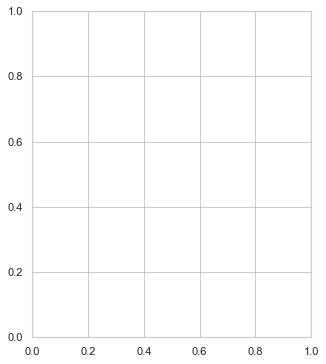

In [23]:
# scatterplot confirmed and koi_score query 1
f1, ax = plt.subplots(figsize=(5,6))
sns.set()
sns.set_style('whitegrid')
sns.set_style('ticks', {"xtick.major.size": 8,
                       "ytick.major.size": 8})
sns.histplot(query_1.score)
plt.title("Score Distribution of Confirmed Planets", weight= "bold", size = 'large')
plt.xlabel('Score')
plt.xlim(0.8, 1)

plt.show()

The plot above shows the distribution of confidence scores among the exoplanets that are within the confirmed disposition. As you can see, a lare majority of the scores are at or near 1, meaning near absolute confidence.

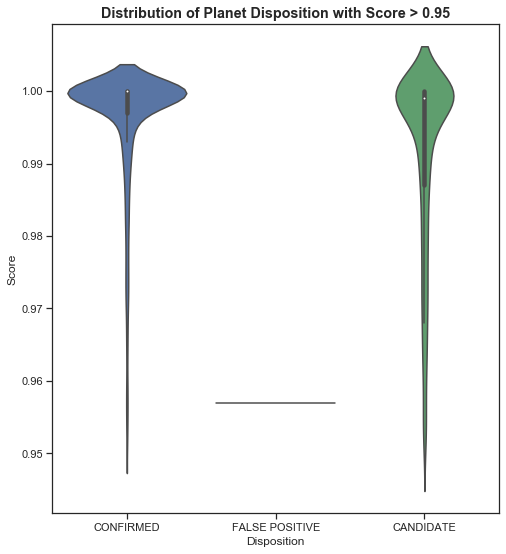

In [24]:
#Violin chart query 2 
f3, ax=plt.subplots(figsize=(8,9))
sns.set()
sns.set_style('whitegrid')
plot3 = sns.violinplot(x='disposition', y='score', data=query_2)
plt.title("Distribution of Planet Disposition with Score > 0.95", weight= "bold", size = 'large')
plt.xlabel('Disposition')
plt.ylabel('Score')
plt.show()

The plot above shows a similar distribution, but has been expanded to look at all dispositions of the exoplanets. The confirmed category appears to be more heavily distributed towards the upper end of the specturm, seeing as the plot is wider near one. The Candidate category has a somewhat similar distribution, but doesn't appear to have nearly as many observations with a value at or near one.

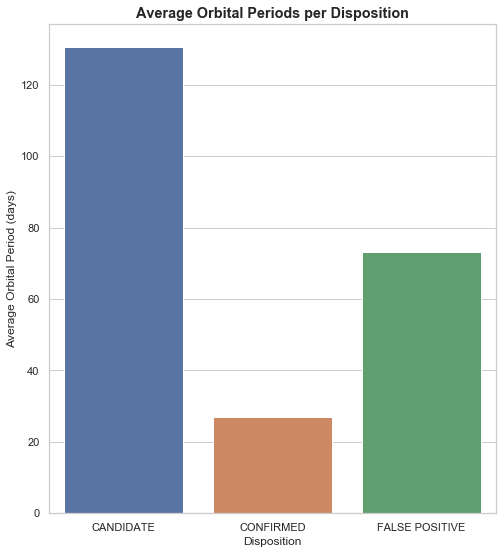

In [25]:
#query 7 scatter or bar 

f2, ax=plt.subplots(figsize=(8,9))
sns.set()
sns.set_style('whitegrid')

plot2 = sns.barplot(x = 'Disposition', y = 'Average Orbital Period (days)', data = query_7)
plt.title("Average Orbital Periods per Disposition", weight= "bold", size = 'large')
plt.show()

The plot above shows another distribution amongst the 3 disposition classes, but this time looking at the average orbital period, or it other words, how long 1 year is for each class. On average, the confirmed class has an orbital period of close to 30 days, implying that the planets within the confirmed class are very close to their host star. If this is true, we would expect the planet temperature to be quite high. The candidate class has a much higher average orbital period. Perhaps planets close to the local star are easier to identify as being an exoplanet or not, where as celestial bodies further away present challenges to the detection methods used in identifying exoplanets.

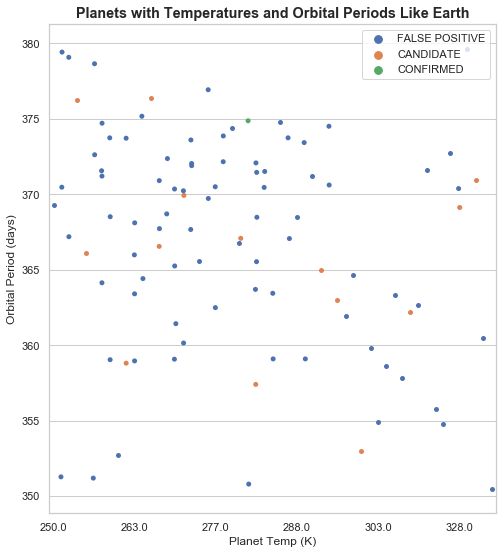

In [26]:
#query 8 scatter 
temps = np.arange(250, 350, 10)
f4, ax = plt.subplots(figsize=(8,9))
sns.set()
sns.set_style('whitegrid')
plot = sns.stripplot(x = 'Planet Temp (K)', y = 'Orbital Period (days)', data=query_8, hue='Disposition')

for ind, label in enumerate(plot.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)
plt.title("Planets with Temperatures and Orbital Periods Like Earth", weight= "bold", size = 'large')
plt.legend(loc='upper right')
plt.show()

The above plot is looking at a scatter plot distribution of the planets that had both an earth like temperature, and an earth like distance from the sun, as represented by the orbital period of the planet. It's worth noting that of all the points on the plot, only one of them is in the confirmed class, and most of the points are classified as false postives. Finding an earth like planet, even among the Kepler data, truly is like finding a needle in a haystack.

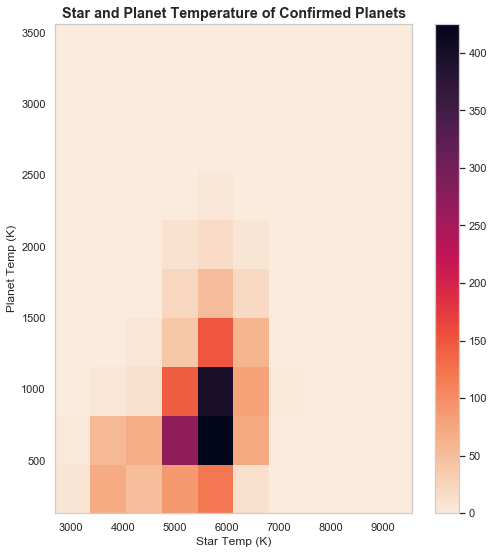

In [27]:
#query 9
f5, ax=plt.subplots(figsize=(8,9))
sns.set()
sns.set_style('whitegrid')
plot5 = plt.hist2d(x='star_temp', y='planet_temp', data=query_9, cmap = 'rocket_r')
plt.colorbar()
plt.title("Star and Planet Temperature of Confirmed Planets", weight= "bold", size = 'large')
plt.xlabel('Star Temp (K)')
plt.ylabel('Planet Temp (K)')
plt.show()

The plot above does a good job visualizing the distribution of star and planet temperatures of the confirmed planet category. As mentioned earlier, a large majority of the confirmed planets had a lower orbital period, and thus a high planet temperature, or so intuition would lead us to believe. The plot above confirms this. A large majority of the planets have temperature well above 300 K which would be roughly 27 degrees celcius. Any more than 300, and we start looking at planets that are nearly uninhabitable for human life. That being said, there do appear to be some planets that may fall within the range required by humans.